# Data Mining Approach to understand gait differences in runners with and without patellofemoral pain syndrome

Ross Brancati
Last Update: May 13, 2022

Log of Edits:
* 5/13: updated to fit with stance data for most waveforms (except flexion angles)

This notebook analyzes data based on 82 samples. Each subject has two timepoints - minute 1 and minute 21 (fatigue state). Principal Components that explained at least 90% of the total variability are included in the data matrix (96 total features)

* Label: Group (# observations)
* 1: Healthy minute 1 (Label = 1) (15)
* 2: Healthy minute 21 (Label = 2) (15)
* 3: Injured minute 1 (Label = 3) (14)
* 4: Injured minute 21 (Label = 4) (14)
* 5: Recovered minute 1 (Label = 5) (12)
* 6: Recovered minute 21 (Label = 6) (12)

**Table of Contents:**
* Part 1: Classifying injured and healthy runners at minute 1 using Logistic Regression
* Part 2: Classifying recovered runners at minute 1 as healthy or injured
* Part 3: Classifying injured and healthy runners at minute 21 using Logistic Regression
* Part 4: Classifying recovered runners at minute 21 as healthy or injured
* Part 5: Interpreting the principal components at minute 1
* Part 6: Interpreting the principal componensts at minute 21

# Part 1: Classifying injured and healthy runners at minute 1 using Logistic Regression

**Part 1 Steps:**
<br>
* Step 1: Import data and labels
* Step 2: Use LOOCV to tune hyperparameters of the logistic regression model for first minute data (healthy and injured observations)
* Step 3: Find the number of features that result in the best model performance.
* Step 4: check to see if any features are correlated using VIF. If they are, remove those features from the dataframe. 
    * Turns out we don't actually need this step. See this step in the notebook for details. Going to keep it anyway in case a reviwer asks, etc.
* Step 5: Using the number of features from step 3 and 4, train and test the logistic regression classifier. Evaluate model performance using evaluation metrics.
* Step 6: Rank feature importance by the logistic regression coefficients.

Import Packages

In [1]:
#import packages
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#Machine Learning:#
#import random forest classifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
#import mean squared error metric
from sklearn.metrics import mean_squared_error
#import train_test_split
from sklearn.model_selection import train_test_split
#import LOOCV
from sklearn.model_selection import LeaveOneOut
#import evaluation metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
#select best features
from sklearn.feature_selection import SelectKBest, chi2
#for generating QQ plots
import statsmodels.api as sm
import pylab

#import warnings and ignore them
import warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)

**Step 1: Import data and labels. Exploratory data analysis.**

In [2]:
#import data
#first 3 PCs:
data = pd.read_csv('/Users/rossbrancati/Desktop/PFP_Project/machine_learning_2/data/PC_scores_90_percent_stance.csv')

labels = pd.DataFrame(data['label'])


In [3]:
data.head()

,Subject_IDs,label,ankle_angle_x_PC_1,ankle_angle_x_PC_2,ankle_angle_x_PC_3,ankle_angle_x_PC_4,ankle_angle_y_PC_1,ankle_angle_y_PC_2,ankle_angle_y_PC_3,ankle_angle_z_PC_1,...,soleus_PC_1,soleus_PC_2,tibialis_anterior_PC_1,tibialis_anterior_PC_2,vastus_lateralis_PC_1,vastus_lateralis_PC_2,vastus_lateralis_PC_3,vastus_medialis_PC_1,vastus_medialis_PC_2,vastus_medialis_PC_3
0,S02_01,1,2.806101,0.009678,-0.732084,0.043832,1.168271,-1.763248,1.269120,-3.116460,...,-4.328538,-1.187779,-2.430297,-2.892371,-2.927154,-1.316990,-2.635071,-3.988431,-0.662095,3.058520
1,S02_021,2,3.452299,1.641437,-1.681616,1.032277,1.567736,-1.547474,1.370818,-1.442974,...,-3.847796,0.394381,-2.789415,-0.508893,-2.429919,-2.194264,-1.392130,-3.390472,-1.458550,2.257583
2,S05_01,1,2.163502,2.510179,0.828304,-1.549087,1.853943,1.662109,-0.848774,-0.010521,...,-4.636146,-0.902450,-3.794851,-2.006873,-6.426740,1.977158,-3.094643,-5.011862,14.330558,0.916002
3,S05_021,2,1.185864,3.047874,0.857436,-2.139503,3.032769,1.442237,-0.899219,0.711665,...,-4.142197,-1.315718,-5.221136,-1.289438,-5.824327,0.603359,-2.473238,-5.596816,13.511869,2.581789
4,S06_01,1,1.122482,2.660624,0.326638,0.438311,2.349488,0.073795,0.705950,-1.690354,...,-6.004903,0.201207,-4.713624,-1.827144,-4.478726,-0.657221,-0.969775,-5.398320,-0.823873,0.089206


In [4]:
labels

,label
0,1
1,2
2,1
3,2
4,1
...,...
77,4
78,3
79,4
80,5


Check for distribution of variables at minute 1

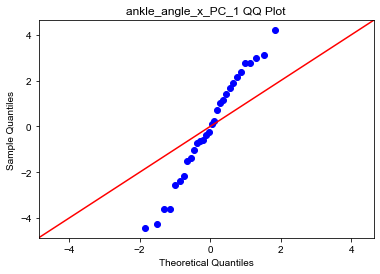

<Figure size 432x288 with 0 Axes>

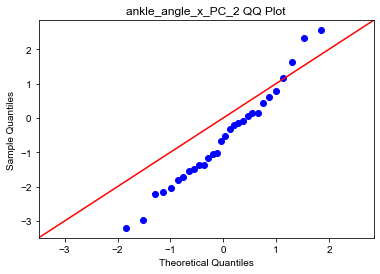

<Figure size 432x288 with 0 Axes>

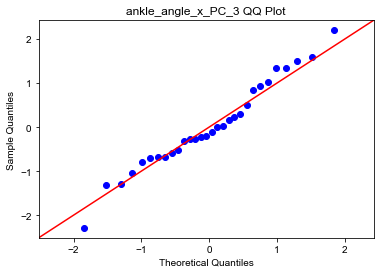

<Figure size 432x288 with 0 Axes>

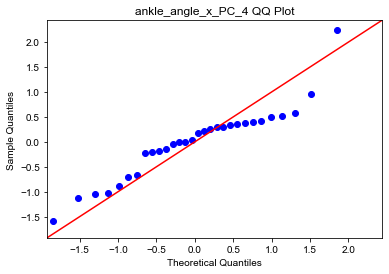

<Figure size 432x288 with 0 Axes>

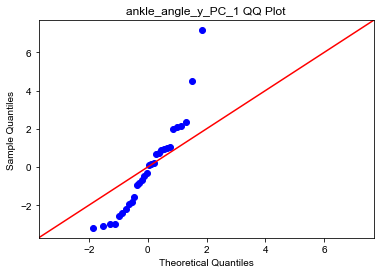

<Figure size 432x288 with 0 Axes>

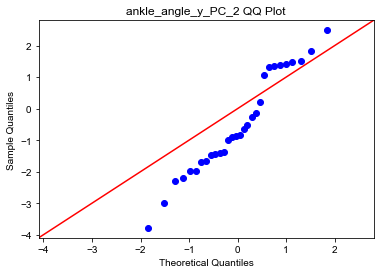

<Figure size 432x288 with 0 Axes>

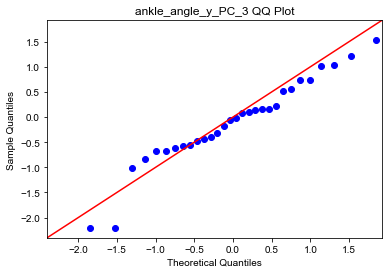

<Figure size 432x288 with 0 Axes>

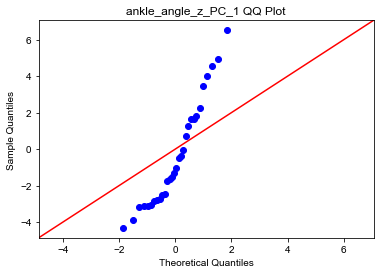

<Figure size 432x288 with 0 Axes>

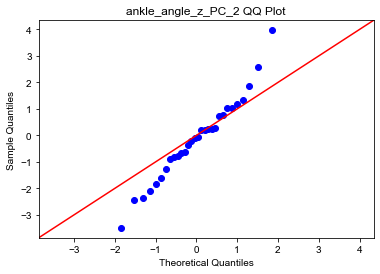

<Figure size 432x288 with 0 Axes>

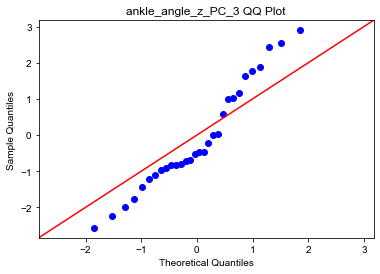

<Figure size 432x288 with 0 Axes>

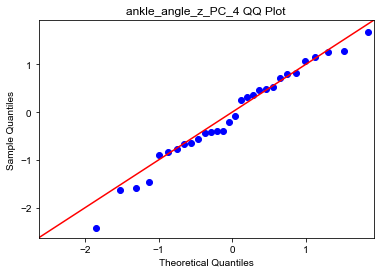

<Figure size 432x288 with 0 Axes>

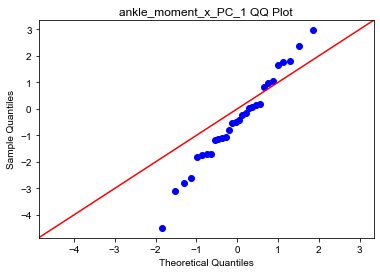

<Figure size 432x288 with 0 Axes>

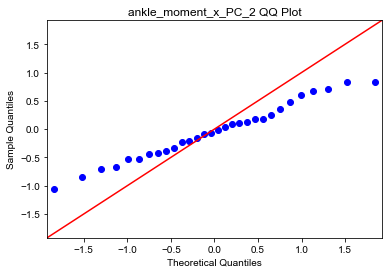

<Figure size 432x288 with 0 Axes>

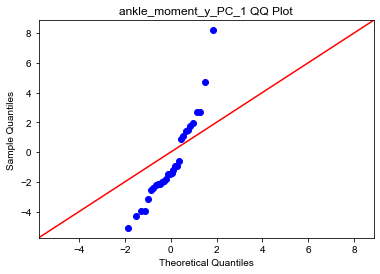

<Figure size 432x288 with 0 Axes>

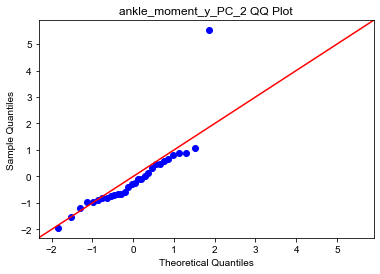

<Figure size 432x288 with 0 Axes>

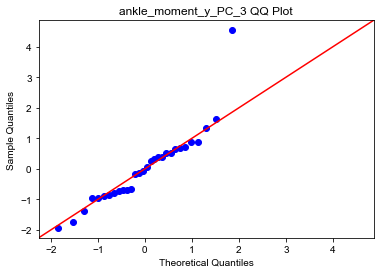

<Figure size 432x288 with 0 Axes>

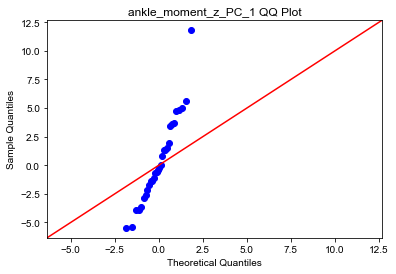

<Figure size 432x288 with 0 Axes>

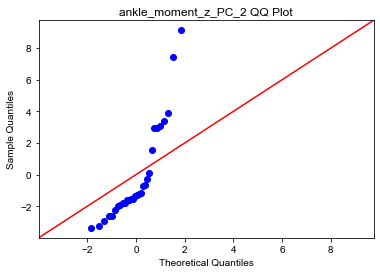

<Figure size 432x288 with 0 Axes>

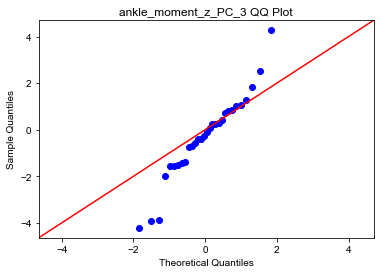

<Figure size 432x288 with 0 Axes>

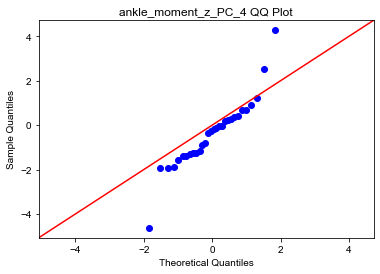

<Figure size 432x288 with 0 Axes>

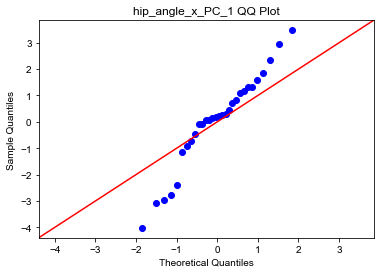

<Figure size 432x288 with 0 Axes>

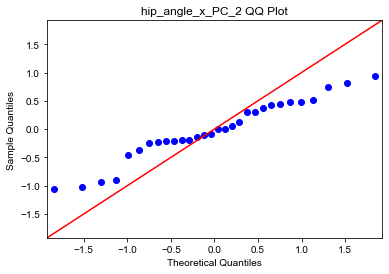

<Figure size 432x288 with 0 Axes>

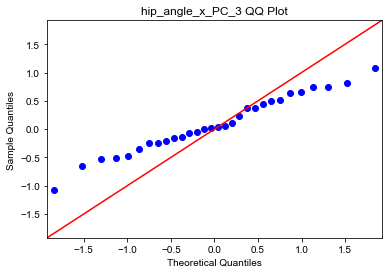

<Figure size 432x288 with 0 Axes>

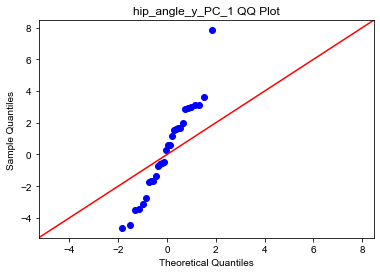

<Figure size 432x288 with 0 Axes>

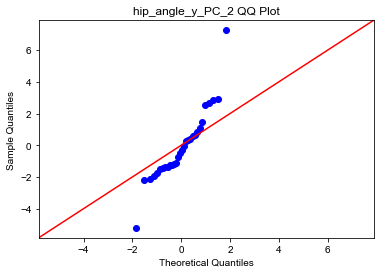

<Figure size 432x288 with 0 Axes>

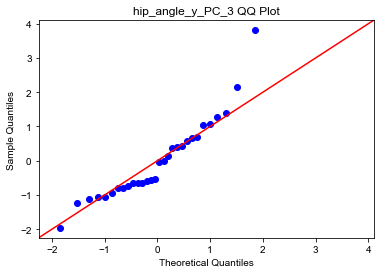

<Figure size 432x288 with 0 Axes>

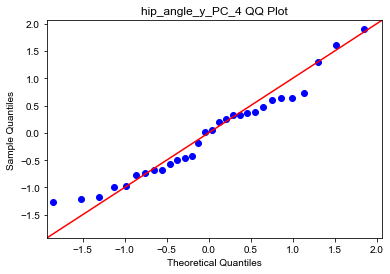

<Figure size 432x288 with 0 Axes>

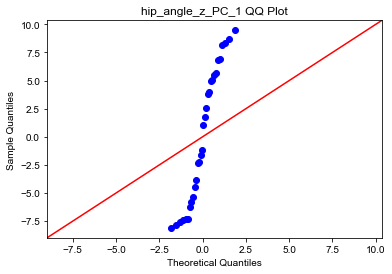

<Figure size 432x288 with 0 Axes>

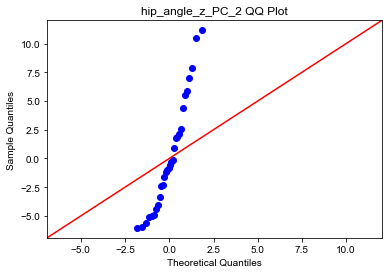

<Figure size 432x288 with 0 Axes>

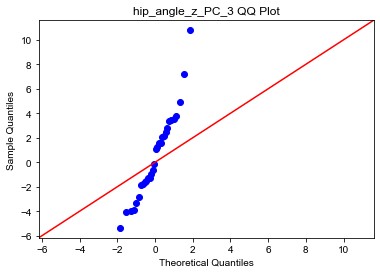

<Figure size 432x288 with 0 Axes>

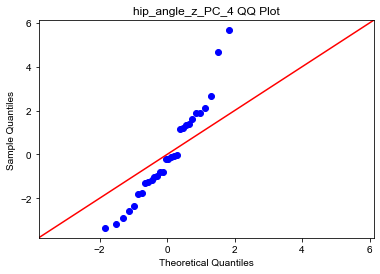

<Figure size 432x288 with 0 Axes>

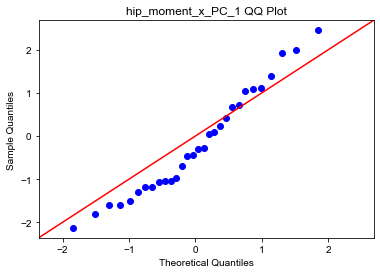

<Figure size 432x288 with 0 Axes>

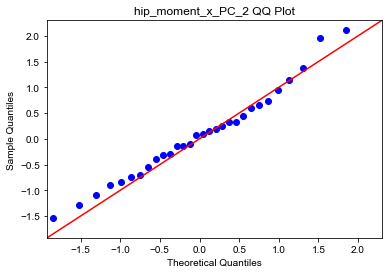

<Figure size 432x288 with 0 Axes>

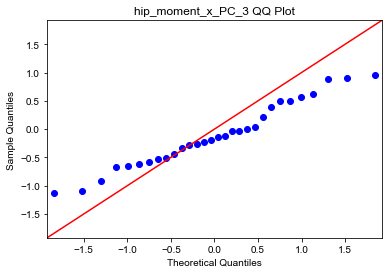

<Figure size 432x288 with 0 Axes>

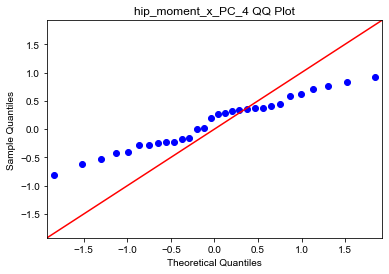

<Figure size 432x288 with 0 Axes>

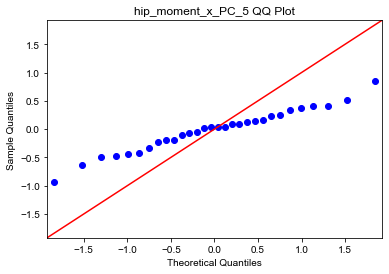

<Figure size 432x288 with 0 Axes>

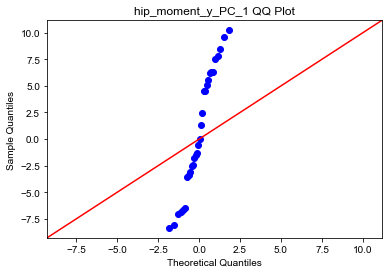

<Figure size 432x288 with 0 Axes>

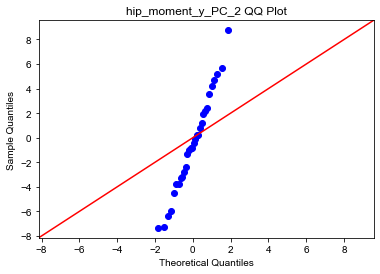

<Figure size 432x288 with 0 Axes>

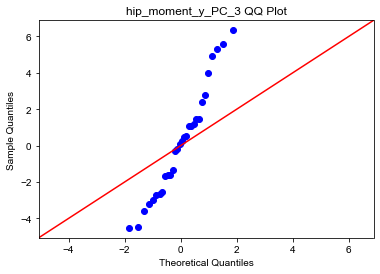

<Figure size 432x288 with 0 Axes>

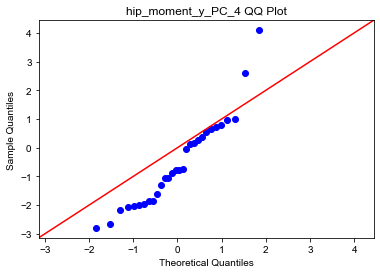

<Figure size 432x288 with 0 Axes>

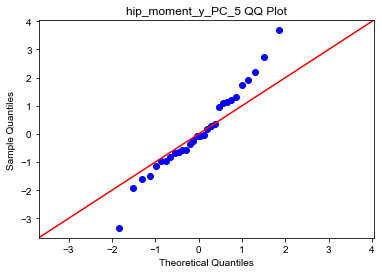

<Figure size 432x288 with 0 Axes>

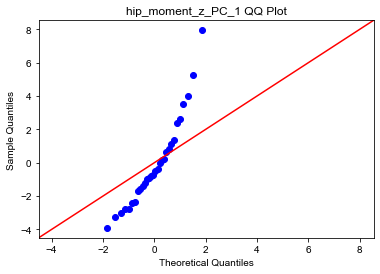

<Figure size 432x288 with 0 Axes>

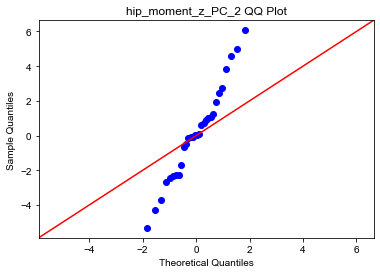

<Figure size 432x288 with 0 Axes>

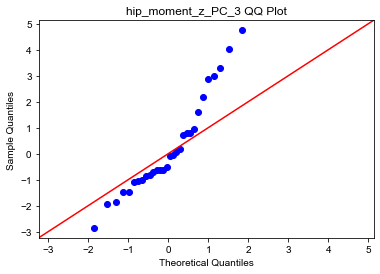

<Figure size 432x288 with 0 Axes>

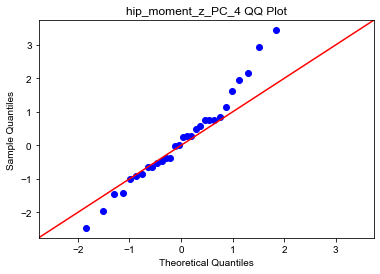

<Figure size 432x288 with 0 Axes>

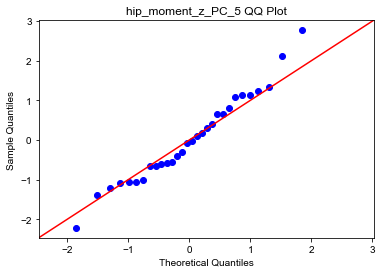

<Figure size 432x288 with 0 Axes>

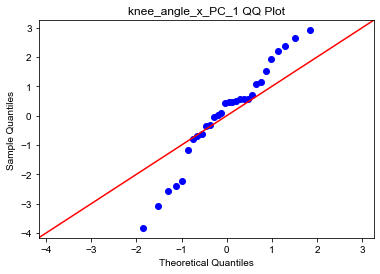

<Figure size 432x288 with 0 Axes>

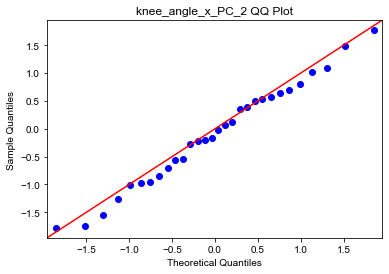

<Figure size 432x288 with 0 Axes>

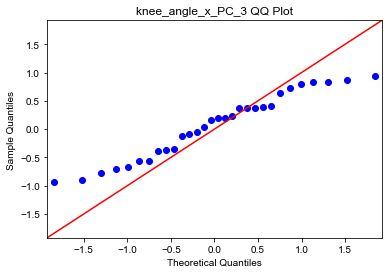

<Figure size 432x288 with 0 Axes>

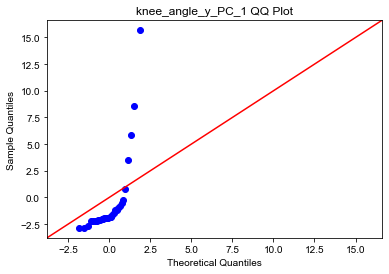

<Figure size 432x288 with 0 Axes>

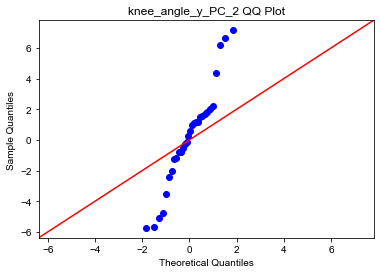

<Figure size 432x288 with 0 Axes>

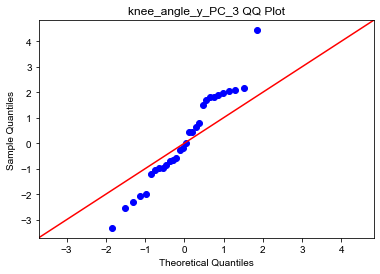

<Figure size 432x288 with 0 Axes>

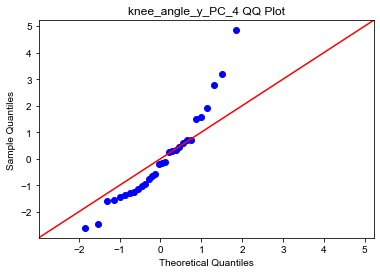

<Figure size 432x288 with 0 Axes>

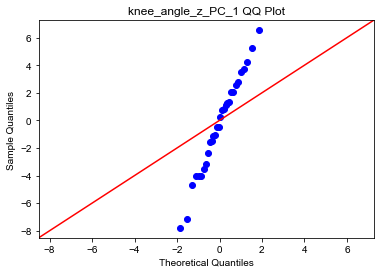

<Figure size 432x288 with 0 Axes>

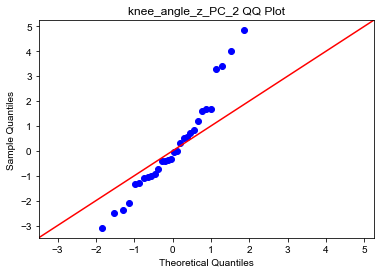

<Figure size 432x288 with 0 Axes>

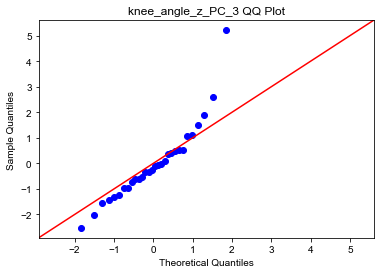

<Figure size 432x288 with 0 Axes>

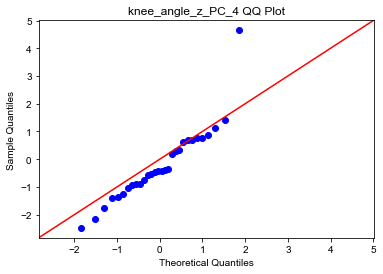

<Figure size 432x288 with 0 Axes>

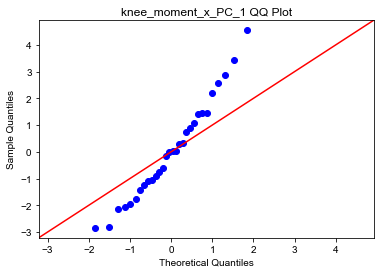

<Figure size 432x288 with 0 Axes>

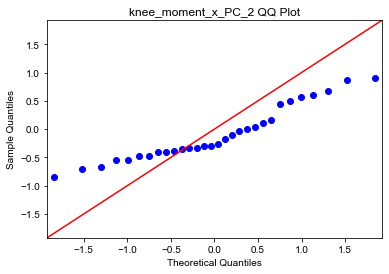

<Figure size 432x288 with 0 Axes>

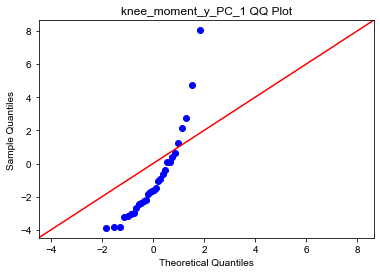

<Figure size 432x288 with 0 Axes>

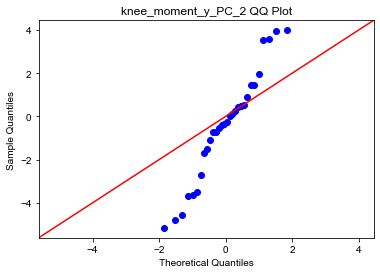

<Figure size 432x288 with 0 Axes>

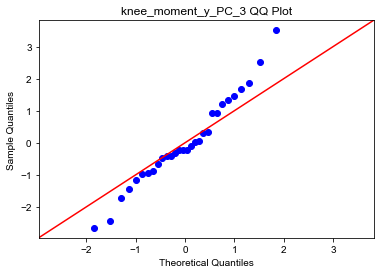

<Figure size 432x288 with 0 Axes>

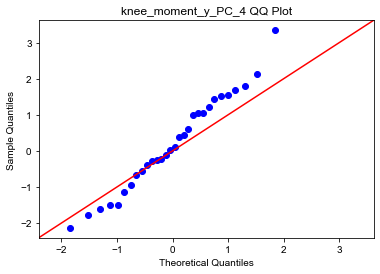

<Figure size 432x288 with 0 Axes>

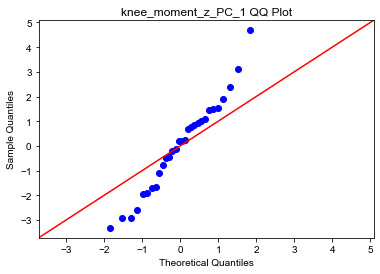

<Figure size 432x288 with 0 Axes>

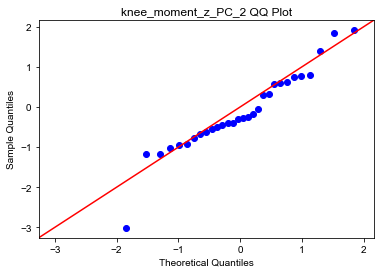

<Figure size 432x288 with 0 Axes>

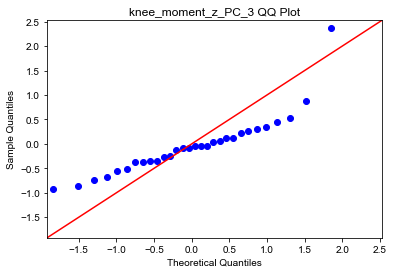

<Figure size 432x288 with 0 Axes>

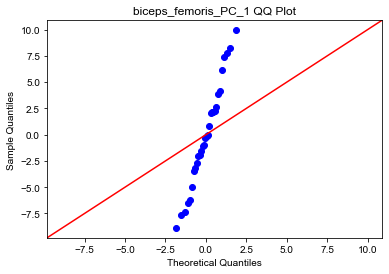

<Figure size 432x288 with 0 Axes>

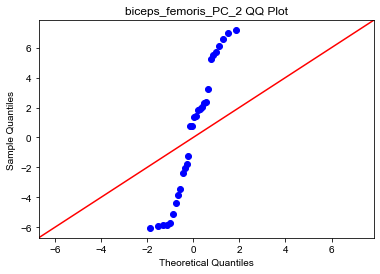

<Figure size 432x288 with 0 Axes>

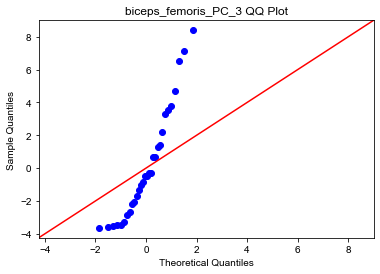

<Figure size 432x288 with 0 Axes>

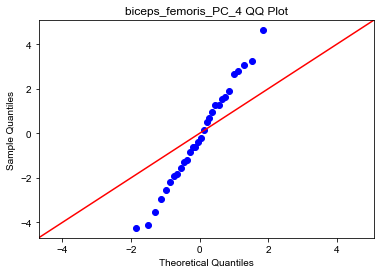

<Figure size 432x288 with 0 Axes>

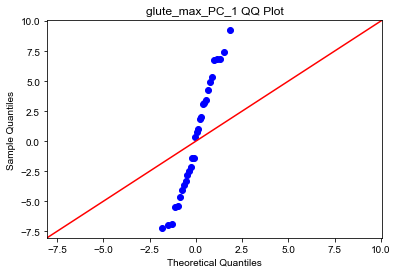

<Figure size 432x288 with 0 Axes>

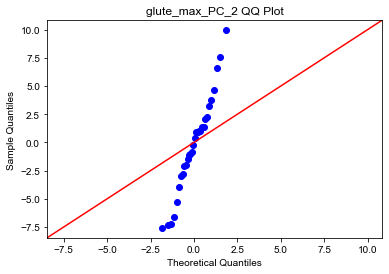

<Figure size 432x288 with 0 Axes>

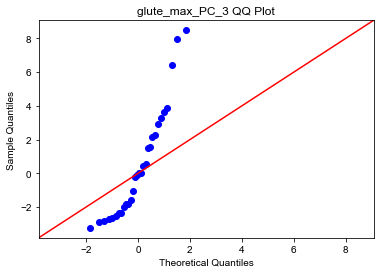

<Figure size 432x288 with 0 Axes>

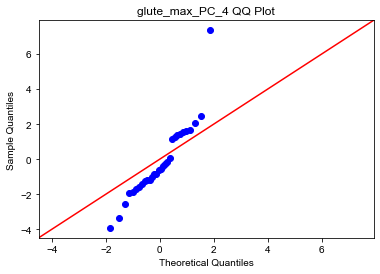

<Figure size 432x288 with 0 Axes>

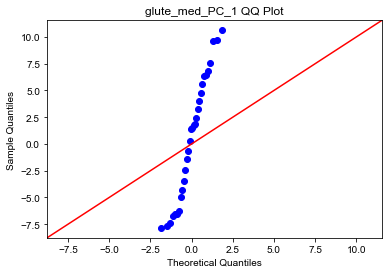

<Figure size 432x288 with 0 Axes>

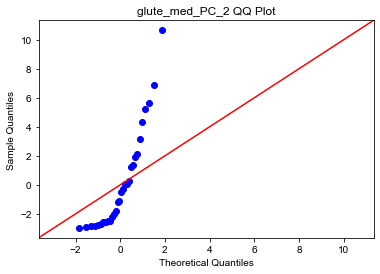

<Figure size 432x288 with 0 Axes>

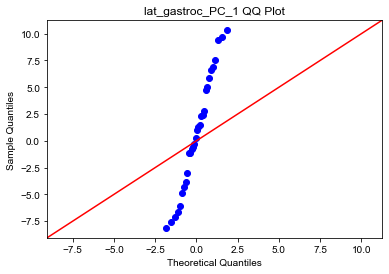

<Figure size 432x288 with 0 Axes>

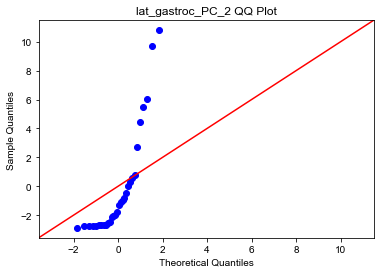

<Figure size 432x288 with 0 Axes>

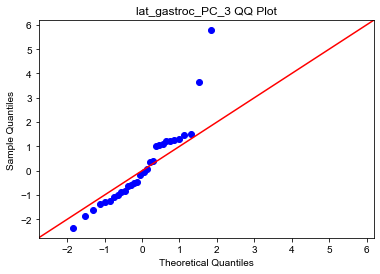

<Figure size 432x288 with 0 Axes>

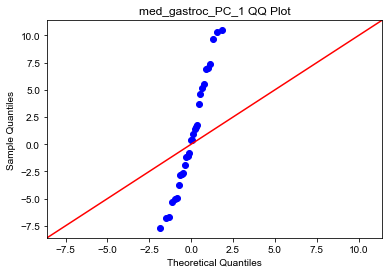

<Figure size 432x288 with 0 Axes>

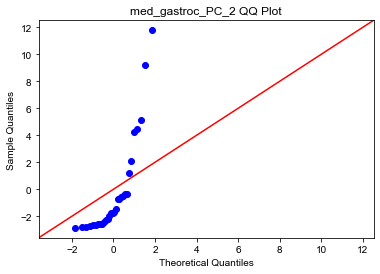

<Figure size 432x288 with 0 Axes>

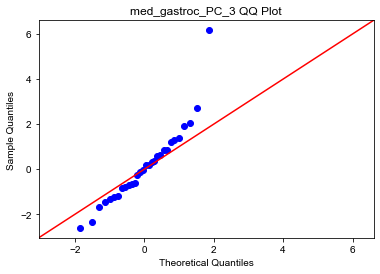

<Figure size 432x288 with 0 Axes>

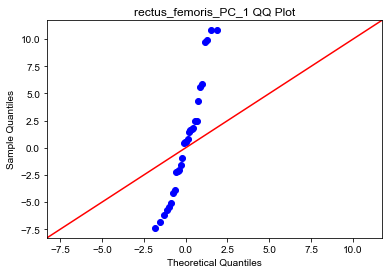

<Figure size 432x288 with 0 Axes>

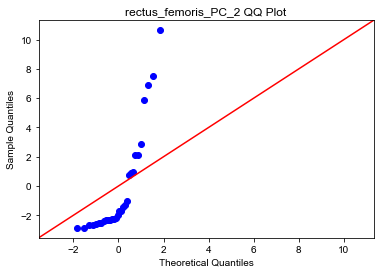

<Figure size 432x288 with 0 Axes>

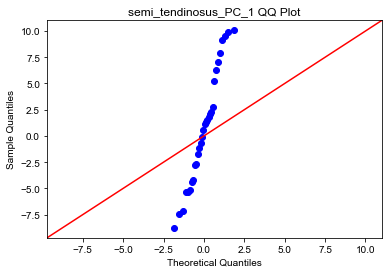

<Figure size 432x288 with 0 Axes>

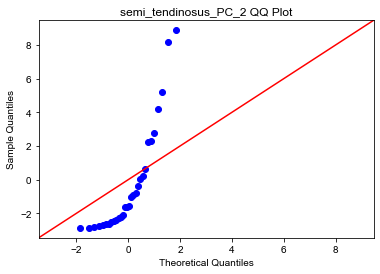

<Figure size 432x288 with 0 Axes>

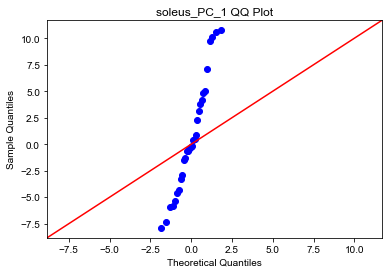

<Figure size 432x288 with 0 Axes>

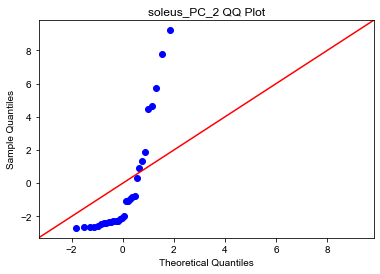

<Figure size 432x288 with 0 Axes>

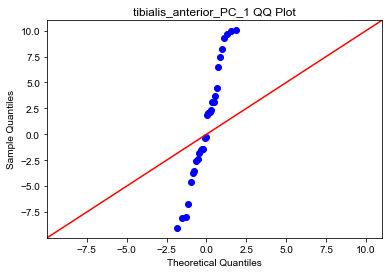

<Figure size 432x288 with 0 Axes>

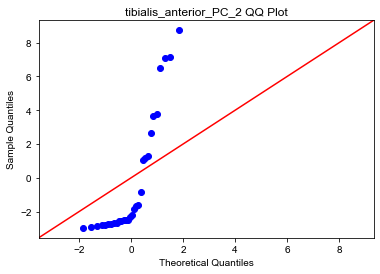

<Figure size 432x288 with 0 Axes>

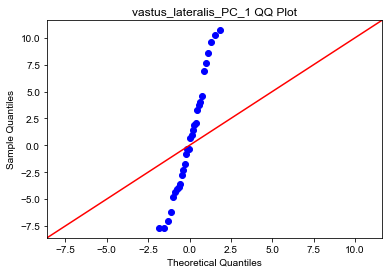

<Figure size 432x288 with 0 Axes>

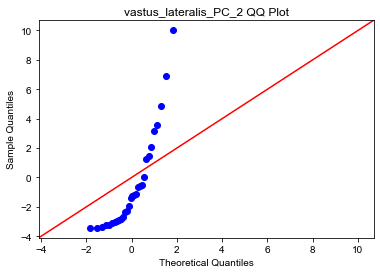

<Figure size 432x288 with 0 Axes>

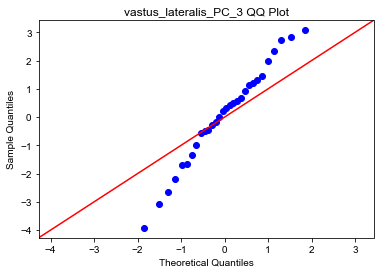

<Figure size 432x288 with 0 Axes>

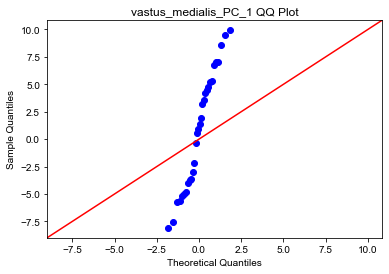

<Figure size 432x288 with 0 Axes>

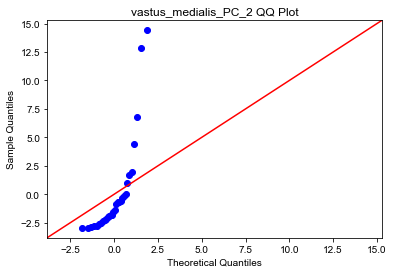

<Figure size 432x288 with 0 Axes>

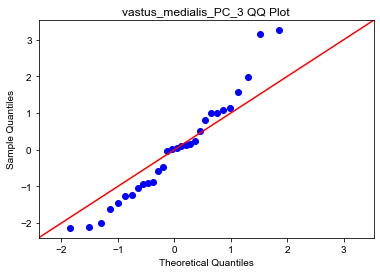

<Figure size 432x288 with 0 Axes>

In [267]:
#pull data
M1HI_data = data.loc[data['label'].isin([1,3])]
X = M1HI_data.drop(columns=['Subject_IDs','label'])
y = pd.DataFrame(M1HI_data['label'])

#loop over columns of X and generate QQ plots
for col in X.columns:
    sm.qqplot(X[col].values, line='45')
    pylab.title(col+" QQ Plot")
    pylab.show()
    pylab.clf()


**Step 2: Use LOOCV to tune hyperparameters for LOOCV model for first minute data**

In [283]:
#define LOOCV function for logistic regression
def LOOCV_prediction_LR(data, penalty, C, solver):
    
    #assign data
    M1HI_data = data.loc[data['label'].isin([1,3])]
    X = M1HI_data.drop(columns=['Subject_IDs','label'])
    y = pd.DataFrame(M1HI_data['label'])
    
    #create loocv procedure
    cv = LeaveOneOut()
    
    #lists to store true labels and predctions
    y_true = list()
    y_pred = list()
    
    #enumerate splits
    for train_ix, test_ix in cv.split(X):
        #split data into train and test sets
        X_train = X.iloc[train_ix, :]
        X_test = X.iloc[test_ix, :]
        y_train = y.iloc[train_ix]
        y_test = y.iloc[test_ix]
        #generate and fit model
        clf = LogisticRegression()
        clf.fit(X_train, y_train)
        #generate prediction
        prediction = clf.predict(X_test)
        #store prediction
        y_true.append(y_test.iloc[0])
        y_pred.append(prediction[0])
    
    MSE = mean_squared_error(y_true, y_pred)
    accuracy = accuracy_score(y_true, y_pred)
    
    return MSE, accuracy

In [284]:
#hyperparameters generate the best predictions
penalties = ['l2', 'none']
C_values = [0.1, 1, 10, 50]
solvers = ['lbfgs', 'liblinear']
#assign values penalties:
#0 - l2
#1 - none
#assign values to solvers:
#0 - lbfgs
#1 - liblinear

#create an array to store results
results = np.zeros((len(penalties)*len(C_values)*len(solvers), 5))

#iteration variable to determine which iteration you are on
iteration = 0

#loop over each of the penalty types
for p in penalties:
    #loop over the values of c
    for c in C_values:
        #loop over the solvers
        for s in solvers:
            #call function to train model and generate a prediction
            MSE, accuracy = LOOCV_prediction_LR(data, penalty=p, C=c, solver=s)

            #add the hyperparameters and MSE to the results table
            results[iteration, 0] = penalties.index(p)
            results[iteration, 1] = c
            results[iteration, 2] = solvers.index(s)
            results[iteration, 3] = MSE
            results[iteration, 4] = accuracy

        #add an iteration to the overall loop
        iteration = iteration+1
        
#convert the results array to a pandas dataframe
results_means = pd.DataFrame(results, columns=['Penalty', 'C', 'Solver', 'Mean Squared Error', 'Accuracy'])

#display the results
results_means

,Penalty,C,Solver,Mean Squared Error,Accuracy
0,0.0,0.1,1.0,1.931034,0.517241
1,0.0,1.0,1.0,1.931034,0.517241
2,0.0,10.0,1.0,1.931034,0.517241
3,0.0,50.0,1.0,1.931034,0.517241
4,1.0,0.1,1.0,1.931034,0.517241
5,1.0,1.0,1.0,1.931034,0.517241
6,1.0,10.0,1.0,1.931034,0.517241
7,1.0,50.0,1.0,1.931034,0.517241
8,0.0,0.0,0.0,0.000000,0.000000
9,0.0,0.0,0.0,0.000000,0.000000


From the above results, choose a liblinear solver, which aligns with python logstic regression documentation (https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html)

**Step 3: Find the number of features that results in the best prediction**<br>
Evaluate using performance metrics such as accuracy, F1 Score, precision, recall, and AUC ROC. This is without using cross-validation. 

-----------------------
Number of features: 1
Accuracy: 0.6666666666666666
Precision: 0.6666666666666666
Recall: 0.6666666666666666
F1: 0.6666666666666666
ROC_AUC: 0.6666666666666667
-----------------------
Number of features: 2
Accuracy: 0.6666666666666666
Precision: 0.6666666666666666
Recall: 0.6666666666666666
F1: 0.6666666666666666
ROC_AUC: 0.6666666666666667
-----------------------
Number of features: 3
Accuracy: 0.6666666666666666
Precision: 0.6666666666666666
Recall: 0.6666666666666666
F1: 0.6666666666666666
ROC_AUC: 0.6666666666666667
-----------------------
Number of features: 4
Accuracy: 0.6666666666666666
Precision: 0.6666666666666666
Recall: 0.6666666666666666
F1: 0.6666666666666666
ROC_AUC: 0.6666666666666667
-----------------------
Number of features: 5
Accuracy: 0.6666666666666666
Precision: 0.6666666666666666
Recall: 0.6666666666666666
F1: 0.6666666666666666
ROC_AUC: 0.6666666666666667
-----------------------
Number of features: 6
Accuracy: 0.6666666666666666
Precision:

/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/rossbrancati/opt/anaconda3/lib

-----------------------
Number of features: 43
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5
-----------------------
Number of features: 44
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5
-----------------------
Number of features: 45
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5
-----------------------
Number of features: 46
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5
-----------------------
Number of features: 47
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5
-----------------------
Number of features: 48
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5


/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/rossbrancati/opt/anaconda3/lib

-----------------------
Number of features: 49
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5
-----------------------
Number of features: 50
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5
-----------------------
Number of features: 51
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5
-----------------------
Number of features: 52
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5
-----------------------
Number of features: 53
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5
-----------------------
Number of features: 54
Accuracy: 0.5


/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/rossbrancati/opt/anaconda3/lib

Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5
-----------------------
Number of features: 55
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5
-----------------------
Number of features: 56
Accuracy: 0.5
Precision: 0.25
Recall: 0.5
F1: 0.3333333333333333
ROC_AUC: 0.5
-----------------------
Number of features: 57
Accuracy: 0.6666666666666666
Precision: 0.7999999999999999
Recall: 0.6666666666666666
F1: 0.6249999999999999
ROC_AUC: 0.6666666666666666
-----------------------
Number of features: 58
Accuracy: 0.6666666666666666
Precision: 0.7999999999999999
Recall: 0.6666666666666666
F1: 0.6249999999999999
ROC_AUC: 0.6666666666666666
-----------------------
Number of features: 59
Accuracy: 0.6666666666666666
Precision: 0.7999999999999999
Recall: 0.6666666666666666
F1: 0.6249999999999999
ROC_AUC: 0.6666666666666666
-----------------------
Number of features: 60
Accuracy: 0.6666666666666666
Precision: 0.7999999999999999
Recall: 0.6666666666666666
F

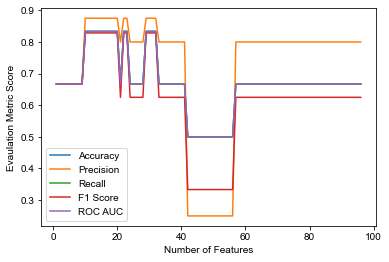

In [270]:
accuracy_ls = []
precision_ls =[]
recall_ls = []
f1_ls = []
roc_auc_ls = []
average_eval = []

#pull data
M1HI_data = data.loc[data['label'].isin([1,3])]
X = M1HI_data.drop(columns=['Subject_IDs','label'])
y = pd.DataFrame(M1HI_data['label'])

#Iterate over selecting the n best features and printing the results
for n in range(len(X.columns)):
    #First, select the best features
    #Create and fit selector
    selector = SelectKBest(k=n+1)
    selector.fit(X, y)
    # Get columns to keep and create new dataframe with those only
    cols = selector.get_support(indices=True)
    best_features = X.iloc[:,cols]

    #build the classifier
    clf_log_reg = LogisticRegression()

    #split training and testing data
    X_train, X_test, y_train, y_test = train_test_split(best_features, y, test_size=0.20, random_state=42)

    #fit the model with training data
    clf_log_reg.fit(X_train, y_train)

    #generate prediction of the testing dataset
    y_pred = clf_log_reg.predict(X_test)

    #evaluate the model performance
    print('-----------------------')
    print('Number of features:', n+1)
    print('Accuracy:', accuracy_score(y_test, y_pred))
    print('Precision:', precision_score(y_test, y_pred, average='weighted'))
    print('Recall:', recall_score(y_test, y_pred, average='weighted'))
    print('F1:', f1_score(y_test, y_pred, average='weighted'))
    print('ROC_AUC:', roc_auc_score(y_test, y_pred, average='weighted'))
    
    accuracy_ls.append(accuracy_score(y_test, y_pred))
    precision_ls.append(precision_score(y_test, y_pred, average='weighted'))
    recall_ls.append(recall_score(y_test, y_pred, average='weighted'))
    f1_ls.append(f1_score(y_test, y_pred, average='weighted'))
    roc_auc_ls.append(roc_auc_score(y_test, y_pred, average='weighted'))

x = list(range(1,len(X.columns)+1))
plt.plot(x, accuracy_ls, label='Accuracy')
plt.plot(x, precision_ls, label='Precision')
plt.plot(x, recall_ls, label='Recall')
plt.plot(x, f1_ls, label='F1 Score')
plt.plot(x, roc_auc_ls, label='ROC AUC')
plt.ylabel('Evaulation Metric Score')
plt.xlabel('Number of Features')
plt.legend()
plt.show()

#create a data frame of the evaluation metrics for plotting in R
#evaluation_metrics_M1 = {'iteration': list(range(1,171)), 'accuracy': accuracy_ls, 'precision': precision_ls, 'recall': recall_ls, 'f1': f1_ls, 'roc_auc': roc_auc_ls}
#evaluation_metrics_df_M1 = pd.DataFrame(data=evaluation_metrics)
#evaluation_metrics_df_M1
#evaluation_metrics_df_M1.to_csv('/Users/rossbrancati/Desktop/PFP_Project/machine_learning/machine_learning_data/results_feb_2022/evaluation_metrics_M1.csv')

In [ ]:
#First, select the best features
#Create and fit selector
selector = SelectKBest(k=7)
selector.fit(X, y)
# Get columns to keep and create new dataframe with those only
cols = selector.get_support(indices=True)
best_features = X.iloc[:,cols]
best_features

Use Leave One Out Cross Validation to prevent overfitting. Calculate mean accuracy for each set of features used.

-----------------------
Number of features: 1
Accuracy: 0.7586206896551724
ROC_AUC: 0.7595238095238095
MSE: 0.9655172413793104
-----------------------
Number of features: 2
Accuracy: 0.7241379310344828
ROC_AUC: 0.7238095238095239
MSE: 1.103448275862069
-----------------------
Number of features: 3
Accuracy: 0.8275862068965517
ROC_AUC: 0.8285714285714286
MSE: 0.6896551724137931
-----------------------
Number of features: 4
Accuracy: 0.8275862068965517
ROC_AUC: 0.8285714285714286
MSE: 0.6896551724137931
-----------------------
Number of features: 5
Accuracy: 0.7931034482758621
ROC_AUC: 0.7928571428571429
MSE: 0.8275862068965517
-----------------------
Number of features: 6
Accuracy: 0.7931034482758621
ROC_AUC: 0.7904761904761906
MSE: 0.8275862068965517
-----------------------
Number of features: 7
Accuracy: 0.7931034482758621
ROC_AUC: 0.7904761904761906
MSE: 0.8275862068965517
-----------------------
Number of features: 8
Accuracy: 0.6896551724137931
ROC_AUC: 0.6880952380952382
MSE: 1.24

-----------------------
Number of features: 67
Accuracy: 0.6206896551724138
ROC_AUC: 0.6166666666666667
MSE: 1.5172413793103448
-----------------------
Number of features: 68
Accuracy: 0.6206896551724138
ROC_AUC: 0.6166666666666667
MSE: 1.5172413793103448
-----------------------
Number of features: 69
Accuracy: 0.6206896551724138
ROC_AUC: 0.6166666666666667
MSE: 1.5172413793103448
-----------------------
Number of features: 70
Accuracy: 0.5517241379310345
ROC_AUC: 0.5452380952380953
MSE: 1.793103448275862
-----------------------
Number of features: 71
Accuracy: 0.5517241379310345
ROC_AUC: 0.5452380952380953
MSE: 1.793103448275862
-----------------------
Number of features: 72
Accuracy: 0.5517241379310345
ROC_AUC: 0.5452380952380953
MSE: 1.793103448275862
-----------------------
Number of features: 73
Accuracy: 0.6206896551724138
ROC_AUC: 0.6142857142857143
MSE: 1.5172413793103448
-----------------------
Number of features: 74
Accuracy: 0.6206896551724138
ROC_AUC: 0.6142857142857143
MSE

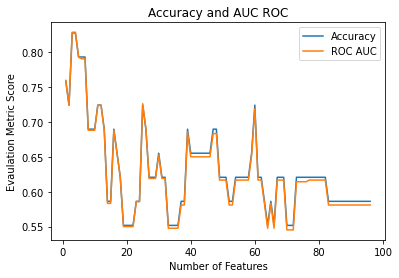

No handles with labels found to put in legend.


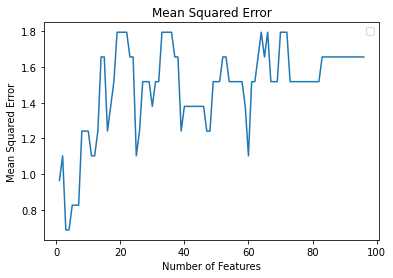

In [17]:
accuracy_ls = []
roc_auc_ls = []
mse_ls = []

#pull data
M1HI_data = data.loc[data['label'].isin([1,3])]
X = M1HI_data.drop(columns=['Subject_IDs','label'])
y = pd.DataFrame(M1HI_data['label'])

#Iterate over selecting the n best features and printing the results
for n in range(len(X.columns)):
    #First, select the best features
    #Create and fit selector
    selector = SelectKBest(k=n+1)
    selector.fit(X, y)
    # Get columns to keep and create new dataframe with those only
    cols = selector.get_support(indices=True)
    best_features = X.iloc[:,cols]
    
    
    #LOOCV Procedure:
    #create loocv procedure
    cv = LeaveOneOut()
    #lists to store true labels and predctions
    y_true = list()
    y_pred = list()
    #enumerate splits
    for train_ix, test_ix in cv.split(best_features):
        #split data into train and test sets
        X_train = best_features.iloc[train_ix, :]
        X_test = best_features.iloc[test_ix, :]
        y_train = y.iloc[train_ix]
        y_test = y.iloc[test_ix]
        #generate and fit model according to the cross-validation procedure we used to select hyperparameters
        clf = LogisticRegression(penalty='l2', C=1.0, solver='liblinear')
        clf.fit(X_train, y_train)
        #generate prediction
        prediction = clf.predict(X_test)
        #store prediction
        y_true.append(y_test.label.values[0])
        y_pred.append(prediction[0])
    
    #evaluate the model performance at each possible combination of features
    print('-----------------------')
    print('Number of features:', n+1)
    print('Accuracy:', accuracy_score(y_true, y_pred))
    print('ROC_AUC:', roc_auc_score(y_true, y_pred, average='weighted'))
    print('MSE:', mean_squared_error(y_true, y_pred))
    
    accuracy_ls.append(accuracy_score(y_true, y_pred))
    roc_auc_ls.append(roc_auc_score(y_true, y_pred, average='weighted'))
    mse_ls.append(mean_squared_error(y_true, y_pred))

x = list(range(1,len(X.columns)+1))
plt.plot(x, accuracy_ls, label='Accuracy')
plt.plot(x, roc_auc_ls, label='ROC AUC')
plt.ylabel('Evaulation Metric Score')
plt.xlabel('Number of Features')
plt.title('Accuracy and AUC ROC')
plt.legend()
plt.show()
plt.clf()

plt.plot(x, mse_ls)
plt.ylabel('Mean Squared Error')
plt.xlabel('Number of Features')
plt.title('Mean Squared Error')
plt.legend()
plt.show()

#create a data frame of the evaluation metrics for plotting in R
evaluation_metrics_M1 = {'iteration': list(range(1,len(X.columns)+1)), 'accuracy': [i * 100 for i in accuracy_ls], 'roc_auc': [i * 100 for i in roc_auc_ls]}
evaluation_metrics_df_M1 = pd.DataFrame(data=evaluation_metrics_M1)
#evaluation_metrics_df_M1
evaluation_metrics_df_M1.to_csv('/Users/rossbrancati/Desktop/PFP_Project/machine_learning_2/results/evaluation_metrics_M1.csv')


Using LOOCV, the feature set that resulted in the best classification accuracy was with 4 total features. Notice the dropoff in accuracy when we use LOOCV instead of just a train/test split. 

**Step 4: Check to see if any of the 28 features in the data matrix are correlated. If they are, remove them from the model**

Check if any of the features of the above model are correlated using Variance Inflation Factor (VIF), which would be an issue. anything over 10 here if too high of a VIF (reference: https://towardsdatascience.com/everything-you-need-to-know-about-multicollinearity-2f21f082d6dc). 

Turns out that we actually don't have to do this for a couple of reasons:
* The PCA generates newly uncorrelated variables, so principal components of each variable cannot be correlated. 
* The nature of biomechanics research has some correlation between variables. For example, knee and ankle flexion are going to have some correlation between them

I'm still going to keep it in the notebook in case a reviewer questions our decision.

**Step 5: Using the best selected features, train and test a logistic regression classifier.**

This model is the same exact model from above with the number of features resulting in the highest classification accuracy.

In [19]:
#adjust feature count
feature_count=4

#First, select the best features
#Create and fit selector
selector = SelectKBest(k=feature_count)
selector.fit(X, y)
#Get columns to keep and create new dataframe with those only
cols = selector.get_support(indices=True)
best_features = X.iloc[:,cols]

#LOOCV Procedure:
#create loocv procedure
cv = LeaveOneOut()
#lists to store true labels and predctions
y_true = list()
y_pred = list()
#create a list to store LR odds for each CV fold
lr_odds_mean = np.zeros(best_features.shape[1])
#enumerate splits
for train_ix, test_ix in cv.split(best_features):
    #split data into train and test sets
    X_train = best_features.iloc[train_ix, :]
    X_test = best_features.iloc[test_ix, :]
    y_train = y.iloc[train_ix]
    y_test = y.iloc[test_ix]
    #generate and fit model according to the cross-validation procedure we used to select hyperparameters
    clf = LogisticRegression(penalty='l2', C=1.0, solver='liblinear')
    clf.fit(X_train, y_train)
    #generate prediction
    prediction = clf.predict(X_test)
    #store prediction
    y_true.append(y_test.label.values[0])
    y_pred.append(prediction[0])
    #store logistic regression odds for each CV fold
    lr_odds = np.exp(clf.coef_[0])
    lr_odds_mean = lr_odds_mean + lr_odds
#divide the summed LR odds by the number of CV folds to get average 
lr_odds_mean = lr_odds_mean/best_features.shape[0]

#evaluate the model performance at each possible combination of features
print('-----------------------')
print('Number of features:', feature_count)
print('Accuracy:', accuracy_score(y_true, y_pred))
print('ROC_AUC:', roc_auc_score(y_true, y_pred, average='weighted'))
print('MSE:', mean_squared_error(y_true, y_pred))


#plotting the roc curve
#y_pred_proba = clf_log_reg.predict_proba(X_test)[::,1]
#y_test_binary = y_test.replace(3,0).squeeze()
#fpr, tpr, _ = roc_curve(y_test_binary, y_pred_proba)
#plt.plot(fpr,tpr)
#plt.ylabel('True Positive Rate')
#plt.xlabel('False Positive Rate')
#plt.show()


-----------------------
Number of features: 4
Accuracy: 0.8275862068965517
ROC_AUC: 0.8285714285714286
MSE: 0.6896551724137931


**Step 6: Rank the features that were most important in classifying healthy vs. injured.** <br>
Note: Because of the logit function, logistic regression coefficients represent the log odds that an observation is in the target class, so these log odds should be transformed to regular odds to make sense of them. (https://towardsdatascience.com/interpreting-coefficients-in-linear-and-logistic-regression-6ddf1295f6f1)

,feature,coefficient
2,knee_angle_x_PC_3,3.617733
1,hip_moment_y_PC_3,1.301013
3,glute_max_PC_2,0.928672
0,hip_moment_y_PC_1,0.800766


<BarContainer object of 4 artists>

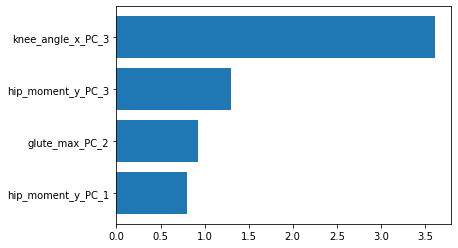

In [20]:
#data frame of feature coefficients
best_features_sorted = pd.DataFrame({
    'feature': X_train.columns,
    'coefficient': lr_odds_mean
}).sort_values(by='coefficient')

#display data frame in descending order of coefficients
best_features_sorted_descending = pd.DataFrame({'feature': X_train.columns, 'coefficient': lr_odds_mean}).sort_values(by='coefficient', ascending=False)
display(best_features_sorted_descending)
best_features_sorted_descending.to_csv('/Users/rossbrancati/Desktop/PFP_Project/machine_learning_2/results/coefficients_M1.csv')

#generate bar plot of feature importance
plt.barh(best_features_sorted.feature, best_features_sorted.coefficient)

Interpreting these coefficients: For every unit increase in a **feature**, the odds that the runner is classified as healthy is **the coefficient** times more likely than them not being classified as healthy, so the scores of this principal component are most influential on the classification of the two groups compared with other features used in this model. 

# Part 2: Using the models generated above, classify the recovered runners as either healthy or injured 

**Train a model using the important features from above on all healthy and injured runnners. Test model on recovered runners**

Healthy Count: 7
Injured Count: 5


/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


,label,Recovered Prediction,Subject_IDs
16,1,1,S14_01
32,1,1,S28_01
36,1,3,S30_01
40,1,3,S33_01
44,1,1,S35_01
48,1,1,S37_01
56,1,3,S42_01
58,1,1,S46_01
62,1,3,S48_01
64,1,1,S49_01


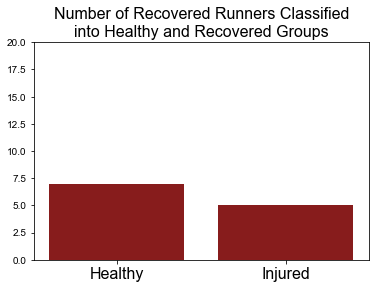

In [36]:
#pull data
M1HI_data = data.loc[data['label'].isin([1,3])]
X = M1HI_data.drop(columns=['Subject_IDs','label'])
y = pd.DataFrame(M1HI_data['label'])

#Select the best features
#Create and fit selector
selector = SelectKBest(k=feature_count)
selector.fit(X, y)
#Get columns to keep and create new dataframe with those only
cols = selector.get_support(indices=True)
best_features = X.iloc[:,cols]

#Get columns of dataframe with best features and recovered runners at minute 1
M1R_data = data.loc[data['label'].isin([5])]
#assign all 5 labels to 1 (labelling recovered runners as healthy)
M1R_data.loc[:,'label'] = 1

#build the classifier
clf = LogisticRegression()

#assign healthy and injured to train
#assign recovered to test
X_train = best_features
X_test = M1R_data[best_features.columns]
y_train = y
y_test = pd.DataFrame(M1R_data['label'])

#fit the model with training data
clf.fit(X_train, y_train)

#generate prediction of the testing dataset
y_pred_recovered = clf.predict(X_test)

#counts of healthy and injured predictions
healthy_count = np.count_nonzero(y_pred_recovered == 1)
injured_count = np.count_nonzero(y_pred_recovered == 3)
print('Healthy Count:', healthy_count)
print('Injured Count:', injured_count)
plt.rcParams.update({'font.sans-serif':'Arial'})
fig = plt.figure()
classes = ['Healthy','Injured']
counts = [healthy_count, injured_count]
plt.bar(classes,counts, color=(0.53,.109,.109,1))
plt.title('Number of Recovered Runners Classified\ninto Healthy and Recovered Groups', size=16)
plt.ylim(0,20)
plt.xticks(size=16)

#display the predictions
y_test['Recovered Prediction'] = y_pred_recovered
y_test.join(M1R_data['Subject_IDs'])


Create a quick plot of number of features (x axis) and number of injured classification (y axis). I found out that these do not go in order of the features with the best LR odds. See the cell below for that analysis.

/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on 

/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on 

/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on 

/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on 

Text(0.5, 0, 'Number of Features')

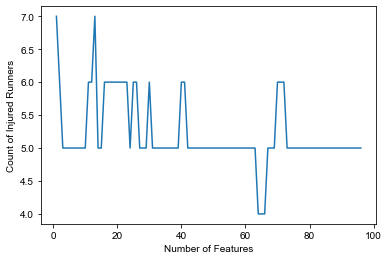

In [289]:
#create list of runners classified as injured
injured_counts = []

#pull data
M1HI_data = data.loc[data['label'].isin([1,3])]
X = M1HI_data.drop(columns=['Subject_IDs','label'])
y = pd.DataFrame(M1HI_data['label'])

for c in range(len(X.columns)):
    #Create and fit selector
    selector = SelectKBest(k=c+1)
    selector.fit(X, y)
    #Get columns to keep and create new dataframe with those only
    cols = selector.get_support(indices=True)
    best_features = X.iloc[:,cols]
    #Get columns of dataframe with best features and recovered runners at minute 1
    M1R_data = data.loc[data['label'].isin([5])]
    #assign all 5 labels to 1 (labelling recovered runners as healthy)
    M1R_data.loc[:,'label'] = 1
    #build the classifier
    clf = LogisticRegression()
    #assign healthy and injured to train
    #assign recovered to test
    X_train = best_features
    X_test = M1R_data[best_features.columns]
    y_train = y
    y_test = pd.DataFrame(M1R_data['label'])
    #fit the model with training data
    clf.fit(X_train, y_train)
    #generate prediction of the testing dataset
    y_pred_recovered = clf.predict(X_test)
    #counts of healthy and injured predictions
    healthy_count = np.count_nonzero(y_pred_recovered == 1)
    injured_count = np.count_nonzero(y_pred_recovered == 3)
    #append injured_count list
    injured_counts.append(injured_count)
    
    #print results
    #print("Number of features:", c)
    #print("Injured Count:", injured_count)
    #print("Healthy Count:", healthy_count)
    #print("-------------------------------")
    
plt.plot(range(1,c+2),injured_counts)
plt.ylabel('Count of Injured Runners')
plt.xlabel('Number of Features')

# Part 3: Does fatigue impact the important features that differentiate healthy and injured runners? Instead of using minute 1 data, use minute 21 data, and repeat Part 1

**Steps in Part 3:**
<br>
* Step 1: Find the number of features that result in the best model performance.
* Step 2: Using the number of features from step 1, train and test the logistic regression classifier. Evaluate model performance using evaluation metrics.
* Step 3: Rank feature importance by the logistic regression coefficients.
* Step 4: Display M1's and M21's important features near each other.

**Step 1: Find the number of features that result in the best model performance (without cross-validation).**

-----------------------
Number of features: 1
Accuracy: 0.6666666666666666
Precision: 0.7999999999999999
Recall: 0.6666666666666666
F1: 0.6249999999999999
ROC_AUC: 0.6666666666666666
-----------------------
Number of features: 2
Accuracy: 0.5
Precision: 0.5
Recall: 0.5
F1: 0.48571428571428577
ROC_AUC: 0.5
-----------------------
Number of features: 3
Accuracy: 0.5
Precision: 0.5
Recall: 0.5
F1: 0.48571428571428577
ROC_AUC: 0.5
-----------------------
Number of features: 4
Accuracy: 0.6666666666666666
Precision: 0.6666666666666666
Recall: 0.6666666666666666
F1: 0.6666666666666666
ROC_AUC: 0.6666666666666667
-----------------------
Number of features: 5
Accuracy: 0.5
Precision: 0.5
Recall: 0.5
F1: 0.48571428571428577
ROC_AUC: 0.5
-----------------------
Number of features: 6
Accuracy: 0.8333333333333334
Precision: 0.875
Recall: 0.8333333333333334
F1: 0.8285714285714286
ROC_AUC: 0.8333333333333333
-----------------------
Number of features: 7
Accuracy: 0.6666666666666666
Precision: 0.6666

-----------------------
Number of features: 51
Accuracy: 0.5
Precision: 0.5
Recall: 0.5
F1: 0.48571428571428577
ROC_AUC: 0.5
-----------------------
Number of features: 52
Accuracy: 0.5
Precision: 0.5
Recall: 0.5
F1: 0.48571428571428577
ROC_AUC: 0.5
-----------------------
Number of features: 53
Accuracy: 0.5
Precision: 0.5
Recall: 0.5
F1: 0.48571428571428577
ROC_AUC: 0.5
-----------------------
Number of features: 54
Accuracy: 0.5
Precision: 0.5
Recall: 0.5
F1: 0.48571428571428577
ROC_AUC: 0.5
-----------------------
Number of features: 55
Accuracy: 0.5
Precision: 0.5
Recall: 0.5
F1: 0.48571428571428577
ROC_AUC: 0.5
-----------------------
Number of features: 56
Accuracy: 0.5
Precision: 0.5
Recall: 0.5
F1: 0.48571428571428577
ROC_AUC: 0.5
-----------------------
Number of features: 57
Accuracy: 0.5
Precision: 0.5
Recall: 0.5
F1: 0.48571428571428577
ROC_AUC: 0.5
-----------------------
Number of features: 58
Accuracy: 0.5
Precision: 0.5
Recall: 0.5
F1: 0.48571428571428577
ROC_AUC: 0.5


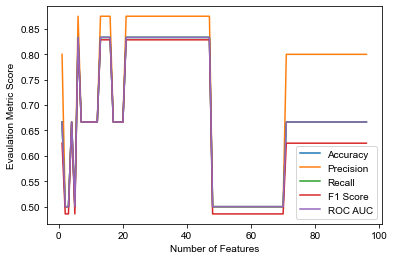

In [295]:
accuracy_ls_M21 = []
precision_ls_M21 =[]
recall_ls_M21 = []
f1_ls_M21 = []
roc_auc_ls_M21 = []

#pull data
M21HI_data = data.loc[data['label'].isin([2,4])]
X_M21 = M21HI_data.drop(columns=['Subject_IDs','label'])
y_M21 = pd.DataFrame(M21HI_data['label'])

#Iterate over selecting the n best features and printing the results
for n in range(len(X_M21.columns)):
    #First, select the best features
    #Create and fit selector
    selector_M21 = SelectKBest(k=n+1)
    selector_M21.fit(X_M21, y_M21)
    # Get columns to keep and create new dataframe with those only
    cols = selector_M21.get_support(indices=True)
    best_features_M21 = X_M21.iloc[:,cols]

    #build the classifier
    clf_M21 = LogisticRegression()

    #split training and testing data
    X_train_M21, X_test_M21, y_train_M21, y_test_M21 = train_test_split(best_features_M21, y_M21, test_size=0.20, random_state=42)

    #fit the model with training data
    clf_M21.fit(X_train_M21, y_train_M21)

    #generate prediction of the testing dataset
    y_pred_M21 = clf_M21.predict(X_test_M21)

    #evaluate the model performance
    print('-----------------------')
    print('Number of features:', n+1)
    print('Accuracy:', accuracy_score(y_test_M21, y_pred_M21))
    print('Precision:', precision_score(y_test_M21, y_pred_M21, average='weighted'))
    print('Recall:', recall_score(y_test_M21, y_pred_M21, average='weighted'))
    print('F1:', f1_score(y_test_M21, y_pred_M21, average='weighted'))
    print('ROC_AUC:', roc_auc_score(y_test_M21, y_pred_M21, average='weighted'))
    
    accuracy_ls_M21.append(accuracy_score(y_test_M21, y_pred_M21))
    precision_ls_M21.append(precision_score(y_test_M21, y_pred_M21, average='weighted'))
    recall_ls_M21.append(recall_score(y_test_M21, y_pred_M21, average='weighted'))
    f1_ls_M21.append(f1_score(y_test_M21, y_pred_M21, average='weighted'))
    roc_auc_ls_M21.append(roc_auc_score(y_test_M21, y_pred_M21, average='weighted'))

x = list(range(1,len(X_M21.columns)+1))
plt.plot(x, accuracy_ls_M21, label='Accuracy')
plt.plot(x, precision_ls_M21, label='Precision')
plt.plot(x, recall_ls_M21, label='Recall')
plt.plot(x, f1_ls_M21, label='F1 Score')
plt.plot(x, roc_auc_ls_M21, label='ROC AUC')
plt.ylabel('Evaulation Metric Score')
plt.xlabel('Number of Features')
plt.legend()
plt.show()

#create a data frame of the evaluation metrics for plotting in R
#evaluation_metrics_M21 = {'iteration': list(range(1,138)), 'accuracy': accuracy_ls_21, 'precision': precision_ls_21, 'recall': recall_ls_21, 'f1': f1_ls_21, 'roc_auc': roc_auc_ls_21}
#evaluation_metrics_df_M21 = pd.DataFrame(data=evaluation_metrics_M21)
#evaluation_metrics_df_M21
#evaluation_metrics_df_M21.to_csv('/Users/rossbrancati/Desktop/PFP_Project/machine_learning/machine_learning_data/results_feb_2022/evaluation_metrics_M21.csv')

Use leave one out cross validation to prevent overfitting.

-----------------------
Number of features: 1
Accuracy: 0.7241379310344828
ROC_AUC: 0.7214285714285714
MSE: 1.103448275862069
-----------------------
Number of features: 2
Accuracy: 0.7931034482758621
ROC_AUC: 0.7952380952380953
MSE: 0.8275862068965517
-----------------------
Number of features: 3
Accuracy: 0.7586206896551724
ROC_AUC: 0.7571428571428572
MSE: 0.9655172413793104
-----------------------
Number of features: 4
Accuracy: 0.6896551724137931
ROC_AUC: 0.6904761904761906
MSE: 1.2413793103448276
-----------------------
Number of features: 5
Accuracy: 0.6896551724137931
ROC_AUC: 0.6904761904761906
MSE: 1.2413793103448276
-----------------------
Number of features: 6
Accuracy: 0.7241379310344828
ROC_AUC: 0.7238095238095239
MSE: 1.103448275862069
-----------------------
Number of features: 7
Accuracy: 0.6206896551724138
ROC_AUC: 0.6214285714285714
MSE: 1.5172413793103448
-----------------------
Number of features: 8
Accuracy: 0.6896551724137931
ROC_AUC: 0.6904761904761906
MSE: 1.241

-----------------------
Number of features: 67
Accuracy: 0.6551724137931034
ROC_AUC: 0.6547619047619049
MSE: 1.3793103448275863
-----------------------
Number of features: 68
Accuracy: 0.6206896551724138
ROC_AUC: 0.6190476190476191
MSE: 1.5172413793103448
-----------------------
Number of features: 69
Accuracy: 0.6206896551724138
ROC_AUC: 0.6190476190476191
MSE: 1.5172413793103448
-----------------------
Number of features: 70
Accuracy: 0.6206896551724138
ROC_AUC: 0.6190476190476191
MSE: 1.5172413793103448
-----------------------
Number of features: 71
Accuracy: 0.6206896551724138
ROC_AUC: 0.6190476190476191
MSE: 1.5172413793103448
-----------------------
Number of features: 72
Accuracy: 0.6896551724137931
ROC_AUC: 0.6880952380952382
MSE: 1.2413793103448276
-----------------------
Number of features: 73
Accuracy: 0.6896551724137931
ROC_AUC: 0.6880952380952382
MSE: 1.2413793103448276
-----------------------
Number of features: 74
Accuracy: 0.6896551724137931
ROC_AUC: 0.6880952380952382


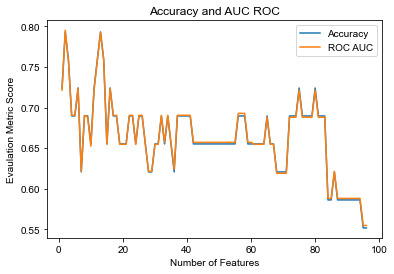

No handles with labels found to put in legend.


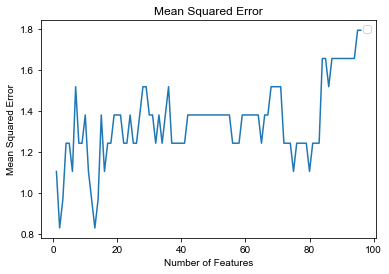

In [37]:
accuracy_ls_M21 = []
roc_auc_ls_M21 = []
mse_ls_M21 = []

#pull data
#pull data
M21HI_data = data.loc[data['label'].isin([2,4])]
X_M21 = M21HI_data.drop(columns=['Subject_IDs','label'])
y_M21 = pd.DataFrame(M21HI_data['label'])

#Iterate over selecting the n best features and printing the results
for n in range(len(X_M21.columns)):
    #First, select the best features
    #Create and fit selector
    selector_M21 = SelectKBest(k=n+1)
    selector_M21.fit(X_M21, y_M21)
    # Get columns to keep and create new dataframe with those only
    cols = selector_M21.get_support(indices=True)
    best_features_M21 = X_M21.iloc[:,cols]
    
    #LOOCV Procedure:
    #create loocv procedure
    cv = LeaveOneOut()
    #lists to store true labels and predctions
    y_true_M21 = list()
    y_pred_M21 = list()
    #enumerate splits
    for train_ix, test_ix in cv.split(best_features_M21):
        #split data into train and test sets
        X_train_M21 = best_features_M21.iloc[train_ix, :]
        X_test_M21 = best_features_M21.iloc[test_ix, :]
        y_train_M21 = y_M21.iloc[train_ix]
        y_test_M21 = y_M21.iloc[test_ix]
        #generate and fit model according to the cross-validation procedure we used to select hyperparameters
        clf_M21 = LogisticRegression(penalty='l2', C=1.0, solver='liblinear')
        clf_M21.fit(X_train_M21, y_train_M21)
        #generate prediction
        prediction_M21 = clf_M21.predict(X_test_M21)
        #store prediction
        y_true_M21.append(y_test_M21.label.values[0])
        y_pred_M21.append(prediction_M21[0])
    
    #evaluate the model performance at each possible combination of features
    print('-----------------------')
    print('Number of features:', n+1)
    print('Accuracy:', accuracy_score(y_true_M21, y_pred_M21))
    print('ROC_AUC:', roc_auc_score(y_true_M21, y_pred_M21, average='weighted'))
    print('MSE:', mean_squared_error(y_true_M21, y_pred_M21))
    
    accuracy_ls_M21.append(accuracy_score(y_true_M21, y_pred_M21))
    roc_auc_ls_M21.append(roc_auc_score(y_true_M21, y_pred_M21, average='weighted'))
    mse_ls_M21.append(mean_squared_error(y_true_M21, y_pred_M21))

x = list(range(1,len(X_M21.columns)+1))
plt.plot(x, accuracy_ls_M21, label='Accuracy')
plt.plot(x, roc_auc_ls_M21, label='ROC AUC')
plt.ylabel('Evaulation Metric Score')
plt.xlabel('Number of Features')
plt.title('Accuracy and AUC ROC')
plt.legend()
plt.show()
plt.clf()

plt.plot(x, mse_ls_M21)
plt.ylabel('Mean Squared Error')
plt.xlabel('Number of Features')
plt.title('Mean Squared Error')
plt.legend()
plt.show()

#create a data frame of the evaluation metrics for plotting in R
evaluation_metrics_M21 = {'iteration': list(range(1,len(X_M21.columns)+1)), 'accuracy': [i * 100 for i in accuracy_ls_M21], 'roc_auc': [i * 100 for i in roc_auc_ls_M21]}
evaluation_metrics_df_M21 = pd.DataFrame(data=evaluation_metrics_M21)
#evaluation_metrics_df_M1
evaluation_metrics_df_M21.to_csv('/Users/rossbrancati/Desktop/PFP_Project/machine_learning_2/results/evaluation_metrics_M21.csv')


**Step 2: Using the number of features from step 1, train and test the logistic regression classifier. Evaluate model performance using evaluation metrics.**

In [38]:
#select number of features:
feature_count_M21 = 13

#First, select the best features
#Create and fit selector
selector_M21 = SelectKBest(k=feature_count_M21)
selector_M21.fit(X_M21, y_M21)
#Get columns to keep and create new dataframe with those only
cols = selector_M21.get_support(indices=True)
best_features_M21 = X_M21.iloc[:,cols]

#for when forcing M21 data to consist of same features as M1
#best_features_M21 = X_M21[X_train.columns]

#LOOCV Procedure:
#create loocv procedure
cv = LeaveOneOut()
#lists to store true labels and predctions
y_true_M21 = list()
y_pred_M21 = list()
#create a list to store LR odds
lr_odds_M21_mean = np.zeros(best_features_M21.shape[1])
#enumerate splits
for train_ix, test_ix in cv.split(best_features_M21):
    #split data into train and test sets
    X_train_M21 = best_features_M21.iloc[train_ix, :]
    X_test_M21 = best_features_M21.iloc[test_ix, :]
    y_train_M21 = y_M21.iloc[train_ix]
    y_test_M21 = y_M21.iloc[test_ix]
    #generate and fit model according to the cross-validation procedure we used to select hyperparameters
    clf_M21 = LogisticRegression(penalty='l2', C=1.0, solver='liblinear')
    clf_M21.fit(X_train_M21, y_train_M21)
    #generate prediction
    prediction_M21 = clf_M21.predict(X_test_M21)
    #store prediction
    y_true_M21.append(y_test_M21.label.values[0])
    y_pred_M21.append(prediction_M21[0])
    #store logistic regression odds for each CV fold
    lr_odds_M21 = np.exp(clf_M21.coef_[0])
    lr_odds_M21_mean = lr_odds_M21_mean + lr_odds_M21
#divide the summed LR odds by the number of CV folds to get average 
lr_odds_M21_mean = lr_odds_M21_mean/best_features_M21.shape[0]



#evaluate the model performance
print('-----------------------')
print('Number of features:', feature_count_M21)
print('Accuracy:', accuracy_score(y_true_M21, y_pred_M21))
print('ROC_AUC:', roc_auc_score(y_true_M21, y_pred_M21, average='weighted'))
print('MSE:', mean_squared_error(y_true_M21, y_pred_M21))

-----------------------
Number of features: 13
Accuracy: 0.7931034482758621
ROC_AUC: 0.7928571428571429
MSE: 0.8275862068965517


**Step 3: Rank the features that were most important in classifying healthy vs. injured at minute 21.** <br>
Note: Because of the logit function, logistic regression coefficients represent the log odds that an observation is in the target class, so these log odds should be transformed to regular odds to make sense of them. (https://towardsdatascience.com/interpreting-coefficients-in-linear-and-logistic-regression-6ddf1295f6f1)

,feature,coefficient
9,knee_moment_x_PC_2,2.341352
6,hip_moment_y_PC_3,1.607871
7,knee_angle_x_PC_3,1.514628
10,knee_moment_y_PC_3,1.478897
11,biceps_femoris_PC_1,1.451875
1,ankle_angle_x_PC_3,1.341727
12,soleus_PC_2,1.272376
3,ankle_moment_z_PC_1,0.933656
2,ankle_moment_x_PC_2,0.802621
5,hip_moment_y_PC_1,0.790368


<BarContainer object of 13 artists>

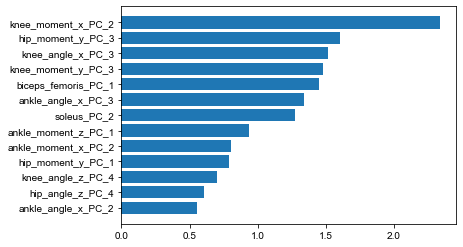

In [45]:
#data frame of average of feature coefficients for each model built during CV
best_features_sorted_M21 = pd.DataFrame({
    'feature': X_train_M21.columns,
    'coefficient': lr_odds_M21_mean
}).sort_values(by='coefficient')

#display data frame in descending order of coefficients
best_features_sorted_descending_M21 = pd.DataFrame({'feature': X_train_M21.columns, 'coefficient': lr_odds_M21_mean}).sort_values(by='coefficient', ascending=False)
display(best_features_sorted_descending_M21)
best_features_sorted_descending_M21.to_csv('/Users/rossbrancati/Desktop/PFP_Project/machine_learning_2/results/coefficients_M21.csv')


#generate bar plot of feature importance
plt.barh(best_features_sorted_M21.feature, best_features_sorted_M21.coefficient)

In [47]:
list(best_features_sorted_descending_M21['feature'])

['knee_moment_x_PC_2',
 'hip_moment_y_PC_3',
 'knee_angle_x_PC_3',
 'knee_moment_y_PC_3',
 'biceps_femoris_PC_1',
 'ankle_angle_x_PC_3',
 'soleus_PC_2',
 'ankle_moment_z_PC_1',
 'ankle_moment_x_PC_2',
 'hip_moment_y_PC_1',
 'knee_angle_z_PC_4',
 'hip_angle_z_PC_4',
 'ankle_angle_x_PC_2']

# Part 4: Classify the recovered runners at minute 21 as either healthy or injured

**Train a model using the important features from above on all healthy and injured runnners. Test model on recovered runners**

Healthy Count: 5
Injured Count: 7


/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


,label,Recovered Prediction,Subject_IDs
17,2,4,S14_021
33,2,4,S28_021
37,2,4,S30_021
41,2,4,S33_021
45,2,2,S35_021
49,2,4,S37_021
57,2,2,S42_021
59,2,2,S46_021
63,2,4,S48_021
65,2,2,S49_021


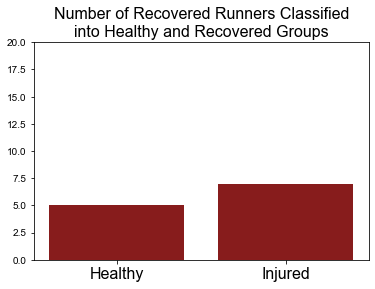

In [44]:
#pull data
M21HI_data = data.loc[data['label'].isin([2,4])]
X_M21 = M21HI_data.drop(columns=['Subject_IDs','label'])
y_M21 = pd.DataFrame(M21HI_data['label'])

#Select the best features
#Create and fit selector
selector_M21 = SelectKBest(k=feature_count_M21)
selector_M21.fit(X_M21, y_M21)
#Get columns to keep and create new dataframe with those only
cols = selector_M21.get_support(indices=True)
best_features_M21 = X_M21.iloc[:,cols]

#Get columns of dataframe with best features and recovered runners at minute 1
M21R_data = data.loc[data['label'].isin([6])]
#assign all 5 labels to 2 (labelling recovered runners as healthy)
M21R_data.loc[:,'label'] = 2

#build the classifier
clf = LogisticRegression()

#assign healthy and injured to train
#assign recovered to test
X_train_M21 = best_features_M21
X_test_M21 = M21R_data[best_features_M21.columns]
y_train_M21 = y_M21
y_test_M21 = pd.DataFrame(M21R_data['label'])

#fit the model with training data
clf.fit(X_train_M21, y_train_M21)

#generate prediction of the testing dataset
y_pred_recovered_M21 = clf.predict(X_test_M21)

#counts of healthy and injured predictions
healthy_count_M21 = np.count_nonzero(y_pred_recovered_M21 == 2)
injured_count_M21 = np.count_nonzero(y_pred_recovered_M21 == 4)
print('Healthy Count:', healthy_count_M21)
print('Injured Count:', injured_count_M21)
plt.rcParams.update({'font.sans-serif':'Arial'})
fig = plt.figure()
classes = ['Healthy','Injured']
counts_M21 = [healthy_count_M21, injured_count_M21]
plt.bar(classes,counts_M21, color=(0.53,.109,.109,1))
plt.title('Number of Recovered Runners Classified\ninto Healthy and Recovered Groups', size=16)
plt.ylim(0,20)
plt.xticks(size=16)

#display the predictions
y_test_M21['Recovered Prediction'] = y_pred_recovered_M21
y_test_M21.join(M21R_data['Subject_IDs'])

/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on 

/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on 

/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on 

/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/Users/rossbrancati/opt/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on 

Text(0.5, 0, 'Number of Features')

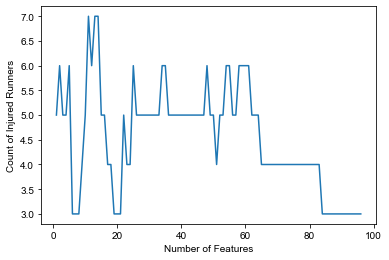

In [306]:
#create list of runners classified as injured
injured_counts_M21 = []

#pull data
M21HI_data = data.loc[data['label'].isin([2,4])]
X_M21 = M21HI_data.drop(columns=['Subject_IDs','label'])
y_M21 = pd.DataFrame(M21HI_data['label'])

for c in range(len(X_M21.columns)):
    #Create and fit selector
    selector_M21 = SelectKBest(k=c+1)
    selector_M21.fit(X_M21, y_M21)
    #Get columns to keep and create new dataframe with those only
    cols = selector_M21.get_support(indices=True)
    best_features_M21 = X_M21.iloc[:,cols]
    #Get columns of dataframe with best features and recovered runners at minute 1
    M21R_data = data.loc[data['label'].isin([6])]
    #assign all 5 labels to 1 (labelling recovered runners as healthy)
    M21R_data.loc[:,'label'] = 1
    #build the classifier
    clf = LogisticRegression()
    #assign healthy and injured to train
    #assign recovered to test
    X_train_M21 = best_features_M21
    X_test_M21 = M21R_data[best_features_M21.columns]
    y_train_M21 = y_M21
    y_test_M21 = pd.DataFrame(M21R_data['label'])
    #fit the model with training data
    clf.fit(X_train_M21, y_train_M21)
    #generate prediction of the testing dataset
    y_pred_recovered_M21 = clf.predict(X_test_M21)
    #counts of healthy and injured predictions
    healthy_count_M21 = np.count_nonzero(y_pred_recovered_M21 == 2)
    injured_count_M21 = np.count_nonzero(y_pred_recovered_M21 == 4)
    #append injured_count list
    injured_counts_M21.append(injured_count_M21)
    
plt.plot(range(1,c+2),injured_counts_M21)
plt.ylabel('Count of Injured Runners')
plt.xlabel('Number of Features')

# Part 5: Intepreting the principal components for the scores at the first minute

To interpret the PCs, plot each eigenvector or loading. Then, plot the eigenvector multiplied by the 5th and 95th percentile score for minute 1 of the healthy and injured group. Plot these two waveforms with the eigenvector. It will also help to plot the mean of each kinetic, kinematic, and EMG waveform for interpretation analysis. It is also helpful to calculate the mean PC score so you can tell which waveform (5th or 95th percentile) is associated with which group.

* Not all of these plots are necessary, it was just easier to plot all of them and choose the plots needed for interpretation

**First, kinetic and kinematic waveforms**

----------------------
Healthy Average: -1.864786899231606
Injured Average: 0.780953994476062
5th Percentile: -3.5870789193291692
95th Percentile: 4.263169460939895


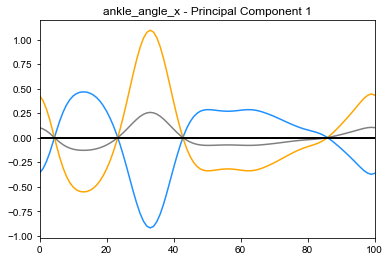

----------------------
Healthy Average: 0.2828585477078501
Injured Average: -0.2420804865136613
5th Percentile: -2.7272574343298928
95th Percentile: 3.071871353622967


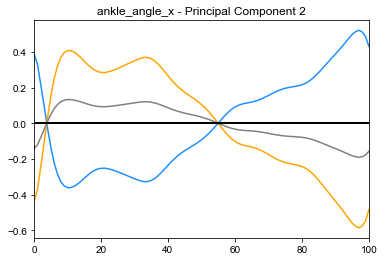

----------------------
Healthy Average: -0.6499478501301896
Injured Average: -0.07091334286611899
5th Percentile: -2.428842918022481
95th Percentile: 2.2218962889466667


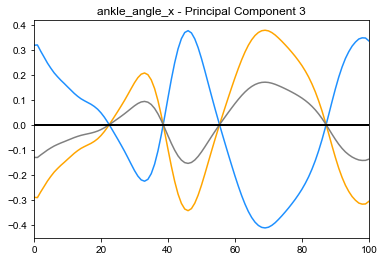

----------------------
Healthy Average: -0.11054156618209063
Injured Average: -0.34783128385158696
5th Percentile: -1.0883392920997108
95th Percentile: 1.9005096566713506


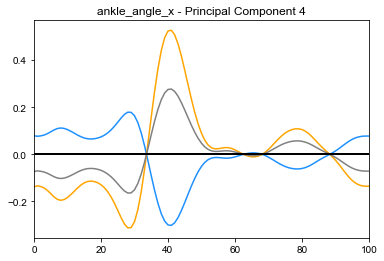

----------------------
Healthy Average: 0.34323635797660373
Injured Average: -0.49172257724865853
5th Percentile: -1.3641547884052696
95th Percentile: 1.2944930575177285


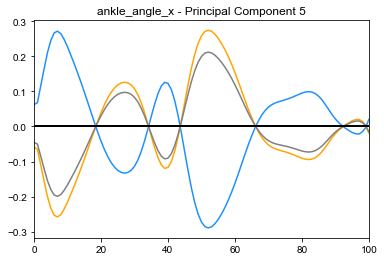

----------------------
Healthy Average: 0.117668543451498
Injured Average: 0.02660579660489469
5th Percentile: -0.7209461577304989
95th Percentile: 0.7912077283843219


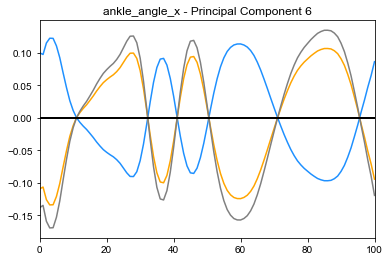

----------------------
Healthy Average: -0.19771110065967057
Injured Average: -0.0875539762974886
5th Percentile: -0.6651449016702587
95th Percentile: 0.7657680381567895


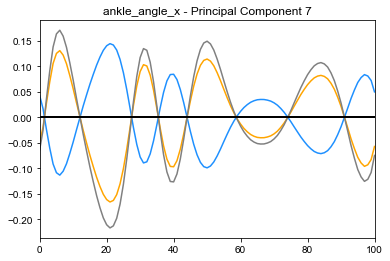

----------------------
Healthy Average: 1.5862469648035293
Injured Average: -0.8312054469957597
5th Percentile: -3.8966975713571697
95th Percentile: 4.947309145220159


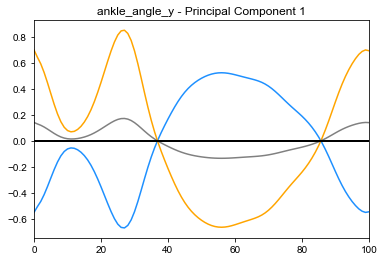

----------------------
Healthy Average: -0.39122299850362896
Injured Average: -0.5997636992156021
5th Percentile: -3.355249206031374
95th Percentile: 3.660790560558723


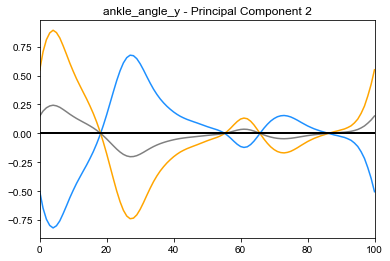

----------------------
Healthy Average: -1.0493986900528125
Injured Average: -0.19991538649555057
5th Percentile: -2.717983012878122
95th Percentile: 3.3706026562584133


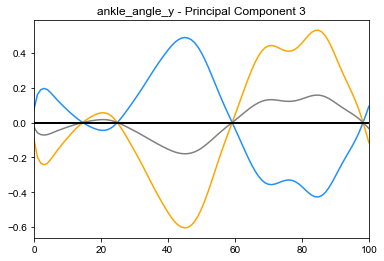

----------------------
Healthy Average: -0.3742434412360446
Injured Average: -0.7375967976366655
5th Percentile: -1.6195988990664638
95th Percentile: 1.8659775466802624


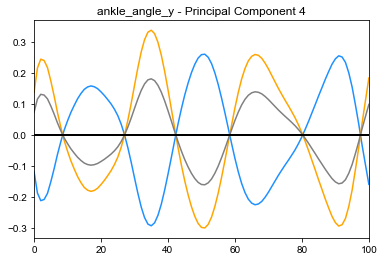

----------------------
Healthy Average: -0.037954418427923464
Injured Average: 0.5653345131939985
5th Percentile: -1.734300266483145
95th Percentile: 1.7031829567910621


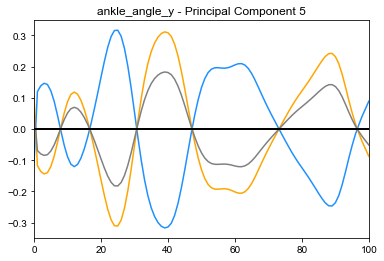

----------------------
Healthy Average: 0.3690811212175373
Injured Average: -0.02293264651636556
5th Percentile: -1.3921481830266762
95th Percentile: 1.1591210504502234


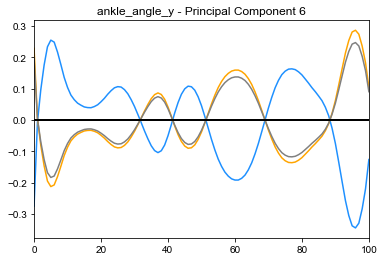

----------------------
Healthy Average: 0.16442868864174615
Injured Average: -0.5526584518938736
5th Percentile: -1.3587407424011884
95th Percentile: 1.2440582893720236


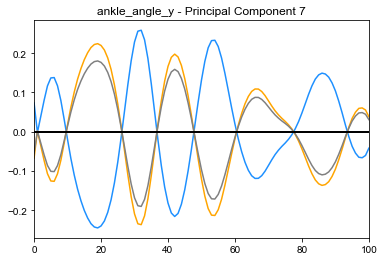

----------------------
Healthy Average: -3.046782407952429
Injured Average: 0.9380720074862919
5th Percentile: -6.4023471821658635
95th Percentile: 6.282523984494191


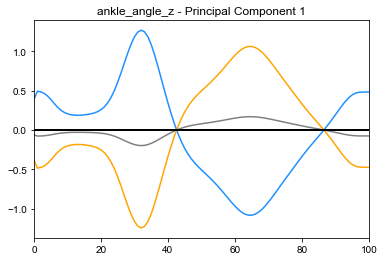

----------------------
Healthy Average: -0.7285736869982251
Injured Average: 0.6314712563896995
5th Percentile: -3.429378621516642
95th Percentile: 5.019386119451151


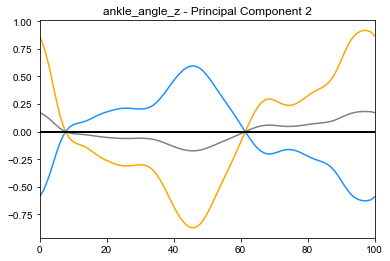

----------------------
Healthy Average: 0.2895546448820856
Injured Average: -0.9862404339795127
5th Percentile: -4.392171590446471
95th Percentile: 4.577163261059851


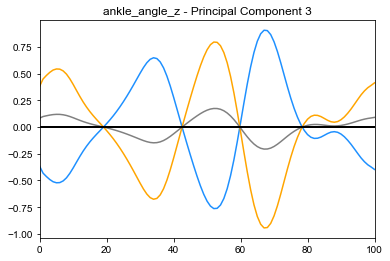

----------------------
Healthy Average: -1.1436397893470718
Injured Average: 1.5809222421906743
5th Percentile: -3.098709375449855
95th Percentile: 3.831709136640027


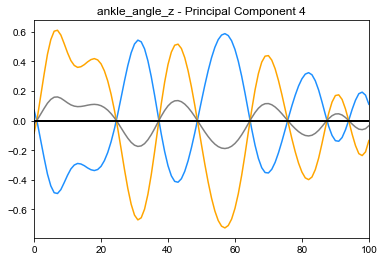

----------------------
Healthy Average: 0.6610404248356241
Injured Average: 0.0647330695378519
5th Percentile: -2.4706371801331186
95th Percentile: 2.748912760210781


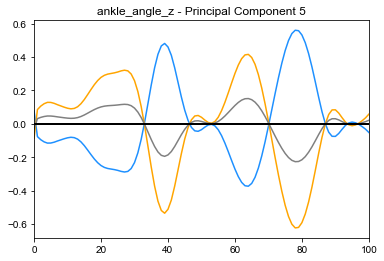

----------------------
Healthy Average: 0.31038037935567664
Injured Average: -0.7418096694147439
5th Percentile: -2.205015046742459
95th Percentile: 2.699663287138911


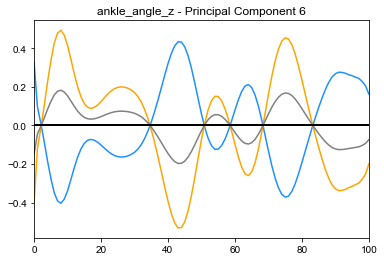

----------------------
Healthy Average: 0.04212088379495233
Injured Average: -0.8043141993301295
5th Percentile: -1.848127297847603
95th Percentile: 2.4005832946875096


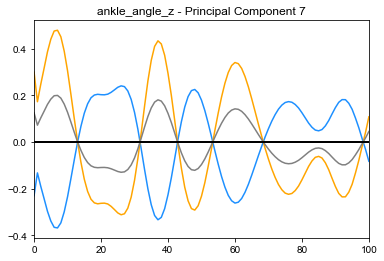

----------------------
Healthy Average: -1.3060371423200006
Injured Average: 0.010643587697702421
5th Percentile: -3.872254412588858
95th Percentile: 4.509182814346131


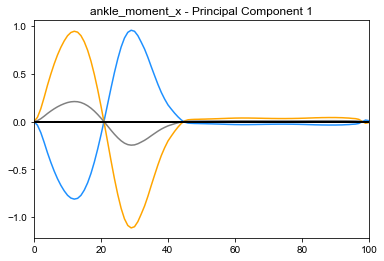

----------------------
Healthy Average: -0.49827044636542667
Injured Average: -0.05404675794618269
5th Percentile: -0.9223587969763091
95th Percentile: 1.3386820115641662


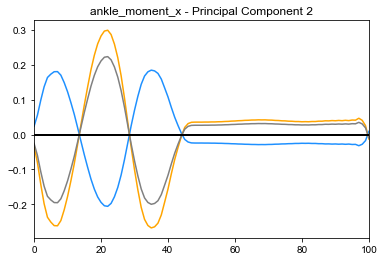

----------------------
Healthy Average: 0.1551434798052067
Injured Average: -0.08724179842350333
5th Percentile: -0.6758498630493204
95th Percentile: 0.7453955523518536


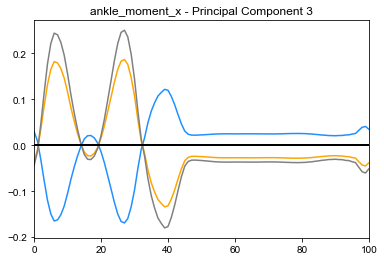

----------------------
Healthy Average: -0.126125810776282
Injured Average: 0.2279421055203526
5th Percentile: -0.33907430375479
95th Percentile: 0.4285996010052893


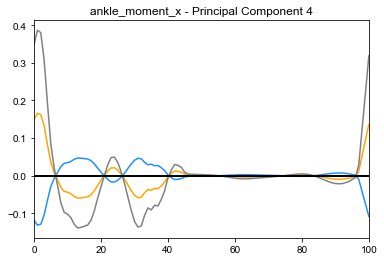

----------------------
Healthy Average: -0.04145379210285575
Injured Average: -0.03643535786437774
5th Percentile: -0.28491795560925015
95th Percentile: 0.37121721257331486


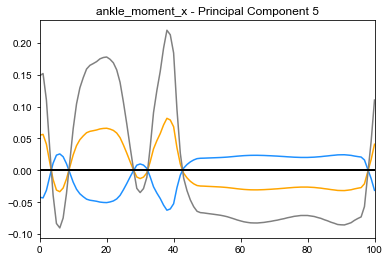

----------------------
Healthy Average: 0.05032308923160771
Injured Average: 0.030282771786346953
5th Percentile: -0.22464792873368372
95th Percentile: 0.18163726354942525


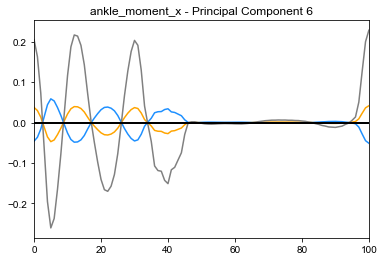

----------------------
Healthy Average: -0.03911309076087663
Injured Average: -0.010098196225788475
5th Percentile: -0.16473049808512574
95th Percentile: 0.16153913257059743


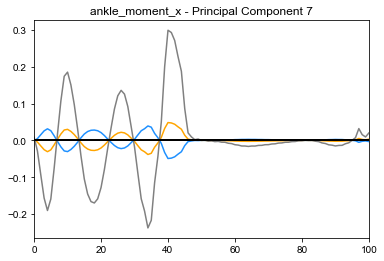

----------------------
Healthy Average: 0.8410883996777331
Injured Average: -2.233750389358524
5th Percentile: -4.955503604212314
95th Percentile: 11.303380415646753


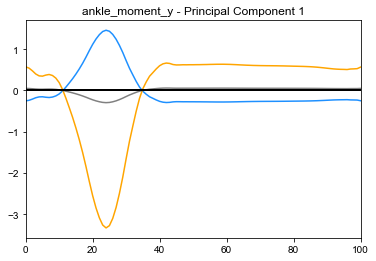

----------------------
Healthy Average: -1.310846967974201
Injured Average: 0.17700065301103685
5th Percentile: -3.400426598248208
95th Percentile: 3.7832823331161762


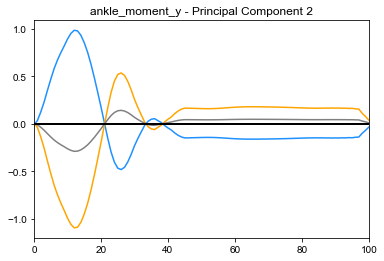

----------------------
Healthy Average: 0.37934327677506957
Injured Average: 0.520591064826192
5th Percentile: -2.2453682142461298
95th Percentile: 2.4959579594546293


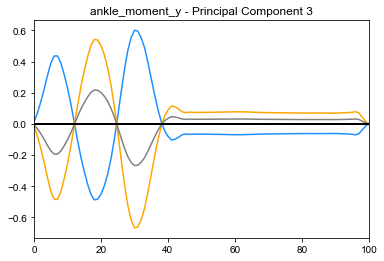

----------------------
Healthy Average: 0.45855571249744753
Injured Average: -0.12808619754974562
5th Percentile: -1.7877839033494012
95th Percentile: 1.6218196567555234


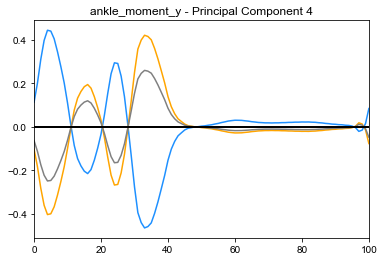

----------------------
Healthy Average: -0.43331773752971314
Injured Average: 0.13752791822020405
5th Percentile: -0.9471367502786792
95th Percentile: 0.9051416106760877


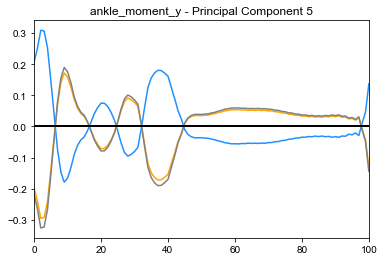

----------------------
Healthy Average: 0.12628063855683438
Injured Average: 0.3026931001416541
5th Percentile: -0.970495239875789
95th Percentile: 0.9126864161572928


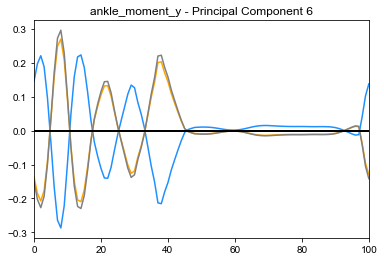

----------------------
Healthy Average: -0.16088129807551418
Injured Average: 0.07908379498052384
5th Percentile: -0.519324201758063
95th Percentile: 0.5241978402446102


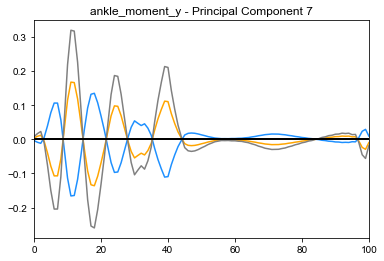

----------------------
Healthy Average: -0.8267709159346589
Injured Average: -1.8370288883236248
5th Percentile: -4.281857984651446
95th Percentile: 8.398819002854099


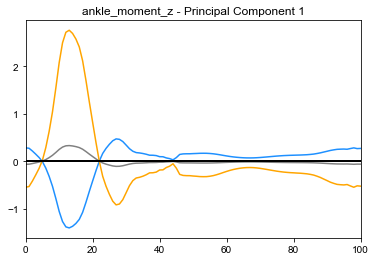

----------------------
Healthy Average: -0.3859288632517646
Injured Average: 0.20384589833647038
5th Percentile: -3.6009525526374846
95th Percentile: 6.102749016264964


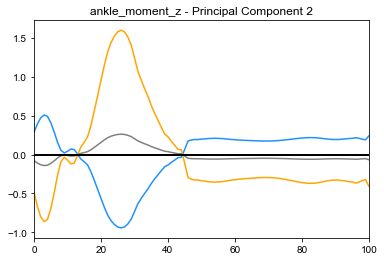

----------------------
Healthy Average: -0.5842290267811884
Injured Average: -0.3091578205618055
5th Percentile: -3.6261036728466047
95th Percentile: 2.8963879802835115


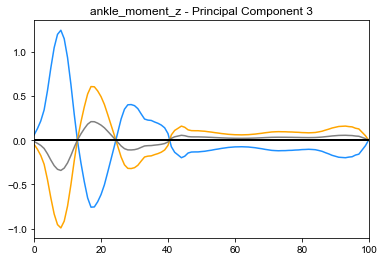

----------------------
Healthy Average: -0.5270684809458362
Injured Average: 0.4702666901446325
5th Percentile: -2.138617583904492
95th Percentile: 3.1236971484498426


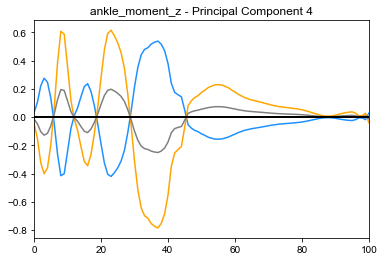

----------------------
Healthy Average: -0.5288427816325663
Injured Average: -0.5068949552167573
5th Percentile: -1.9165549449330028
95th Percentile: 1.4225489949621106


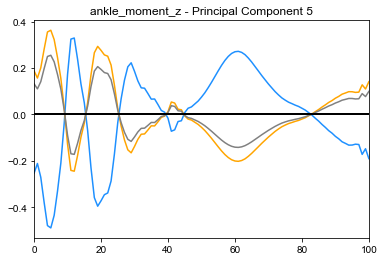

----------------------
Healthy Average: -0.014023370342187726
Injured Average: -0.1409694281150513
5th Percentile: -1.318055466443635
95th Percentile: 1.3679219063518857


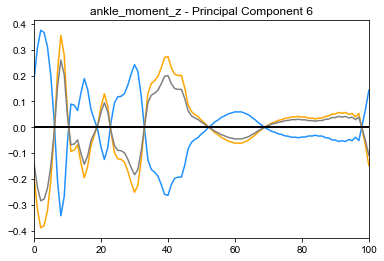

----------------------
Healthy Average: 0.0812617010979665
Injured Average: 0.04140717853433167
5th Percentile: -0.9519019965641049
95th Percentile: 0.979668833553233


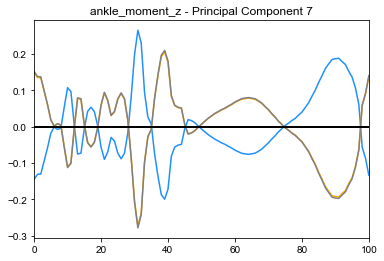

----------------------
Healthy Average: 1.4735960170618705
Injured Average: 0.20178234044404536
5th Percentile: -3.5463358079622824
95th Percentile: 2.6527232199718096


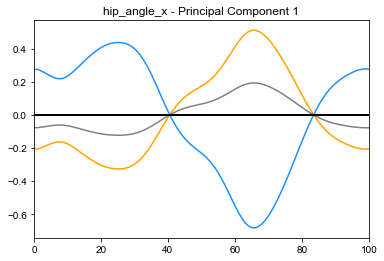

----------------------
Healthy Average: 0.15823811125694875
Injured Average: -0.2496157122043364
5th Percentile: -1.0580883477291483
95th Percentile: 1.0657173605584689


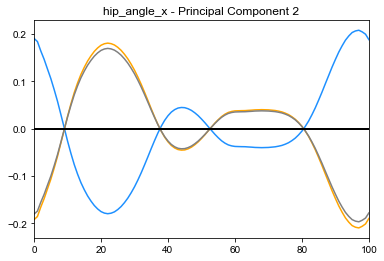

----------------------
Healthy Average: 0.1549344268359899
Injured Average: 0.06133222265223971
5th Percentile: -1.0258714634104873
95th Percentile: 0.8745033875352666


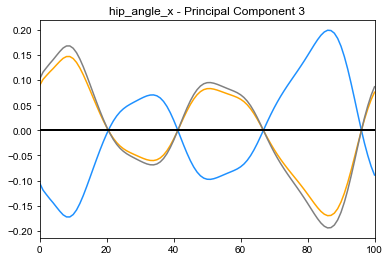

----------------------
Healthy Average: -0.0017345098053797828
Injured Average: -0.18051414985134306
5th Percentile: -0.6581974317902488
95th Percentile: 0.7384472217232048


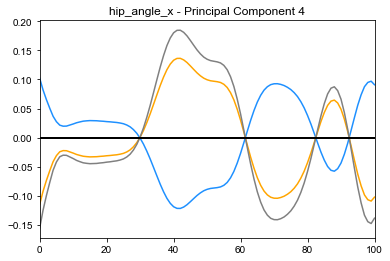

----------------------
Healthy Average: 0.036507400673538
Injured Average: 0.05951701267890867
5th Percentile: -0.5049454135353707
95th Percentile: 0.4535427021748588


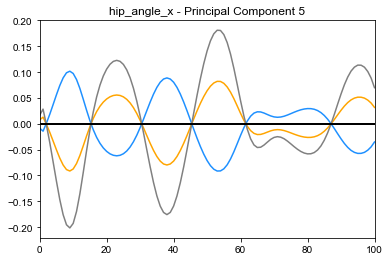

----------------------
Healthy Average: -0.11469060472196237
Injured Average: 0.051039431845700325
5th Percentile: -0.512707244590139
95th Percentile: 0.445395990838203


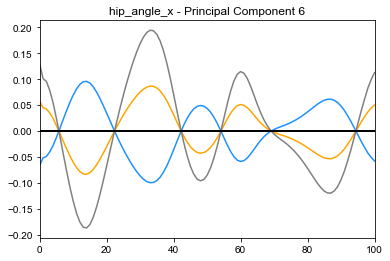

----------------------
Healthy Average: 0.07611796895608396
Injured Average: 0.0038630320364698473
5th Percentile: -0.4116892813772775
95th Percentile: 0.2907103194837332


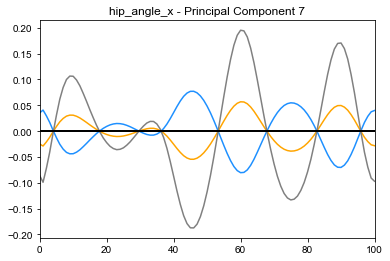

----------------------
Healthy Average: 0.5164542982837033
Injured Average: -0.33933717781748235
5th Percentile: -2.07963791103648
95th Percentile: 2.311384179067166


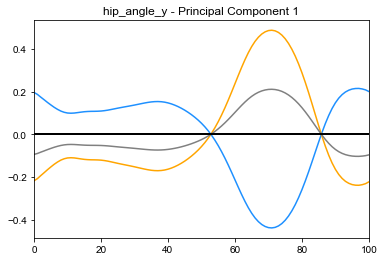

----------------------
Healthy Average: -0.7847607105512062
Injured Average: -0.3254900199877473
5th Percentile: -3.9240444245934265
95th Percentile: 3.8547518264724143


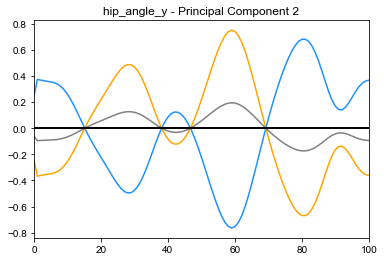

----------------------
Healthy Average: -0.39534279001120276
Injured Average: -0.4763641040142361
5th Percentile: -2.3884849879310313
95th Percentile: 2.963241840890317


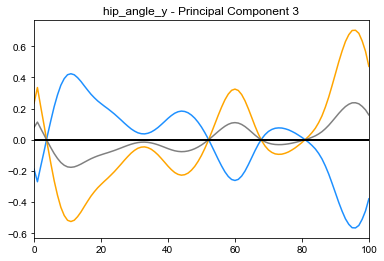

----------------------
Healthy Average: 1.3242676895977699
Injured Average: -0.2735789868468662
5th Percentile: -2.360770330242183
95th Percentile: 2.972989119341609


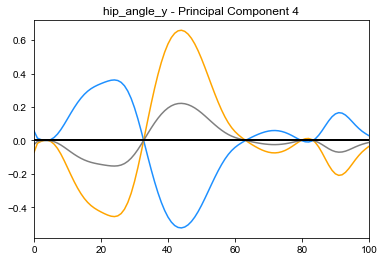

----------------------
Healthy Average: 1.0433030483140635
Injured Average: -0.6000991605387698
5th Percentile: -1.6885215735695789
95th Percentile: 2.034786840688301


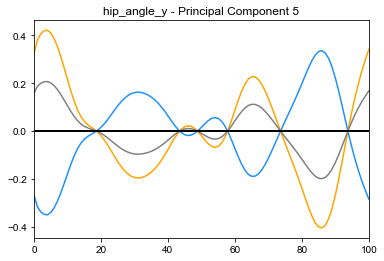

----------------------
Healthy Average: 0.5084341491783141
Injured Average: 0.019805420743021305
5th Percentile: -1.4187128674106715
95th Percentile: 1.323765750524


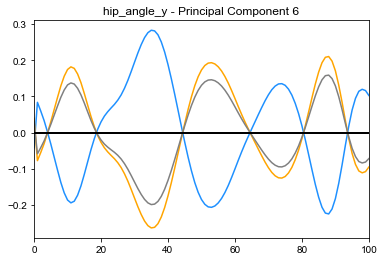

----------------------
Healthy Average: -0.24671512369065804
Injured Average: 0.0411502769624073
5th Percentile: -1.0732568650506042
95th Percentile: 0.8159481429665689


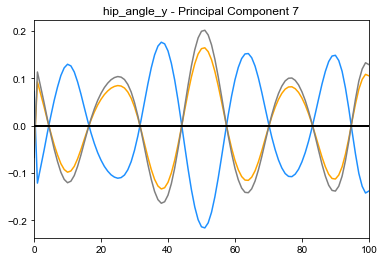

----------------------
Healthy Average: 0.8283219876046019
Injured Average: -4.469244107323145
5th Percentile: -7.72308775206547
95th Percentile: 9.087086345066252


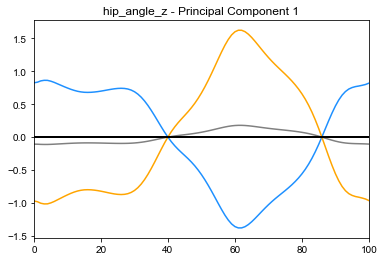

----------------------
Healthy Average: -2.1644276330555687
Injured Average: 3.1463892246658935
5th Percentile: -5.895700341072843
95th Percentile: 8.694527744426273


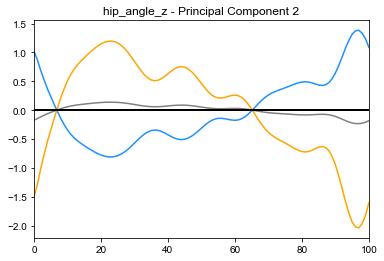

----------------------
Healthy Average: -0.435539324729258
Injured Average: 2.8024610464652704
5th Percentile: -5.742379592837506
95th Percentile: 6.92641871593596


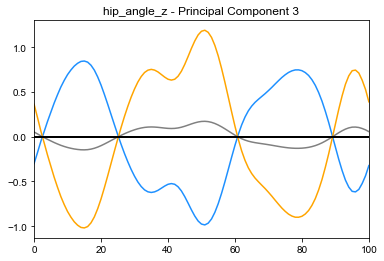

----------------------
Healthy Average: 1.3420584909416728
Injured Average: -0.159092196125408
5th Percentile: -3.2625912242517012
95th Percentile: 4.440232493402888


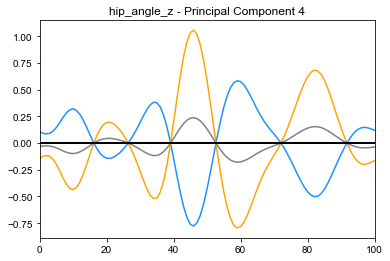

----------------------
Healthy Average: 0.6812179358205579
Injured Average: 0.41614297789862265
5th Percentile: -3.1774557969783235
95th Percentile: 4.849314153890579


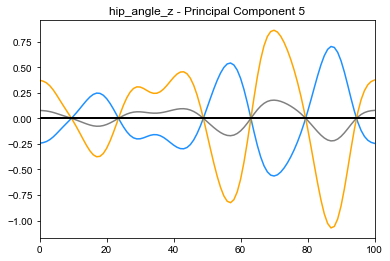

----------------------
Healthy Average: 0.6383713324997837
Injured Average: 0.15869249156336662
5th Percentile: -3.3593223052571477
95th Percentile: 3.5567389082967957


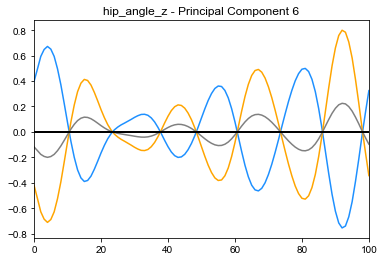

----------------------
Healthy Average: -1.188863305353382
Injured Average: 0.777352224776558
5th Percentile: -3.0801189391886914
95th Percentile: 2.745560107153213


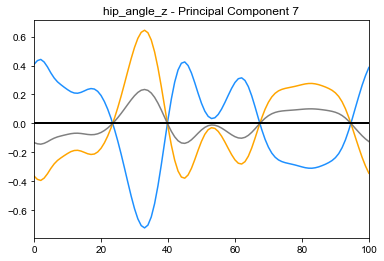

----------------------
Healthy Average: 0.7568646688016332
Injured Average: 0.844221910056391
5th Percentile: -3.165852225225061
95th Percentile: 2.9125876668904733


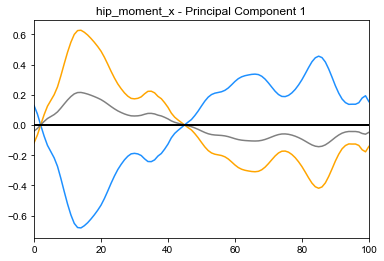

----------------------
Healthy Average: -0.44707022788079204
Injured Average: -0.28685668680620596
5th Percentile: -1.6926987233679822
95th Percentile: 1.7992072721551648


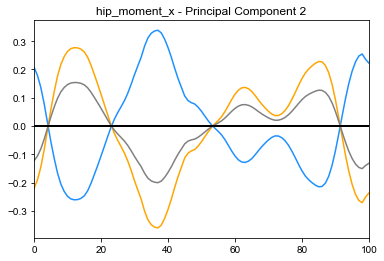

----------------------
Healthy Average: 0.28207581319709546
Injured Average: 0.0367678635415463
5th Percentile: -1.096418012960112
95th Percentile: 1.3360244925032456


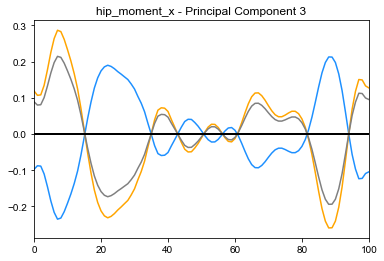

----------------------
Healthy Average: 0.4445455245388001
Injured Average: -0.30523145162041027
5th Percentile: -1.0820688096500772
95th Percentile: 1.365796831199298


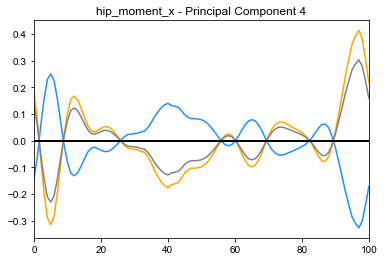

----------------------
Healthy Average: -0.15935664457058468
Injured Average: -0.09983603277598799
5th Percentile: -0.8223642674562377
95th Percentile: 1.144602943182869


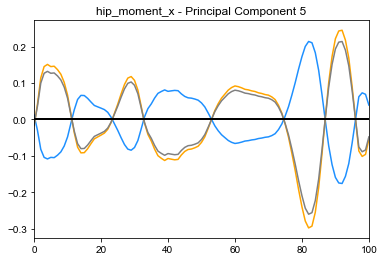

----------------------
Healthy Average: -0.47831084888890957
Injured Average: 0.1327950240049334
5th Percentile: -0.9786590045649644
95th Percentile: 0.8025300830208313


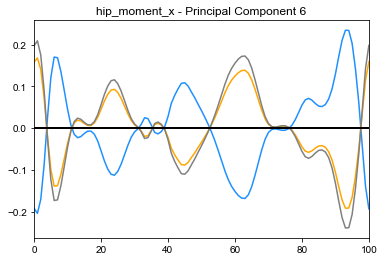

----------------------
Healthy Average: -0.06112093777551761
Injured Average: -0.025240831009705728
5th Percentile: -0.6719111428263771
95th Percentile: 0.7835628356198081


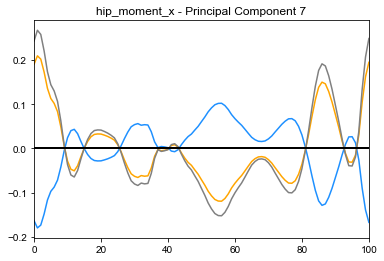

----------------------
Healthy Average: -2.967165161056292
Injured Average: 4.566150766774269
5th Percentile: -6.999628244667088
95th Percentile: 10.740923510595042


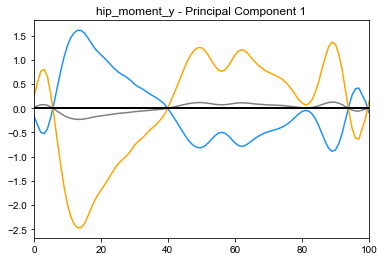

----------------------
Healthy Average: -1.8135201343156047
Injured Average: -1.8165109907047856
5th Percentile: -5.854554783517775
95th Percentile: 6.116710623558461


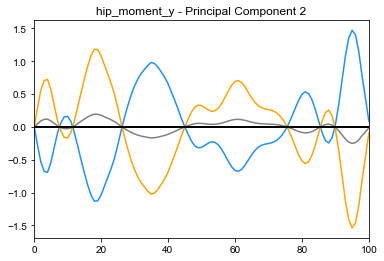

----------------------
Healthy Average: 1.6371066732031956
Injured Average: -0.7234243768799564
5th Percentile: -4.40974959702685
95th Percentile: 4.69668630424467


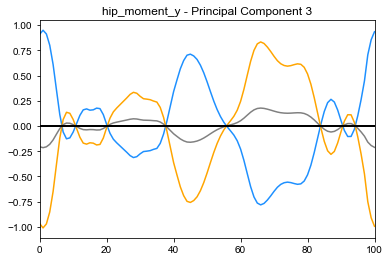

----------------------
Healthy Average: -0.9196746986223263
Injured Average: -0.38625870381933647
5th Percentile: -4.6785629828163495
95th Percentile: 3.5886319265649442


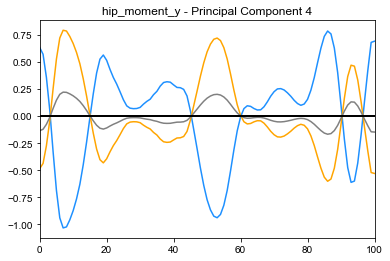

----------------------
Healthy Average: -0.5622804833682857
Injured Average: 1.2403494364429315
5th Percentile: -3.535074292417509
95th Percentile: 2.846019368923143


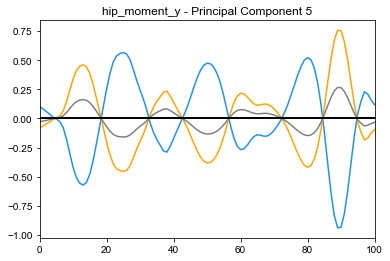

----------------------
Healthy Average: -0.9818715194922257
Injured Average: 0.9566050589306634
5th Percentile: -3.138146991392484
95th Percentile: 3.6003134796790683


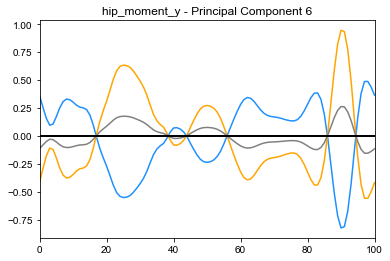

----------------------
Healthy Average: -0.6289078814826845
Injured Average: -0.13316703012970277
5th Percentile: -2.6549399766082695
95th Percentile: 2.942705077920527


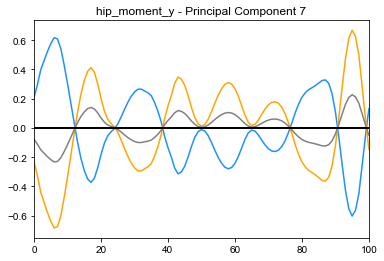

----------------------
Healthy Average: -0.4300742801883189
Injured Average: -2.004557566310425
5th Percentile: -4.5713438785221765
95th Percentile: 10.236196431583139


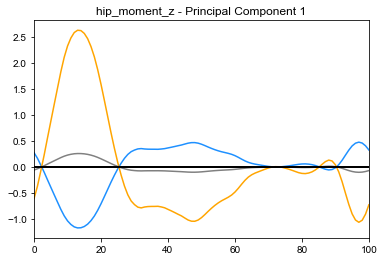

----------------------
Healthy Average: 0.20953894343633223
Injured Average: -1.4252055113811513
5th Percentile: -2.605561869297941
95th Percentile: 3.2576759176603436


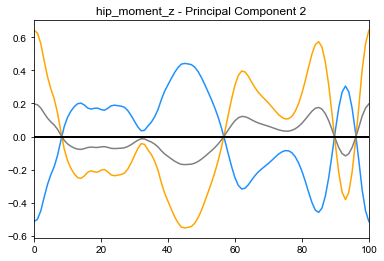

----------------------
Healthy Average: 1.7927434319743278
Injured Average: -0.23799444897850966
5th Percentile: -2.8442390185407227
95th Percentile: 3.139851796585125


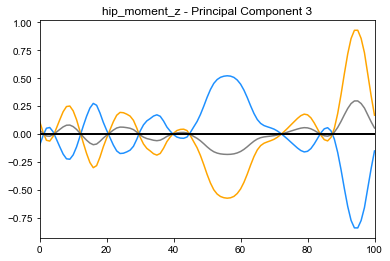

----------------------
Healthy Average: -0.6078049397643444
Injured Average: 1.0169095984788692
5th Percentile: -2.526805159270194
95th Percentile: 2.612534109355076


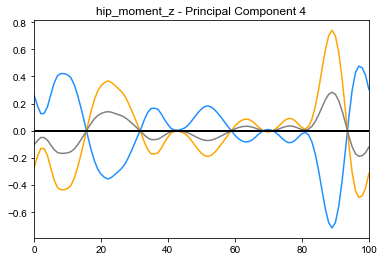

----------------------
Healthy Average: 1.1775992368202468
Injured Average: -0.6439654027102368
5th Percentile: -1.9661683987193548
95th Percentile: 2.570711781042641


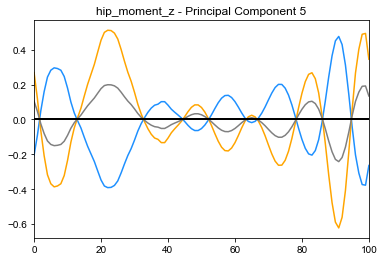

----------------------
Healthy Average: -0.0434981890089389
Injured Average: 0.5581635262902449
5th Percentile: -1.835088317706105
95th Percentile: 2.05801408392249


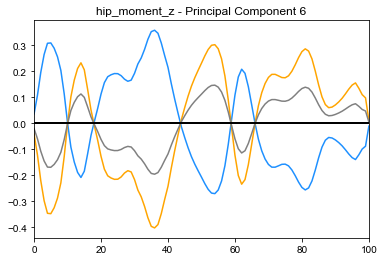

----------------------
Healthy Average: 0.473037008871288
Injured Average: -0.03850466558145074
5th Percentile: -1.6968063636164183
95th Percentile: 1.833171854851795


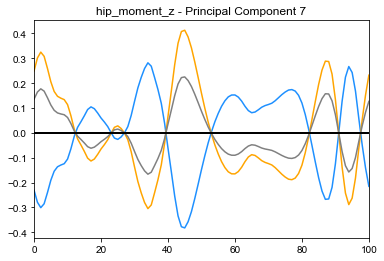

----------------------
Healthy Average: -0.7494919344909986
Injured Average: -0.44311862474811536
5th Percentile: -2.457537821351639
95th Percentile: 3.3655116724973135


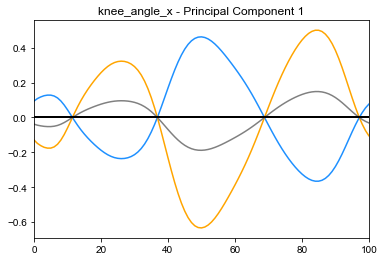

----------------------
Healthy Average: -0.4650141063536622
Injured Average: 0.38528849597311604
5th Percentile: -1.4218752203756169
95th Percentile: 1.387813470828564


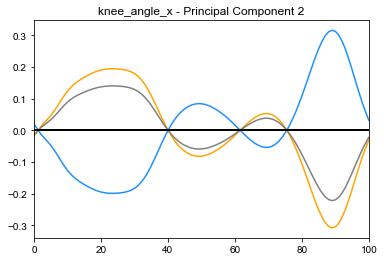

----------------------
Healthy Average: 0.0107337451974512
Injured Average: -0.45733711896490975
5th Percentile: -0.9630627769103722
95th Percentile: 1.0845305635970155


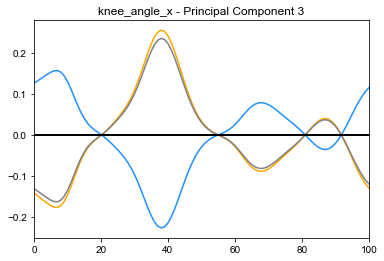

----------------------
Healthy Average: -0.08682010648560763
Injured Average: 0.11752014028771039
5th Percentile: -0.38754483416221
95th Percentile: 0.4726604076277108


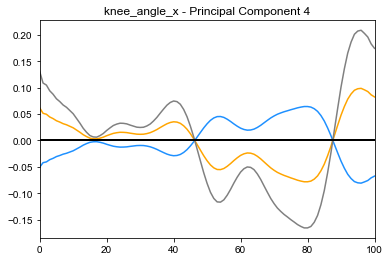

----------------------
Healthy Average: 0.1714334451078033
Injured Average: -0.0397023982572553
5th Percentile: -0.40514245923245823
95th Percentile: 0.4980562071128075


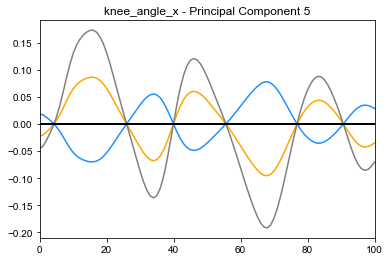

----------------------
Healthy Average: 0.19323838833704546
Injured Average: -0.01369282334128935
5th Percentile: -0.4343943388243767
95th Percentile: 0.3575671276938264


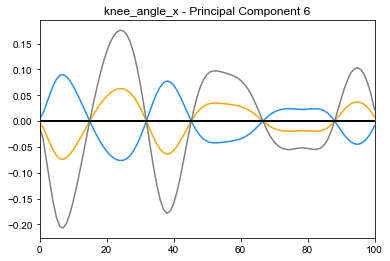

----------------------
Healthy Average: 0.05707651366147648
Injured Average: -0.00878280045521398
5th Percentile: -0.2496808952193193
95th Percentile: 0.287712872044194


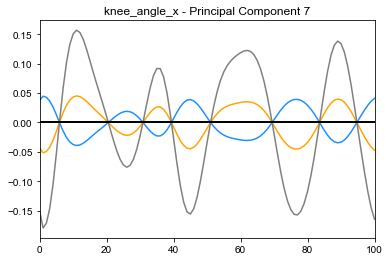

----------------------
Healthy Average: 2.1147474657975125
Injured Average: -2.9782667711679682
5th Percentile: -5.256895204069287
95th Percentile: 7.500509263916585


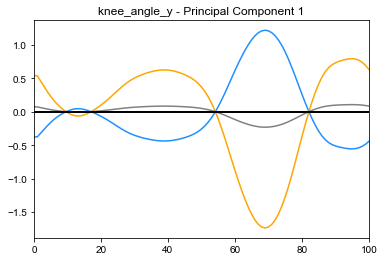

----------------------
Healthy Average: -2.0630942804347163
Injured Average: -0.4090419718251315
5th Percentile: -3.7365719532539874
95th Percentile: 4.871582589966479


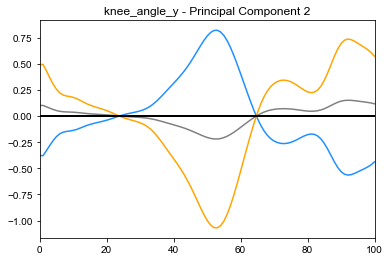

----------------------
Healthy Average: -0.6618120176128328
Injured Average: 0.8757043400136966
5th Percentile: -3.694712478568352
95th Percentile: 4.046056058007231


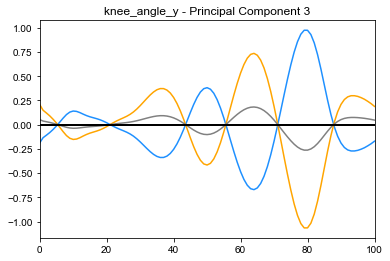

----------------------
Healthy Average: -0.10797976167512718
Injured Average: 0.6720578234116619
5th Percentile: -2.9356782788340805
95th Percentile: 3.1891199070073037


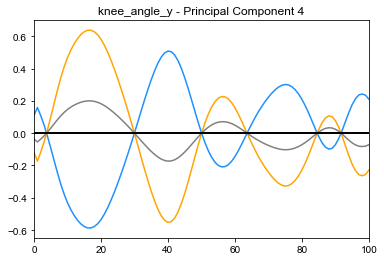

----------------------
Healthy Average: -0.09961882697893584
Injured Average: 0.4401070733047222
5th Percentile: -2.399629557924282
95th Percentile: 2.2529068150167406


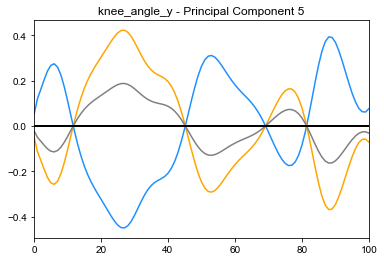

----------------------
Healthy Average: 0.19132626351336066
Injured Average: -0.46118565141981316
5th Percentile: -1.8064384077331375
95th Percentile: 1.8946602144003344


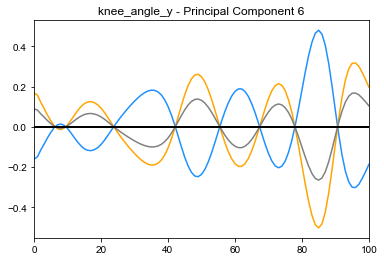

----------------------
Healthy Average: 0.35367915745107603
Injured Average: 0.31664055748876313
5th Percentile: -1.4865861339860855
95th Percentile: 1.49414077925568


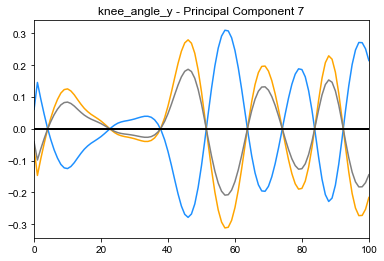

----------------------
Healthy Average: 0.3024926410557441
Injured Average: -2.460975309302775
5th Percentile: -6.102865643039236
95th Percentile: 6.985135632946529


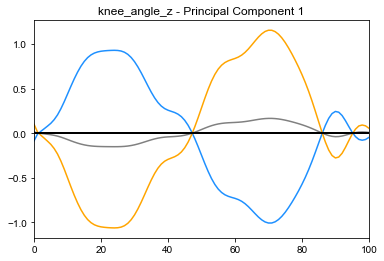

----------------------
Healthy Average: -0.6260924077070307
Injured Average: -1.8384398219541462
5th Percentile: -4.412887399093838
95th Percentile: 7.165218605710871


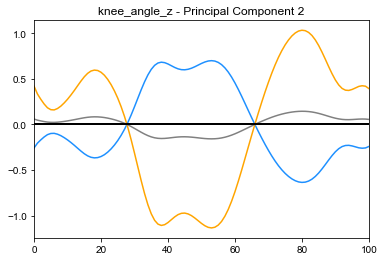

----------------------
Healthy Average: -0.12813520741713522
Injured Average: 0.42484853727286637
5th Percentile: -3.9330748787160283
95th Percentile: 5.551723348247748


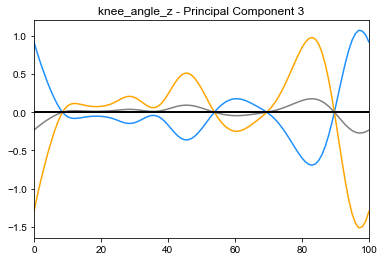

----------------------
Healthy Average: -1.254986339163976
Injured Average: 0.1848992613247142
5th Percentile: -3.647909878726762
95th Percentile: 3.5551154780210696


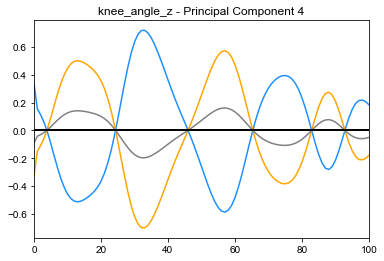

----------------------
Healthy Average: -0.6731325562776616
Injured Average: 0.6780253310985703
5th Percentile: -2.6088691807188176
95th Percentile: 3.484171843313181


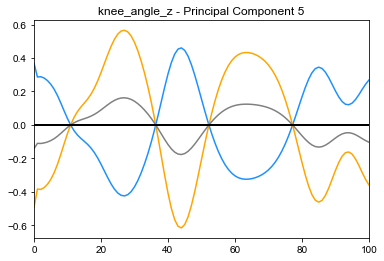

----------------------
Healthy Average: 0.11572340556921433
Injured Average: 0.17372375395568806
5th Percentile: -2.1710021769949486
95th Percentile: 2.450047758785369


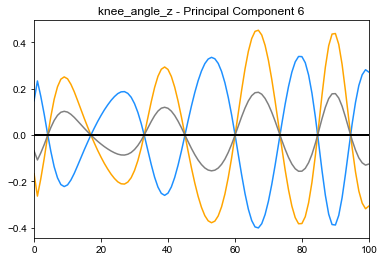

----------------------
Healthy Average: 0.33123389512958074
Injured Average: 0.6391176651383988
5th Percentile: -2.2891070421875357
95th Percentile: 2.1359768522405025


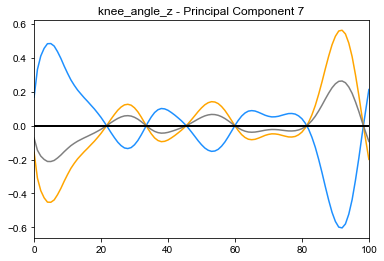

----------------------
Healthy Average: 0.5450556656005034
Injured Average: 0.6774277158725238
5th Percentile: -4.389284529320857
95th Percentile: 4.353984912339691


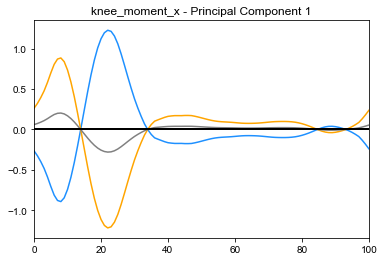

----------------------
Healthy Average: 0.10509615277633277
Injured Average: -0.5093624609177075
5th Percentile: -1.2028575474994523
95th Percentile: 1.2161046687001353


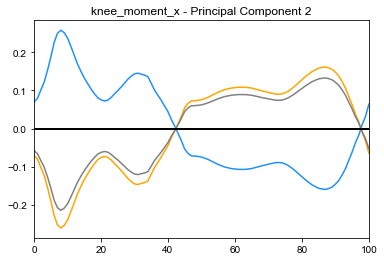

----------------------
Healthy Average: -0.12207035630822445
Injured Average: 0.012295057412262125
5th Percentile: -0.9492854360664955
95th Percentile: 1.1508207247724105


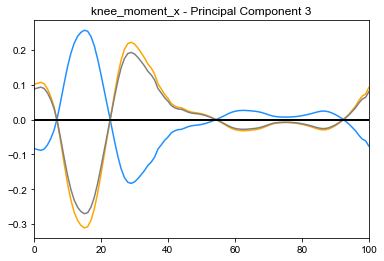

----------------------
Healthy Average: 0.01902953636846331
Injured Average: -0.07472834702571995
5th Percentile: -0.8793692561503142
95th Percentile: 0.9983029388360309


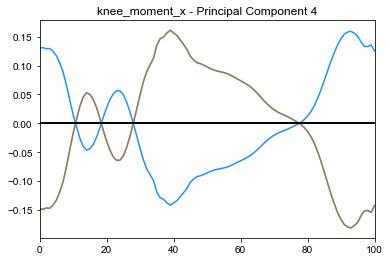

----------------------
Healthy Average: -0.2950079488348487
Injured Average: 0.23430101689542357
5th Percentile: -0.7172992114225699
95th Percentile: 0.49982350414670434


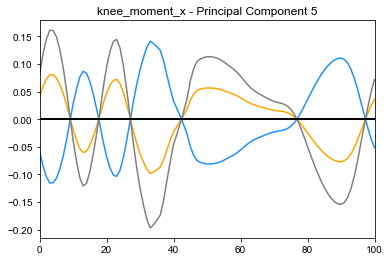

----------------------
Healthy Average: -0.09496849002531292
Injured Average: -0.11190114638470106
5th Percentile: -0.6644640851228084
95th Percentile: 0.7687958757672269


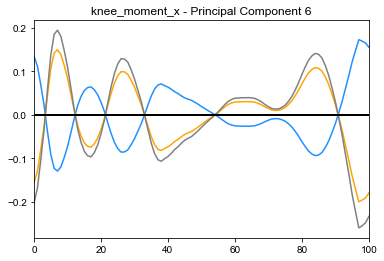

----------------------
Healthy Average: -0.07989250454878102
Injured Average: 0.04225493893739099
5th Percentile: -0.2856719947543779
95th Percentile: 0.3615698746512642


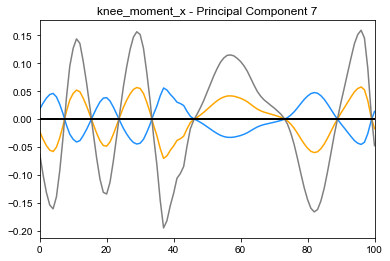

----------------------
Healthy Average: -1.0584952961214624
Injured Average: -1.0014866709810748
5th Percentile: -2.4618002439292956
95th Percentile: 7.368924578161348


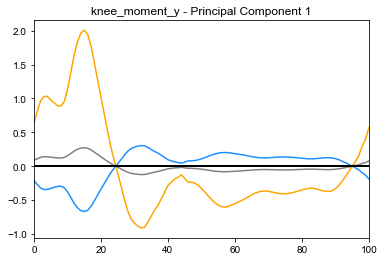

----------------------
Healthy Average: 0.31625284629279826
Injured Average: 1.5910378109170396
5th Percentile: -3.5479313645901214
95th Percentile: 5.278179779534274


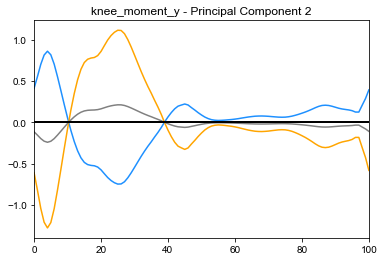

----------------------
Healthy Average: -0.30283809234346776
Injured Average: -0.12392669755588293
5th Percentile: -3.702972026085006
95th Percentile: 4.08195260508825


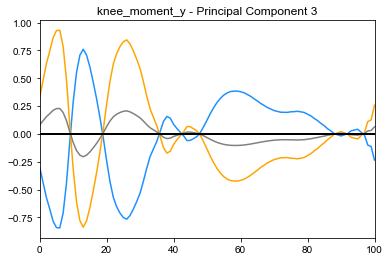

----------------------
Healthy Average: 0.5740155389293604
Injured Average: -0.5801374851315169
5th Percentile: -2.3841733677925814
95th Percentile: 1.8562482253145756


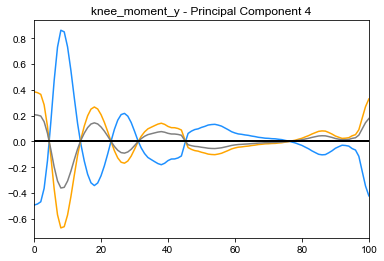

----------------------
Healthy Average: 0.7223451250614469
Injured Average: -0.16404430384802238
5th Percentile: -2.0279685251905137
95th Percentile: 1.8327797867681468


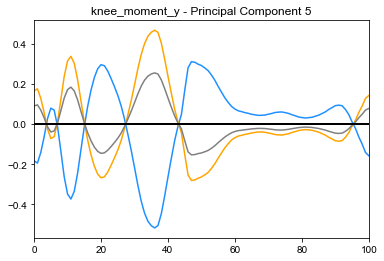

----------------------
Healthy Average: -0.34117990522329916
Injured Average: 0.5662679734274799
5th Percentile: -1.45856290766415
95th Percentile: 1.2784642208441923


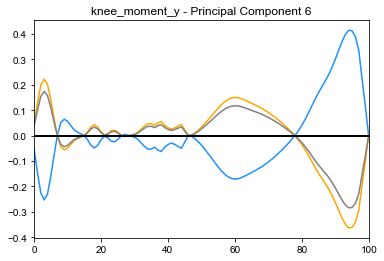

----------------------
Healthy Average: -0.21087097560575263
Injured Average: -0.005824731589827123
5th Percentile: -1.4250541739509857
95th Percentile: 1.0568650819653218


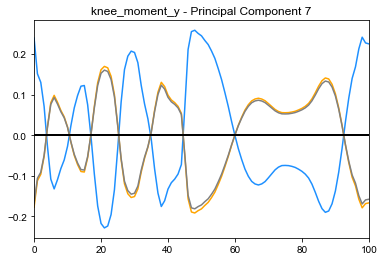

----------------------
Healthy Average: -0.3121833044846329
Injured Average: -2.234487263602938
5th Percentile: -4.244802764167627
95th Percentile: 14.849463379228728


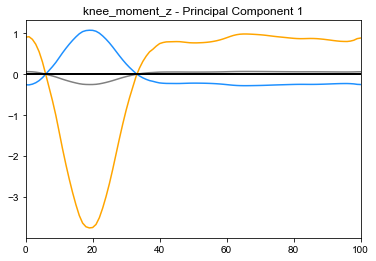

----------------------
Healthy Average: -0.9095218815927062
Injured Average: -0.7427277764910586
5th Percentile: -3.454485044833115
95th Percentile: 4.664790086613979


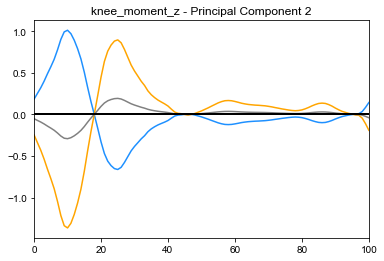

----------------------
Healthy Average: -0.3128629421220716
Injured Average: -0.19532634638178595
5th Percentile: -2.226550455658331
95th Percentile: 2.370872949033501


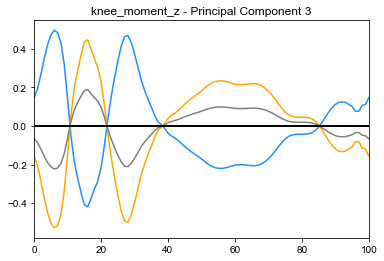

----------------------
Healthy Average: 0.07056808090216486
Injured Average: 0.06602086696058274
5th Percentile: -1.2837190268733196
95th Percentile: 1.4775256793333877


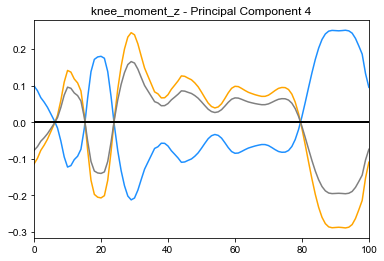

----------------------
Healthy Average: -0.020637525762743206
Injured Average: 0.17933515067061348
5th Percentile: -1.371240998358473
95th Percentile: 1.0551704265500261


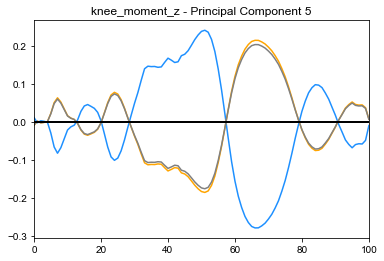

----------------------
Healthy Average: -0.2125729336474927
Injured Average: -0.20573548016706017
5th Percentile: -0.8128776694524051
95th Percentile: 1.0311311017394098


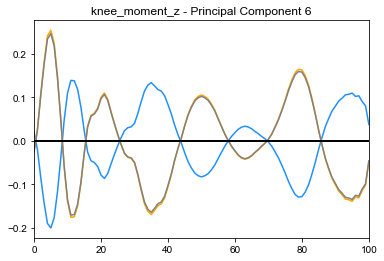

----------------------
Healthy Average: -0.08139784647447847
Injured Average: 0.06988652369446428
5th Percentile: -0.8811625988459587
95th Percentile: 1.0820139490054017


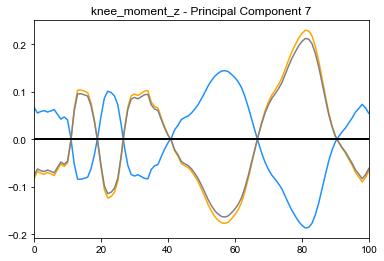

<Figure size 432x288 with 0 Axes>

In [79]:
#create a directory of the PC scores matrices
os.chdir('/Users/rossbrancati/Desktop/PFP_Project/kinetic_kinematic/Data/PCA_matrices/individual_means_both_minutes/')
PC_scores_dir = sorted(os.listdir(os.path.join(os.getcwd(), 'PCA_scores')))
PC_scores_dir_path = os.path.join(os.getcwd(), 'PCA_scores')

#create a directory for the loadings of the PC_score matrices
os.chdir('/Users/rossbrancati/Desktop/PFP_Project/kinetic_kinematic/Data/PCA_matrices/individual_means_both_minutes/')
loadings_dir = os.path.join(os.getcwd(), 'loadings')

for file_idx, file_name in enumerate(PC_scores_dir):
    
    #get the current PC_scores_file
    current_score_path = os.path.join(PC_scores_dir_path,file_name)
    current_score_matrix = pd.read_csv(current_score_path,sep='\t')
    #load the loadings matrix 
    current_loadings_mat_path = loadings_dir+'/loadings_'+file_name
    current_loadings_matrix = pd.read_csv(current_loadings_mat_path,sep='\t')
    
    
    #set range to 7 because the highest relevant PC is PC 7. 
    for PC_num in range(7):
        
        #extract the row of the loadings matrix for the current PC
        current_loading_PC = np.array(current_loadings_matrix.loc[PC_num,:])
        current_loading_PC = current_loading_PC[1:]
        
        #extract first column of the PC_scores matrix
        current_PC_scores = np.array(current_score_matrix)
        current_PC_scores_vector = current_PC_scores[:,PC_num+1]
        #5th percentile:
        fifth_percentile = np.percentile(current_PC_scores_vector, 5)
        mean_healthy = np.average(current_PC_scores_vector[0:18])
        #95th percentile:
        mean_injured = np.average(current_PC_scores_vector[18:35])
        nintyfifth_percentile = np.percentile(current_PC_scores_vector, 95)
        
        #Create a string for the current principal component
        PC_number = str(PC_num+1)
        
        #Plot the loading vector multiplied by the 5th and 95th percentile of PC_score
        #plt.figure(PC_num)
        print("----------------------")
        print('Healthy Average:', mean_healthy)
        print('Injured Average:', mean_injured)
        print('5th Percentile:', fifth_percentile)
        print('95th Percentile:', nintyfifth_percentile)
        plt.ion()
        plt.plot(current_loading_PC*fifth_percentile, color = "dodgerblue")
        plt.plot(current_loading_PC*nintyfifth_percentile, color = "orange")
        plt.plot(current_loading_PC, color='gray')
        plt.plot([0, 100], [0, 0], color='k', linewidth=2)
        plt.xlim(0,100)
        plt.title(file_name[0:-4]+' - Principal Component '+PC_number)
        plt.show()
        #plt.savefig('/Users/rossbrancati/Desktop/PFP_Project/kinetic_kinematic/plots/5_and_95_plots/'+file_name[0:-4]+'/'+file_name[0:-4]+'_PC_'+PC_number)
        plt.clf()

To help with interpretation, create a waveform plot of the healthy and injured groups at minute 1

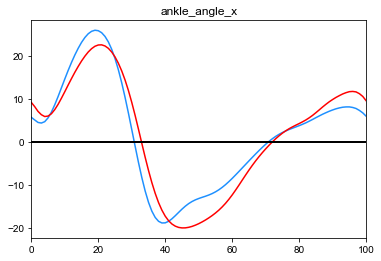

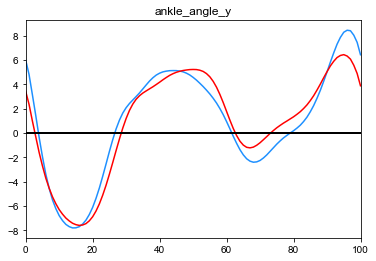

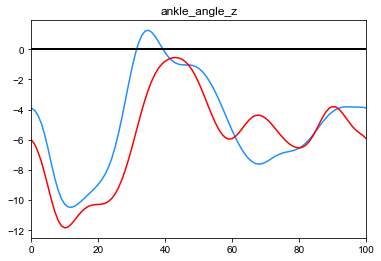

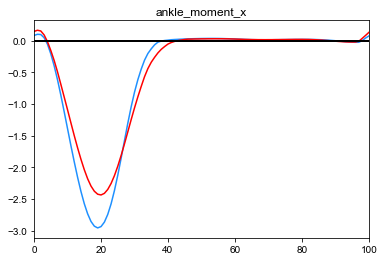

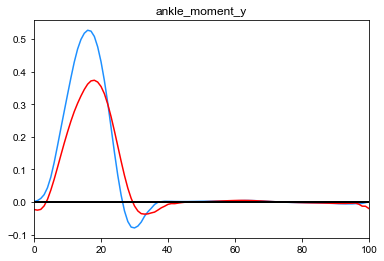

...

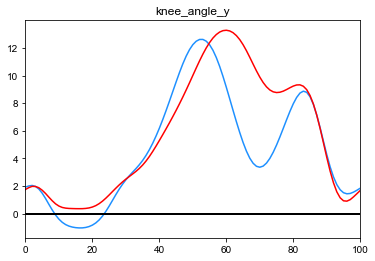

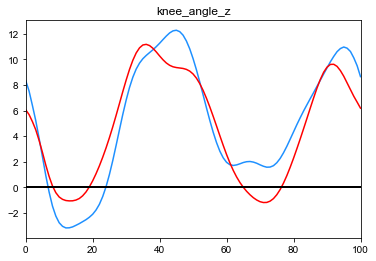

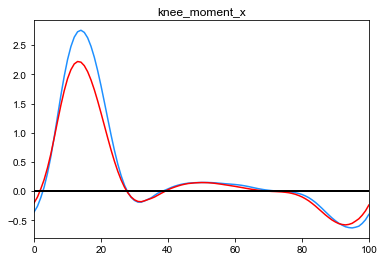

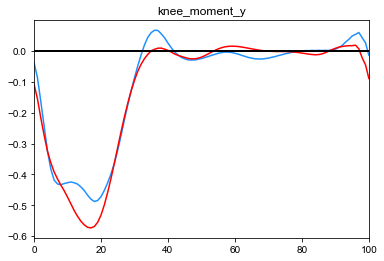

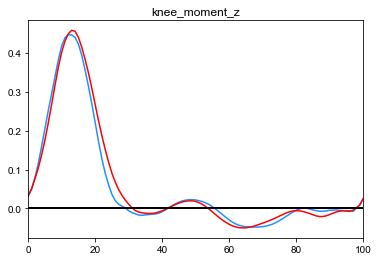

<Figure size 432x288 with 0 Axes>

In [122]:
#create an empty numpy array to store the mean of every variable in
all_kin_variable_means_M1 = np.empty((101,18))
kin_headers_M1 = []

#create a directory of the metric matrices
os.chdir('/Users/rossbrancati/Desktop/PFP_Project/kinetic_kinematic/Data/metric_matrices/individual_means/all_groups')
PC_scores_dir = sorted(os.listdir(os.getcwd()))

#loop over files in directory
for file_idx, file_name in enumerate(PC_scores_dir):
    
    #load the file
    current_file = pd.read_csv('/Users/rossbrancati/Desktop/PFP_Project/kinetic_kinematic/Data/metric_matrices/individual_means/all_groups/'+file_name, header=None, sep='\t')
    #convert first 35 rows to array
    healthy_mean = np.array(current_file.loc[0:18,:])
    injured_mean = np.array(current_file.loc[18:35,:])
    all_mean = np.array(current_file.iloc[0:35])
    
    #append mean of all observations to array
    all_kin_variable_means_M1[:,file_idx] = (np.mean(all_mean, axis=0))
    #append file name to list of headers
    kin_headers_M1.append(file_name[0:-4])
    
    #plot the mean waveform of the healthy and injured runners
    plt.ion()
    plt.plot((np.mean(healthy_mean, axis=0)), color = 'dodgerblue')
    plt.plot((np.mean(injured_mean, axis=0)), color = 'red')
    plt.plot([0, 100], [0, 0], color='k', linewidth=2)
    plt.xlim(0,100)
    plt.title(file_name[0:-4])
    plt.show()
    plt.clf()
    
#kin_M1_means_df = pd.DataFrame(all_kin_variable_means_M1, columns=kin_headers_M1)
#kin_M1_means_df.to_csv("/Users/rossbrancati/Desktop/PFP_Project/machine_learning/machine_learning_data/results_feb_2022/mean_waveforms/kin_variable_means_M1.csv")

**Repeat for EMG waveforms**

----------------------
Healthy Average: -0.1535430397488044
Injured Average: 0.3122969411585162
5th Percentile: -1.5986379313056205
95th Percentile: 1.681789509936545


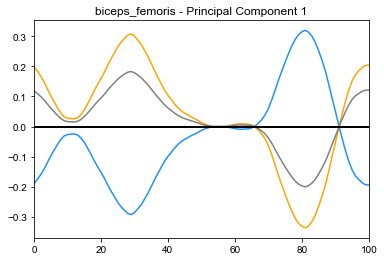

----------------------
Healthy Average: -0.05380975294042594
Injured Average: -0.049262369641912225
5th Percentile: -1.3165951868862746
95th Percentile: 1.4159130651878242


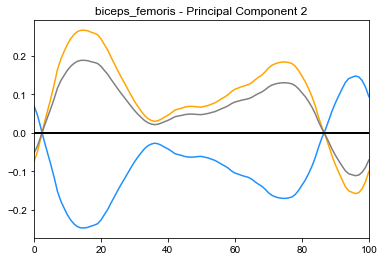

----------------------
Healthy Average: -0.5515372388851839
Injured Average: 0.13970520982788073
5th Percentile: -0.9316688324793225
95th Percentile: 1.4530060239815175


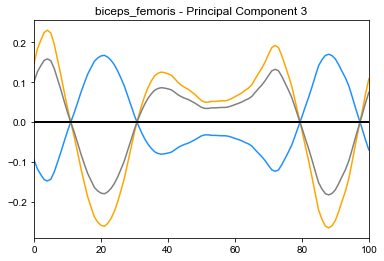

----------------------
Healthy Average: 0.252088947058031
Injured Average: -0.2715859959186132
5th Percentile: -0.9319063326973622
95th Percentile: 0.9746411479163419


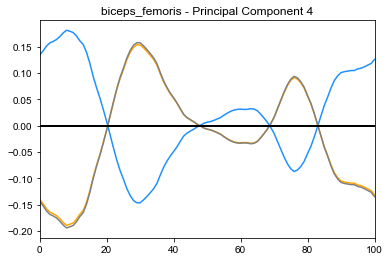

----------------------
Healthy Average: 0.9945990053287902
Injured Average: -0.8778152489203045
5th Percentile: -1.724565994655777
95th Percentile: 1.7021906494366696


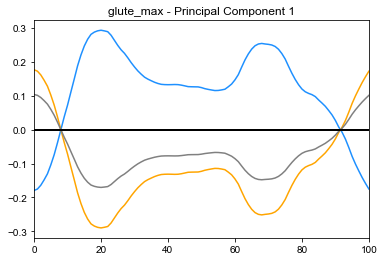

----------------------
Healthy Average: 0.06363886575451486
Injured Average: 0.4959636680657056
5th Percentile: -1.239610102183534
95th Percentile: 1.911761753173384


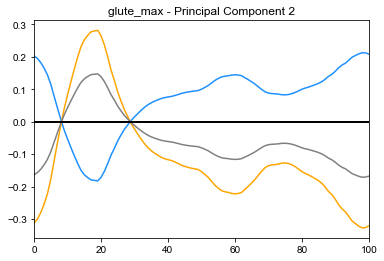

----------------------
Healthy Average: -0.06729426069285792
Injured Average: 0.056462201170161354
5th Percentile: -0.8075298851296041
95th Percentile: 0.9685675513985452


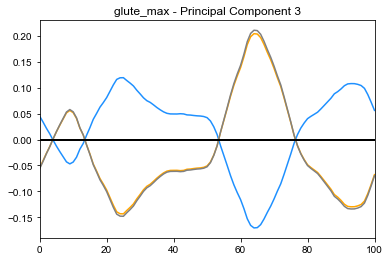

----------------------
Healthy Average: -0.12472987874130569
Injured Average: 0.05690386835124873
5th Percentile: -0.524140366491944
95th Percentile: 0.9146264384244267


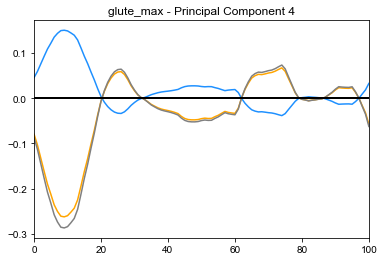

----------------------
Healthy Average: -0.43201848597383924
Injured Average: 0.9160647029285971
5th Percentile: -1.7521009652748474
95th Percentile: 1.9733276693138346


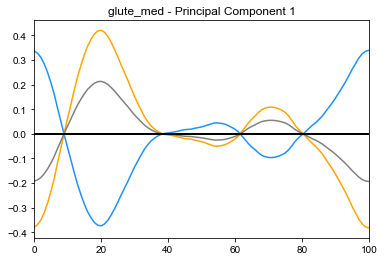

----------------------
Healthy Average: -0.6031041220426898
Injured Average: 0.08528233004797263
5th Percentile: -0.9920908530637336
95th Percentile: 1.8361943732038275


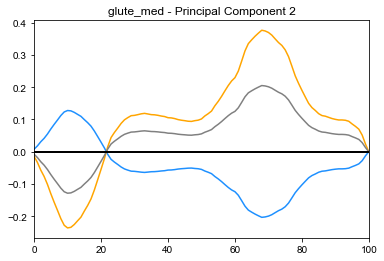

----------------------
Healthy Average: -0.08999111918954772
Injured Average: -0.13312669341754502
5th Percentile: -0.9965482061607845
95th Percentile: 1.0178544853396914


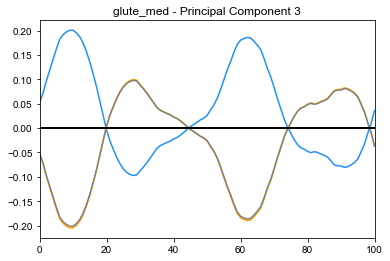

----------------------
Healthy Average: 0.1297088046727669
Injured Average: 0.12120292414478767
5th Percentile: -0.6849402566819448
95th Percentile: 0.5068210397623862


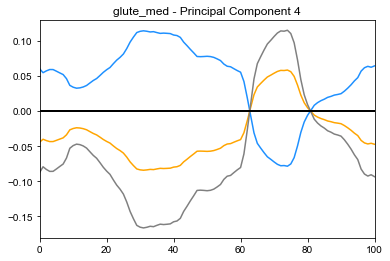

----------------------
Healthy Average: -0.6096830390121212
Injured Average: 0.7434487893972159
5th Percentile: -1.834409924548988
95th Percentile: 2.103137793267805


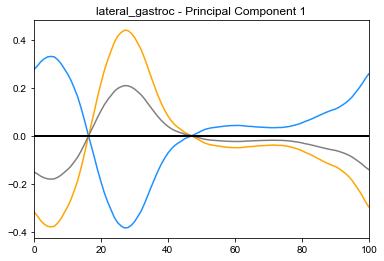

----------------------
Healthy Average: 0.1331477945357027
Injured Average: -0.28877868041653826
5th Percentile: -0.780014410155776
95th Percentile: 1.1932566649562237


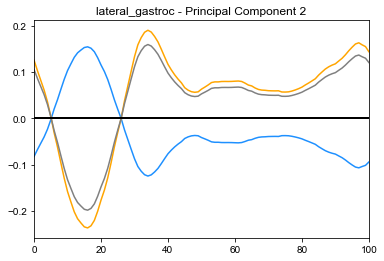

----------------------
Healthy Average: -0.5447169988031189
Injured Average: 0.02129956182478004
5th Percentile: -0.6762386897252799
95th Percentile: 0.7498682666305527


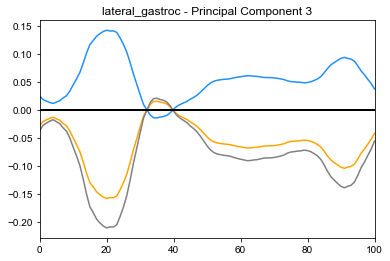

----------------------
Healthy Average: 0.11067383891275323
Injured Average: 0.03593912929997444
5th Percentile: -0.5357215973169448
95th Percentile: 0.2715046806918536


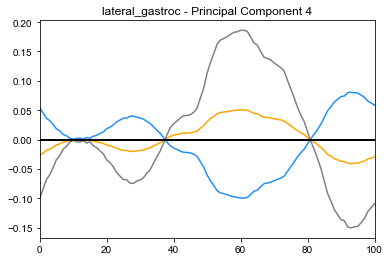

----------------------
Healthy Average: -0.48885805139767285
Injured Average: 0.9369051636654382
5th Percentile: -1.846032080394542
95th Percentile: 2.2013652394292076


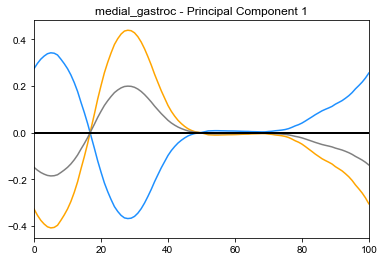

----------------------
Healthy Average: -0.269952198719446
Injured Average: -0.1564476948033821
5th Percentile: -0.7253959656448745
95th Percentile: 1.25123343626033


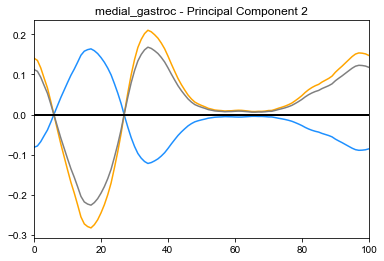

----------------------
Healthy Average: 0.0671647269384177
Injured Average: 0.0422868152226373
5th Percentile: -0.6027561562291701
95th Percentile: 0.9043738772218386


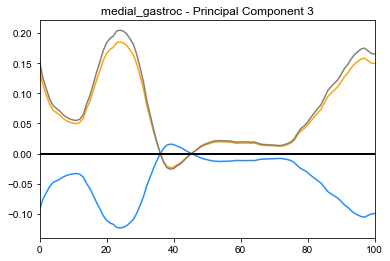

----------------------
Healthy Average: -0.022286713850804992
Injured Average: -0.059999124487385466
5th Percentile: -0.45851805475226826
95th Percentile: 0.5114186537020722


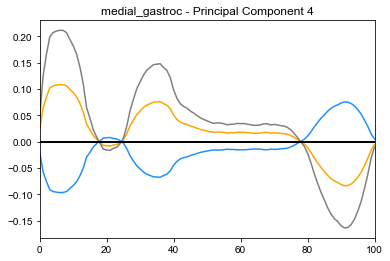

----------------------
Healthy Average: -1.2358933509038132
Injured Average: -0.2880585820199629
5th Percentile: -2.132784573134908
95th Percentile: 1.6845856253223401


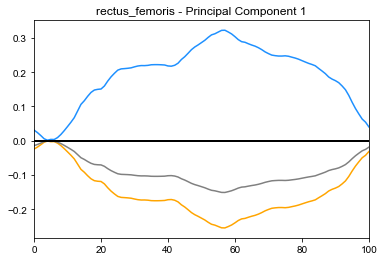

----------------------
Healthy Average: -0.4623922035111161
Injured Average: 0.7426926545035051
5th Percentile: -1.3140605952762403
95th Percentile: 1.6594442394472617


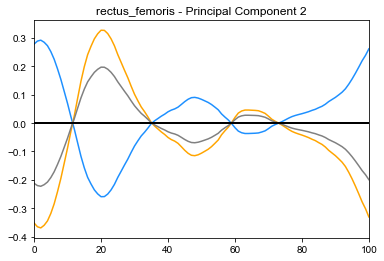

----------------------
Healthy Average: -0.11617850290437907
Injured Average: -0.12351568575641692
5th Percentile: -0.6828192447315544
95th Percentile: 1.2455426500586726


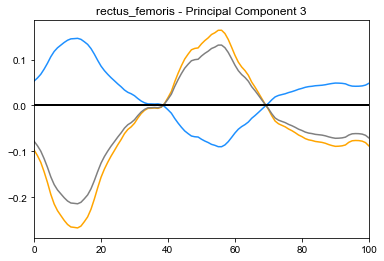

----------------------
Healthy Average: -0.20118938296677047
Injured Average: 0.173738452954909
5th Percentile: -0.7921507453216863
95th Percentile: 0.7460866603697098


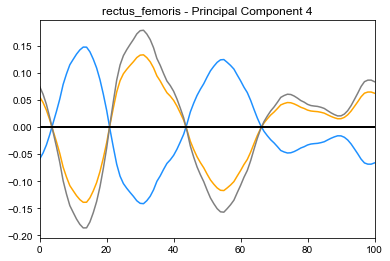

----------------------
Healthy Average: -0.661918367406647
Injured Average: 0.9249411255284036
5th Percentile: -1.6417820056035661
95th Percentile: 1.7116084654795927


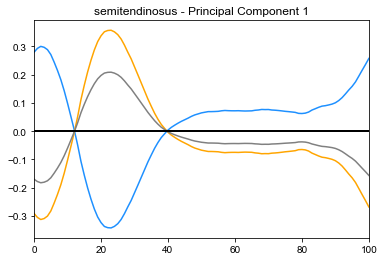

----------------------
Healthy Average: 0.44155385726072105
Injured Average: -0.1435395114254493
5th Percentile: -0.8959421820273802
95th Percentile: 1.6553938076978385


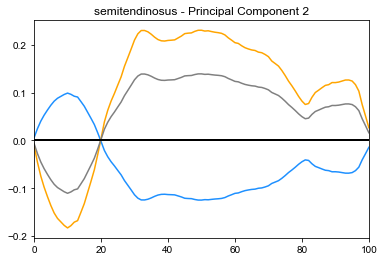

----------------------
Healthy Average: -0.1385300021105891
Injured Average: 0.033639974564186374
5th Percentile: -0.637634384372366
95th Percentile: 0.791600238382189


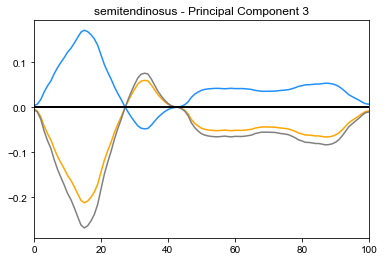

----------------------
Healthy Average: 0.0684710116161976
Injured Average: -0.07493201852628162
5th Percentile: -0.2350965321144949
95th Percentile: 0.374034039737902


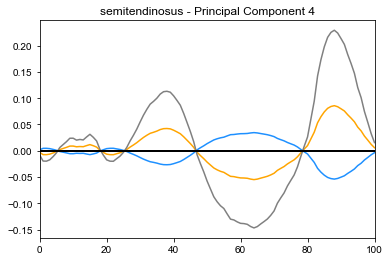

----------------------
Healthy Average: 0.040479897393753836
Injured Average: -0.45820699561578154
5th Percentile: -1.3503343173449855
95th Percentile: 2.194833627307267


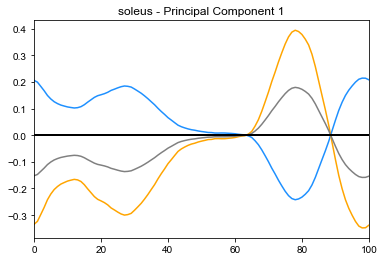

----------------------
Healthy Average: -0.5854305084473103
Injured Average: 0.12974596400531094
5th Percentile: -1.0270811216226758
95th Percentile: 1.6207969285179924


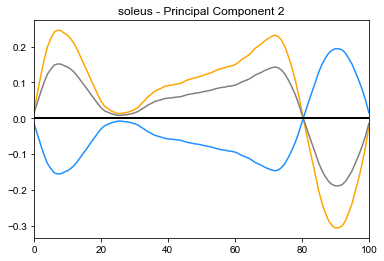

----------------------
Healthy Average: -0.2701892494351573
Injured Average: -0.03552374798188054
5th Percentile: -1.2289050285683534
95th Percentile: 1.3983074714845547


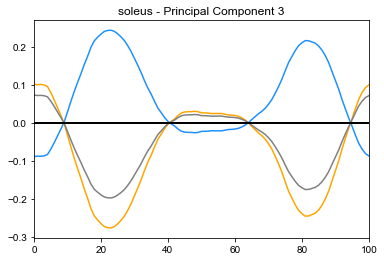

----------------------
Healthy Average: 0.05207837074804244
Injured Average: -0.1540316712194768
5th Percentile: -0.7869884712271441
95th Percentile: 1.053409325569511


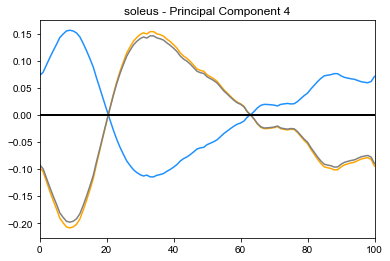

----------------------
Healthy Average: -0.09592870117236305
Injured Average: 0.2940579833626823
5th Percentile: -1.360640647574514
95th Percentile: 2.2511370432708557


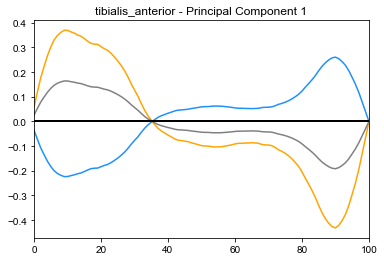

----------------------
Healthy Average: -0.4173184873948581
Injured Average: -0.06015269265908287
5th Percentile: -1.3083757458884406
95th Percentile: 1.7580830281421647


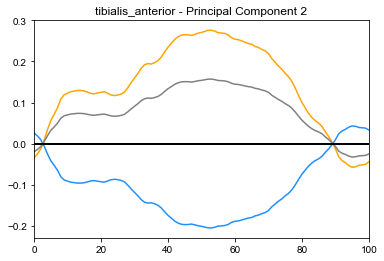

----------------------
Healthy Average: 0.039922498930049594
Injured Average: -0.4107711411066428
5th Percentile: -0.8717166970189713
95th Percentile: 1.6602045721116836


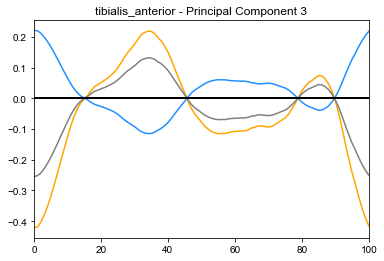

----------------------
Healthy Average: -0.26312140629649117
Injured Average: 0.17314568700561359
5th Percentile: -0.7338517668982283
95th Percentile: 0.7229874410532996


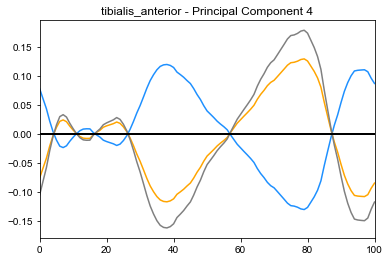

----------------------
Healthy Average: -0.5173244252615794
Injured Average: 0.897992056505722
5th Percentile: -1.869877277616089
95th Percentile: 1.9421898405498252


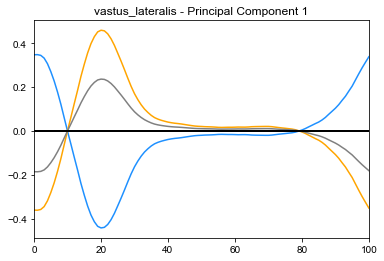

----------------------
Healthy Average: -0.4654018514462318
Injured Average: 0.022459896859628847
5th Percentile: -0.7480208202797831
95th Percentile: 1.4120281718328438


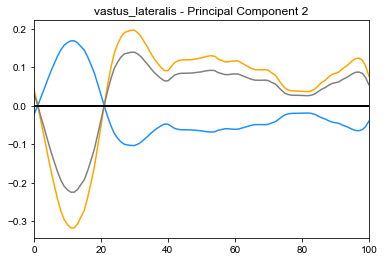

----------------------
Healthy Average: 0.02235263223022599
Injured Average: 0.02266093628430208
5th Percentile: -0.5330822773737935
95th Percentile: 0.3839286177353984


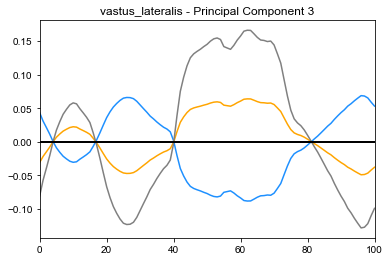

----------------------
Healthy Average: -0.07664534434353809
Injured Average: 0.1868967738024272
5th Percentile: -0.46789789465813103
95th Percentile: 0.7281694570631325


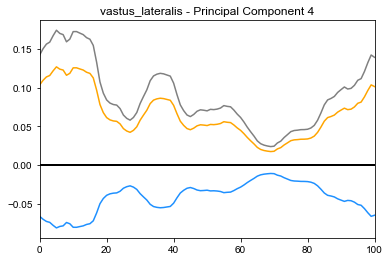

----------------------
Healthy Average: -0.5651946622907001
Injured Average: 0.969703323604054
5th Percentile: -1.7852796729584586
95th Percentile: 2.106006884363552


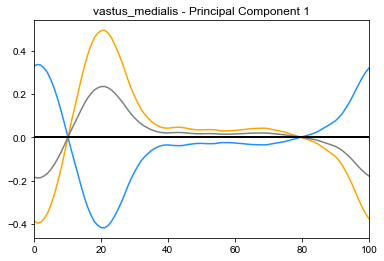

----------------------
Healthy Average: -0.3864530886605768
Injured Average: 0.19908628916874746
5th Percentile: -0.7719873770281533
95th Percentile: 1.4402651866126723


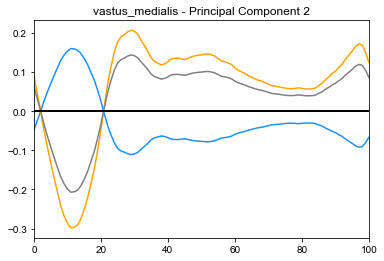

----------------------
Healthy Average: 0.030844759257557055
Injured Average: 0.1912102721263634
5th Percentile: -0.640462505329721
95th Percentile: 0.5578835139193914


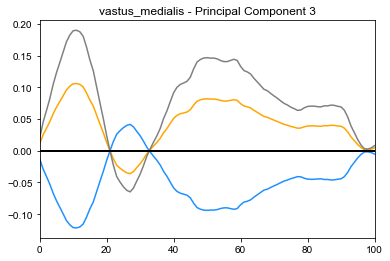

----------------------
Healthy Average: 0.052077257447286106
Injured Average: 0.01729247970379154
5th Percentile: -0.37321206217784814
95th Percentile: 0.4330017670661761


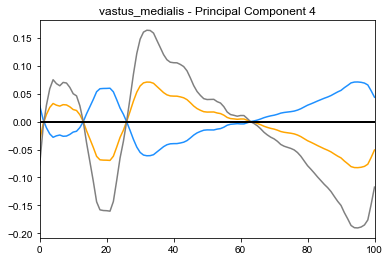

<Figure size 432x288 with 0 Axes>

In [78]:
#create a directory of the PC scores matrices
os.chdir('/Users/rossbrancati/Desktop/PFP_Project/EMG/Data/PCA_matrices/individual_means/')
PC_scores_dir = sorted(os.listdir(os.path.join(os.getcwd(), 'PCA_scores')))
PC_scores_dir_path = os.path.join(os.getcwd(), 'PCA_scores')

#create a directory for the loadings of the PC_score matrices
os.chdir('/Users/rossbrancati/Desktop/PFP_Project/EMG/Data/PCA_matrices/individual_means/')
loadings_dir = os.path.join(os.getcwd(), 'loadings')

for file_idx, file_name in enumerate(PC_scores_dir):
    
    #get the current PC_scores_file
    current_score_path = os.path.join(PC_scores_dir_path,file_name)
    current_score_matrix = pd.read_csv(current_score_path,sep='\t')
    #load the loadings matrix 
    current_loadings_mat_path = loadings_dir+'/loadings_'+file_name
    current_loadings_matrix = pd.read_csv(current_loadings_mat_path,sep='\t')
    
    
    #set range to 4 because the highest EMG feature was the 4th PC
    for PC_num in range(4):
        
        #extract the row of the loadings matrix for the current PC
        current_loading_PC = np.array(current_loadings_matrix.loc[PC_num,:])
        current_loading_PC = current_loading_PC[1:]
        
        #extract first column of the PC_scores matrix
        current_PC_scores = np.array(current_score_matrix)
        current_PC_scores_vector = current_PC_scores[:,PC_num+1]
        #5th percentile:
        fifth_percentile = np.percentile(current_PC_scores_vector, 5)
        mean_healthy = np.average(current_PC_scores_vector[0:18])
        #95th percentile:
        mean_injured = np.average(current_PC_scores_vector[18:35])
        nintyfifth_percentile = np.percentile(current_PC_scores_vector, 95)
        
        #Create a string for the current principal component
        PC_number = str(PC_num+1)
        
        #Plot the loading vector multiplied by the 5th and 95th percentile of PC_score
        #plt.figure(PC_num)
        print("----------------------")
        print('Healthy Average:', mean_healthy)
        print('Injured Average:', mean_injured)
        print('5th Percentile:', fifth_percentile)
        print('95th Percentile:', nintyfifth_percentile)
        plt.ion()
        plt.plot(current_loading_PC*fifth_percentile, color = "dodgerblue")
        plt.plot(current_loading_PC*nintyfifth_percentile, color = "orange")
        plt.plot(current_loading_PC, color='gray')
        plt.plot([0, 100], [0, 0], color='k', linewidth=2)
        plt.xlim(0,100)
        plt.title(file_name[0:-4]+' - Principal Component '+PC_number)
        plt.show()
        #plt.savefig('/Users/rossbrancati/Desktop/PFP_Project/kinetic_kinematic/plots/5_and_95_plots/'+file_name[0:-4]+'/'+file_name[0:-4]+'_PC_'+PC_number)
        plt.clf()

To help with interpretation, plot the mean of the healthy and injured groups at minute 1

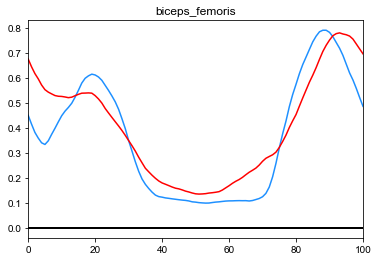

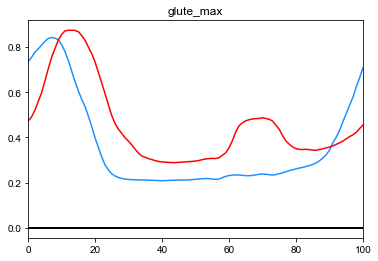

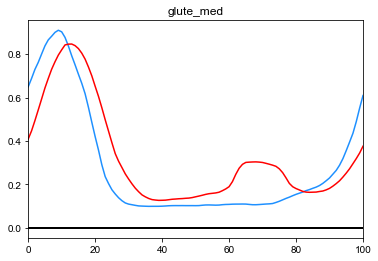

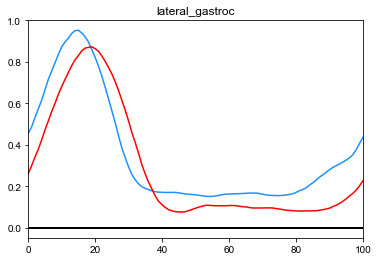

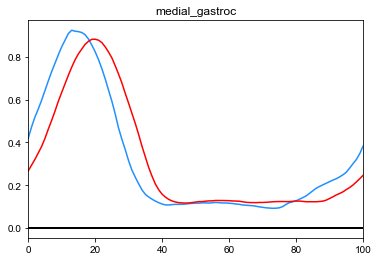

...

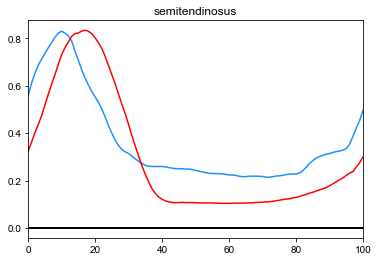

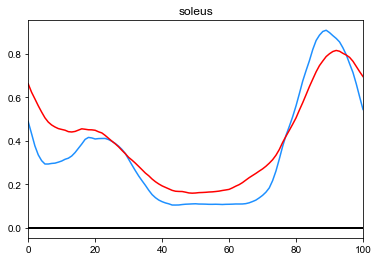

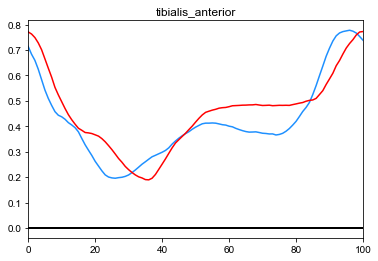

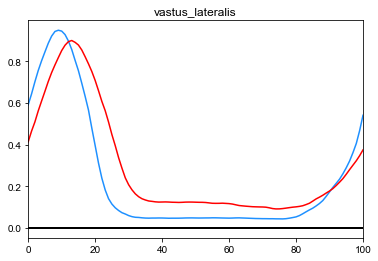

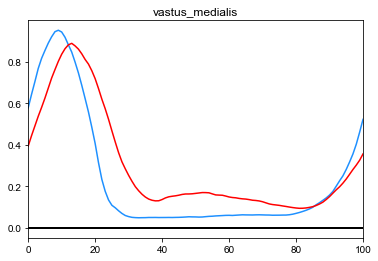

<Figure size 432x288 with 0 Axes>

In [151]:
#create an empty numpy array to store the mean of every variable in
all_emg_variable_means_M1 = np.empty((101,11))
emg_headers_M1 = []

#create a directory of the metric matrices
os.chdir('/Users/rossbrancati/Desktop/PFP_Project/EMG/Data/metric_matrices/individual_means/all_groups')
PC_scores_dir = sorted(os.listdir(os.getcwd()))

#loop over files in directory
for file_idx, file_name in enumerate(PC_scores_dir):
    
    #load the file
    current_file = pd.read_csv('/Users/rossbrancati/Desktop/PFP_Project/EMG/Data/metric_matrices/individual_means/all_groups/'+file_name, header=None, sep='\t')
    #convert first 35 rows to array
    healthy_mean = np.array(current_file.loc[0:18,:])
    injured_mean = np.array(current_file.loc[18:35,:])
    overall_mean = np.array(current_file.loc[0:35,:])
    all_mean = np.array(current_file.iloc[0:35])
    
    #append mean of all observations to array
    all_emg_variable_means_M1[:,file_idx] = (np.mean(all_mean, axis=0))
    #append file name to list of headers
    emg_headers_M1.append(file_name[0:-4])
    
    #plot the mean waveform of the healthy and injured runners
    plt.ion()
    plt.plot((np.mean(healthy_mean, axis=0)), color = 'dodgerblue')
    plt.plot((np.mean(injured_mean, axis=0)), color = 'red')
    #plt.plot((np.mean(overall_mean, axis=0)), color = 'black')
    plt.plot([0, 100], [0, 0], color='k', linewidth=2)
    plt.xlim(0,100)
    plt.title(file_name[0:-4])
    plt.show()
    plt.clf()
    
#emg_M1_means_df = pd.DataFrame(all_emg_variable_means_M1, columns=emg_headers_M1)
#emg_M1_means_df.to_csv("/Users/rossbrancati/Desktop/PFP_Project/machine_learning/machine_learning_data/results_feb_2022/mean_waveforms/emg_variable_means_M1.csv")

# Part 6: Intepreting the principal components for the scores at the 21st minute

Follow same procedure as part 5 using the minute 21 data.

**First, kinetic and kinematic data**

----------------------
Healthy Average: 0.8254150099945528
Injured Average: 0.4212606480728877
5th Percentile: -3.5870789193291692
95th Percentile: 4.263169460939895


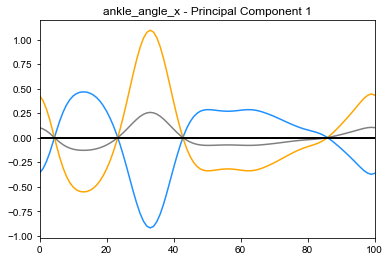

----------------------
Healthy Average: -0.4350207702424338
Injured Average: 0.18243264286490174
5th Percentile: -2.7272574343298928
95th Percentile: 3.071871353622967


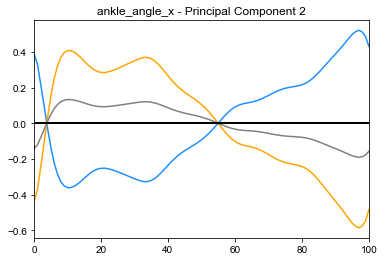

----------------------
Healthy Average: 0.42008636488097767
Injured Average: 0.3380943207934871
5th Percentile: -2.428842918022481
95th Percentile: 2.2218962889466667


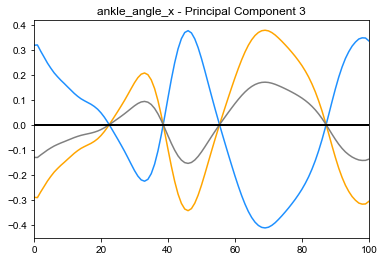

----------------------
Healthy Average: -0.16155514578737373
Injured Average: 0.5029062049033192
5th Percentile: -1.0883392920997108
95th Percentile: 1.9005096566713506


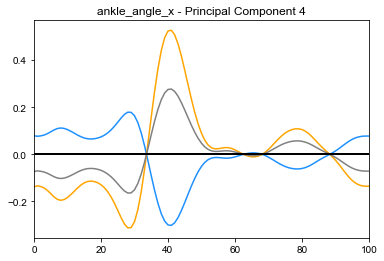

----------------------
Healthy Average: -0.06693216172500253
Injured Average: 0.08524651332515373
5th Percentile: -1.3641547884052696
95th Percentile: 1.2944930575177285


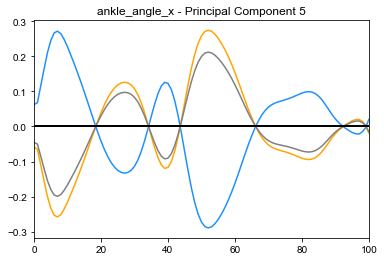

----------------------
Healthy Average: -0.05888442829102987
Injured Average: -0.15547368946353118
5th Percentile: -0.7209461577304989
95th Percentile: 0.7912077283843219


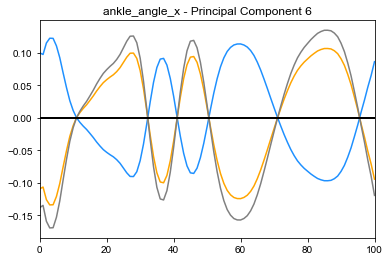

----------------------
Healthy Average: -0.06999271851905564
Injured Average: 0.3226017237888661
5th Percentile: -0.6651449016702587
95th Percentile: 0.7657680381567895


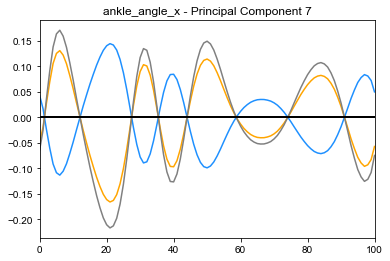

----------------------
Healthy Average: -0.9568809774425875
Injured Average: 0.3164150019617566
5th Percentile: -3.8966975713571697
95th Percentile: 4.947309145220159


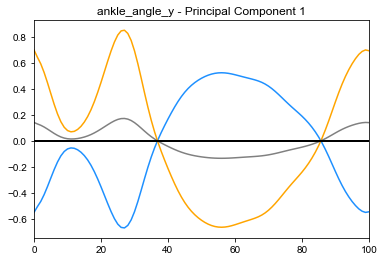

----------------------
Healthy Average: 1.0139736846640357
Injured Average: -0.2096654523411461
5th Percentile: -3.355249206031374
95th Percentile: 3.660790560558723


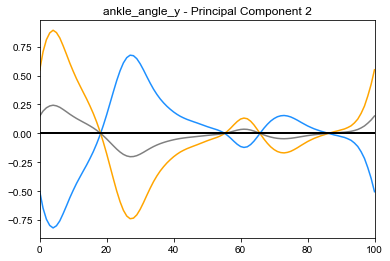

----------------------
Healthy Average: 0.533883292211617
Injured Average: -0.026242832344521645
5th Percentile: -2.717983012878122
95th Percentile: 3.3706026562584133


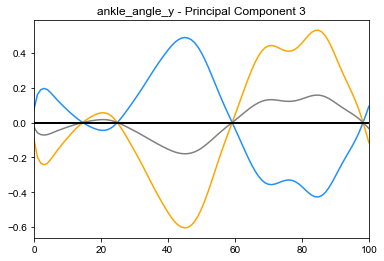

----------------------
Healthy Average: 0.3210004421605523
Injured Average: 0.054344751152567566
5th Percentile: -1.6195988990664638
95th Percentile: 1.8659775466802624


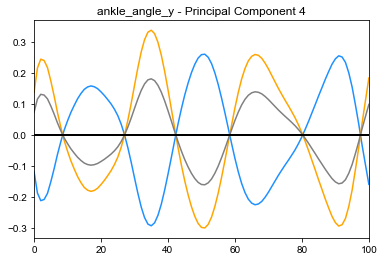

----------------------
Healthy Average: -0.14917380596337726
Injured Average: -0.0783248142787895
5th Percentile: -1.734300266483145
95th Percentile: 1.7031829567910621


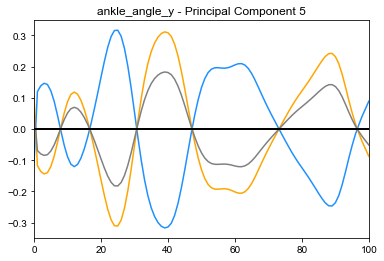

----------------------
Healthy Average: 0.16290911300486474
Injured Average: -0.18539038564251678
5th Percentile: -1.3921481830266762
95th Percentile: 1.1591210504502234


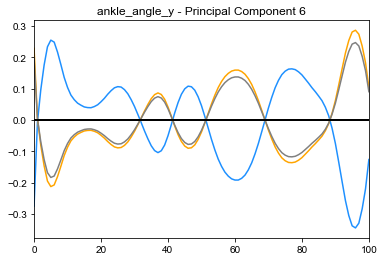

----------------------
Healthy Average: 0.17837860861233104
Injured Average: 0.20397223148442167
5th Percentile: -1.3587407424011884
95th Percentile: 1.2440582893720236


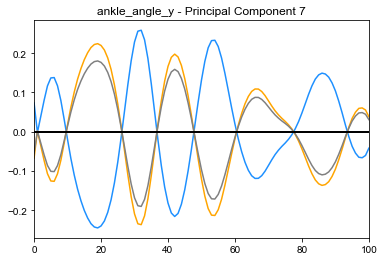

----------------------
Healthy Average: 0.28957452333527395
Injured Average: 0.47678938985040314
5th Percentile: -6.4023471821658635
95th Percentile: 6.282523984494191


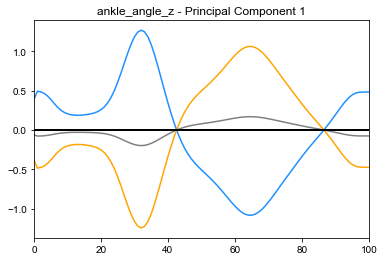

----------------------
Healthy Average: -0.19707797601938595
Injured Average: -0.2538928108668792
5th Percentile: -3.429378621516642
95th Percentile: 5.019386119451151


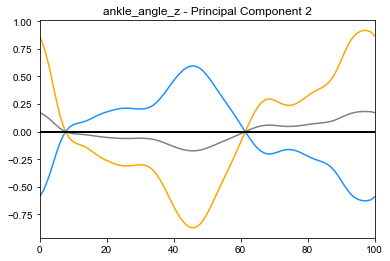

----------------------
Healthy Average: 0.56226545621163
Injured Average: 0.8746160410825632
5th Percentile: -4.392171590446471
95th Percentile: 4.577163261059851


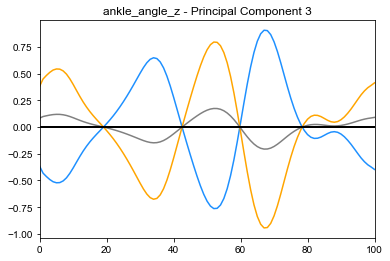

----------------------
Healthy Average: 0.22131089239036572
Injured Average: -0.0005239957041053161
5th Percentile: -3.098709375449855
95th Percentile: 3.831709136640027


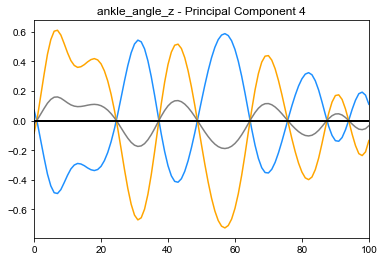

----------------------
Healthy Average: -0.33957422248537883
Injured Average: -0.515934485130438
5th Percentile: -2.4706371801331186
95th Percentile: 2.748912760210781


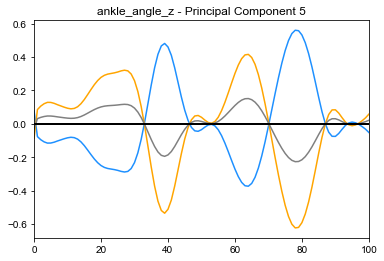

----------------------
Healthy Average: -0.11324620150446213
Injured Average: -0.07452696515859568
5th Percentile: -2.205015046742459
95th Percentile: 2.699663287138911


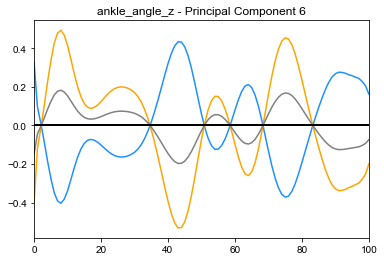

----------------------
Healthy Average: 0.40571207317545677
Injured Average: -0.17441486208759127
5th Percentile: -1.848127297847603
95th Percentile: 2.4005832946875096


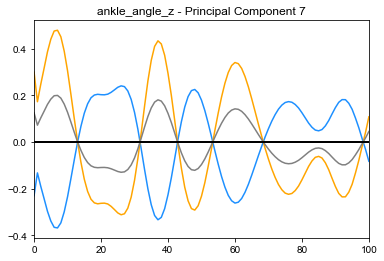

----------------------
Healthy Average: 0.9619590809044025
Injured Average: 0.3788621927894472
5th Percentile: -3.872254412588858
95th Percentile: 4.509182814346131


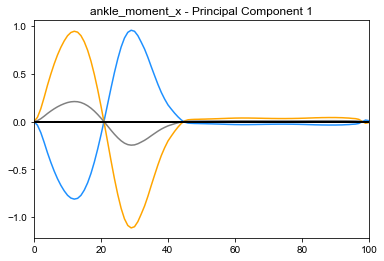

----------------------
Healthy Average: -0.20144939105872073
Injured Average: 0.4811060980830447
5th Percentile: -0.9223587969763091
95th Percentile: 1.3386820115641662


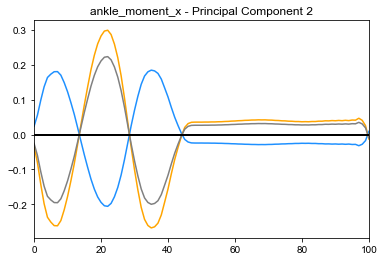

----------------------
Healthy Average: 0.11260655352691896
Injured Average: -0.0759076194719941
5th Percentile: -0.6758498630493204
95th Percentile: 0.7453955523518536


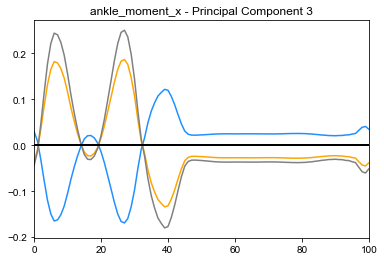

----------------------
Healthy Average: -0.04377152736005159
Injured Average: -0.10561683921135928
5th Percentile: -0.33907430375479
95th Percentile: 0.4285996010052893


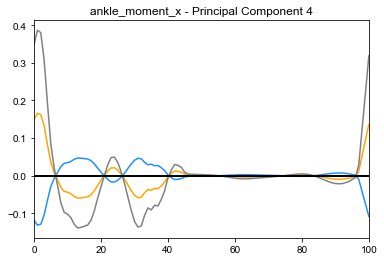

----------------------
Healthy Average: 0.0349267951991131
Injured Average: 0.02521601117422779
5th Percentile: -0.28491795560925015
95th Percentile: 0.37121721257331486


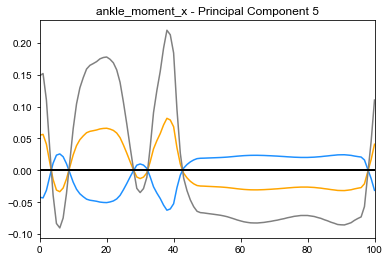

----------------------
Healthy Average: -0.035393623889065716
Injured Average: -0.06515333412189343
5th Percentile: -0.22464792873368372
95th Percentile: 0.18163726354942525


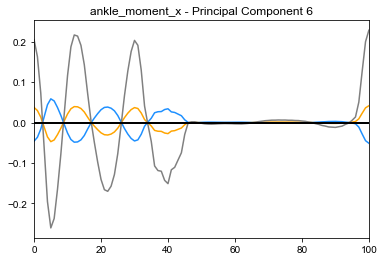

----------------------
Healthy Average: -0.00011626795553580444
Injured Average: 0.011757085991234876
5th Percentile: -0.16473049808512574
95th Percentile: 0.16153913257059743


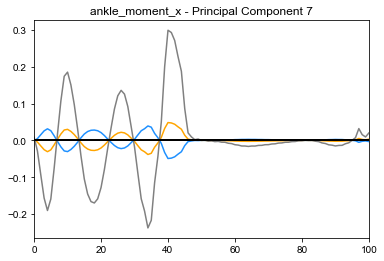

----------------------
Healthy Average: -0.36866497193966574
Injured Average: 1.3291449108114066
5th Percentile: -4.955503604212314
95th Percentile: 11.303380415646753


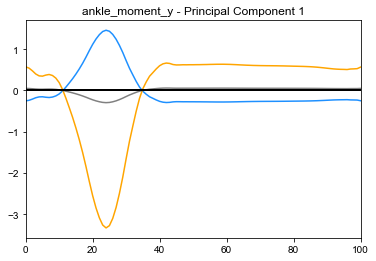

----------------------
Healthy Average: 0.17420748746426037
Injured Average: 0.8591052846392059
5th Percentile: -3.400426598248208
95th Percentile: 3.7832823331161762


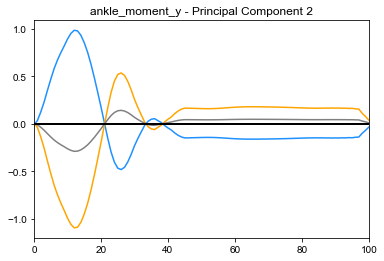

----------------------
Healthy Average: -0.37633977639573957
Injured Average: 0.2837320542314565
5th Percentile: -2.2453682142461298
95th Percentile: 2.4959579594546293


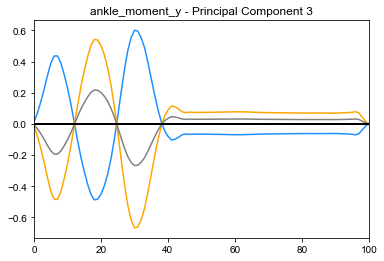

----------------------
Healthy Average: -0.22140414129512076
Injured Average: -0.2980694743893434
5th Percentile: -1.7877839033494012
95th Percentile: 1.6218196567555234


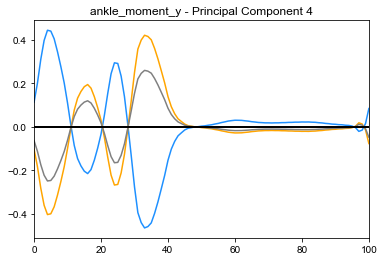

----------------------
Healthy Average: -0.07663439219283237
Injured Average: 0.3199331653159778
5th Percentile: -0.9471367502786792
95th Percentile: 0.9051416106760877


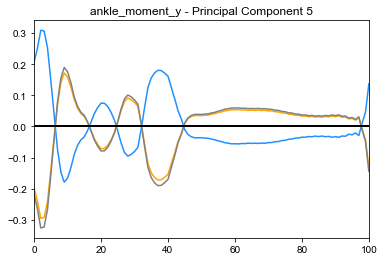

----------------------
Healthy Average: -0.11684728427414107
Injured Average: -0.2984550969344083
5th Percentile: -0.970495239875789
95th Percentile: 0.9126864161572928


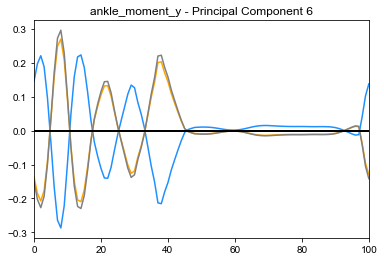

----------------------
Healthy Average: 0.10460509674895618
Injured Average: 0.02041435317809885
5th Percentile: -0.519324201758063
95th Percentile: 0.5241978402446102


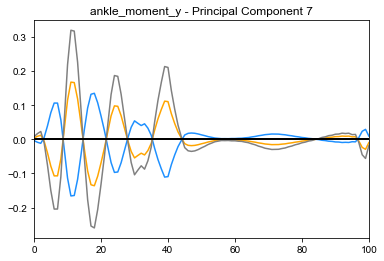

----------------------
Healthy Average: 1.9818178530826411
Injured Average: -1.1273586953066939
5th Percentile: -4.281857984651446
95th Percentile: 8.398819002854099


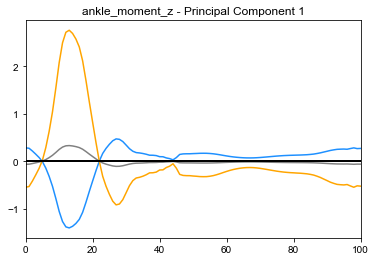

----------------------
Healthy Average: -0.6508471095299067
Injured Average: -0.3715779644063408
5th Percentile: -3.6009525526374846
95th Percentile: 6.102749016264964


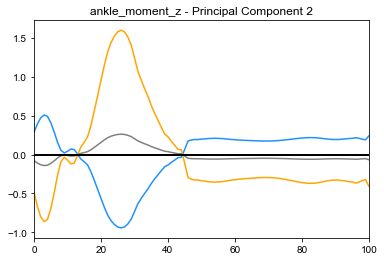

----------------------
Healthy Average: -0.5568581686655873
Injured Average: 0.8754470569304171
5th Percentile: -3.6261036728466047
95th Percentile: 2.8963879802835115


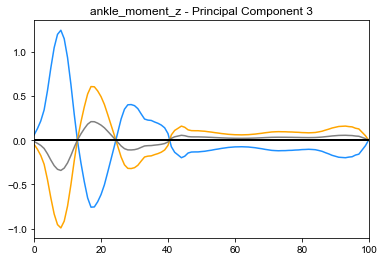

----------------------
Healthy Average: -0.5163509724236237
Injured Average: 0.3707182139336069
5th Percentile: -2.138617583904492
95th Percentile: 3.1236971484498426


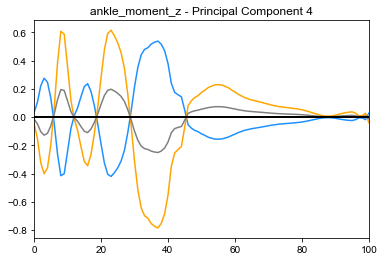

----------------------
Healthy Average: -0.06656911949612743
Injured Average: 0.5146688718991123
5th Percentile: -1.9165549449330028
95th Percentile: 1.4225489949621106


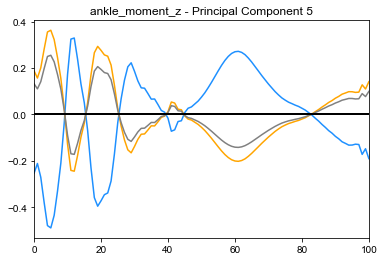

----------------------
Healthy Average: -0.2273941904979683
Injured Average: 0.07374101674796561
5th Percentile: -1.318055466443635
95th Percentile: 1.3679219063518857


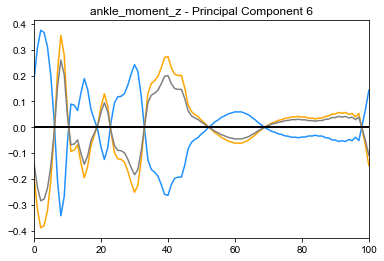

----------------------
Healthy Average: 0.05725619180079936
Injured Average: 0.012156230061746254
5th Percentile: -0.9519019965641049
95th Percentile: 0.979668833553233


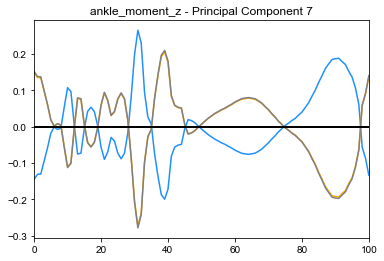

----------------------
Healthy Average: -0.6560250344925769
Injured Average: -0.4526591456316239
5th Percentile: -3.5463358079622824
95th Percentile: 2.6527232199718096


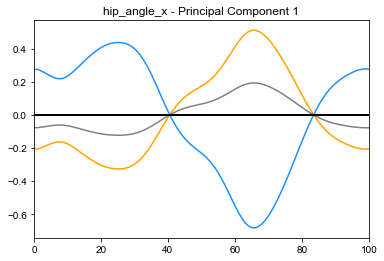

----------------------
Healthy Average: -0.11980875781250257
Injured Average: 0.35284193635454303
5th Percentile: -1.0580883477291483
95th Percentile: 1.0657173605584689


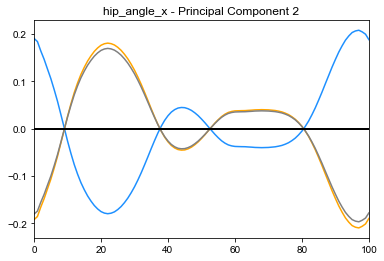

----------------------
Healthy Average: 0.09269345826627336
Injured Average: -0.30441834207154644
5th Percentile: -1.0258714634104873
95th Percentile: 0.8745033875352666


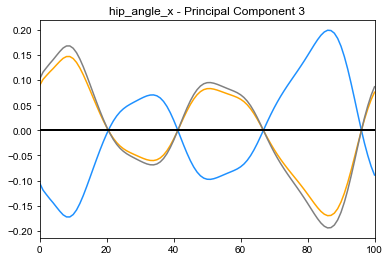

----------------------
Healthy Average: -0.0841397335358664
Injured Average: 0.1030200982101933
5th Percentile: -0.6581974317902488
95th Percentile: 0.7384472217232048


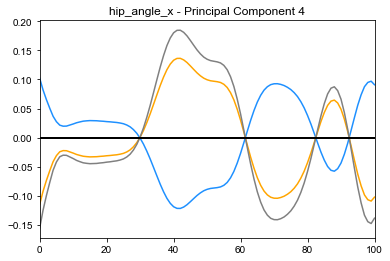

----------------------
Healthy Average: -0.017490925342719878
Injured Average: 0.05225445548964502
5th Percentile: -0.5049454135353707
95th Percentile: 0.4535427021748588


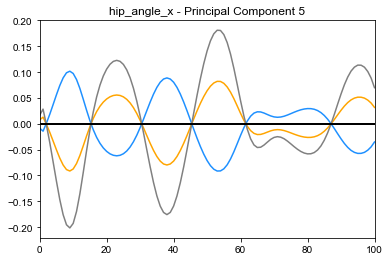

----------------------
Healthy Average: -0.04966231879545073
Injured Average: 0.03365888699591944
5th Percentile: -0.512707244590139
95th Percentile: 0.445395990838203


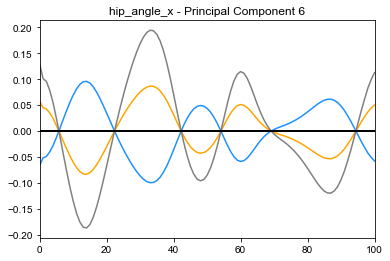

----------------------
Healthy Average: -0.01975709340330532
Injured Average: -0.040580060098776426
5th Percentile: -0.4116892813772775
95th Percentile: 0.2907103194837332


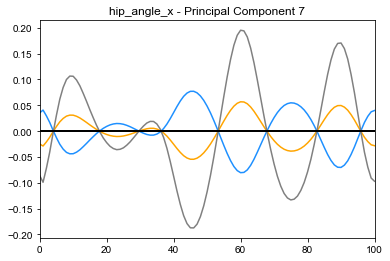

----------------------
Healthy Average: 0.42970625751629443
Injured Average: 0.9660524505069554
5th Percentile: -2.07963791103648
95th Percentile: 2.311384179067166


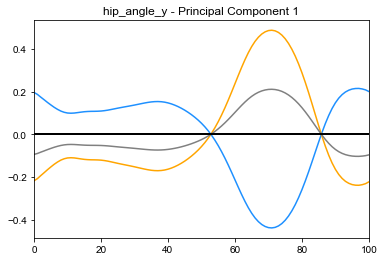

----------------------
Healthy Average: 0.831262404536533
Injured Average: -0.46723364130152495
5th Percentile: -3.9240444245934265
95th Percentile: 3.8547518264724143


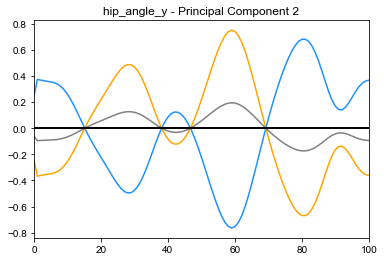

----------------------
Healthy Average: -0.35512749105463737
Injured Average: 0.285828183777597
5th Percentile: -2.3884849879310313
95th Percentile: 2.963241840890317


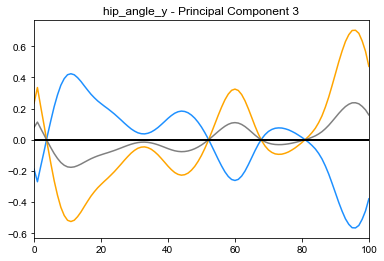

----------------------
Healthy Average: -0.5732844365360809
Injured Average: -0.5723417328499034
5th Percentile: -2.360770330242183
95th Percentile: 2.972989119341609


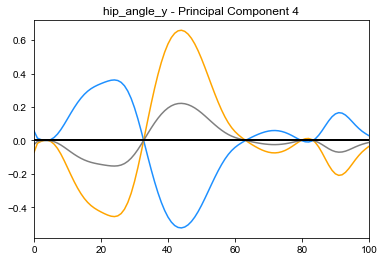

----------------------
Healthy Average: -0.22994465018814483
Injured Average: -0.5069701529346731
5th Percentile: -1.6885215735695789
95th Percentile: 2.034786840688301


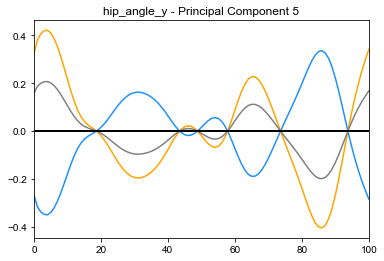

----------------------
Healthy Average: -0.11308198143943683
Injured Average: -0.3368920584910279
5th Percentile: -1.4187128674106715
95th Percentile: 1.323765750524


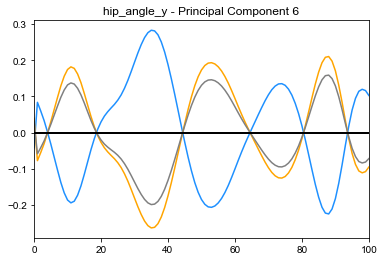

----------------------
Healthy Average: 0.20158792478350768
Injured Average: 0.087848169330964
5th Percentile: -1.0732568650506042
95th Percentile: 0.8159481429665689


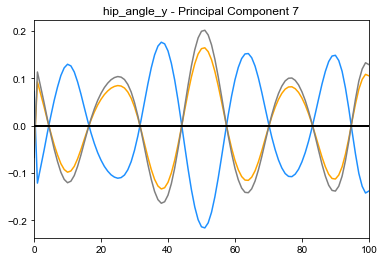

----------------------
Healthy Average: -1.498809860946672
Injured Average: 2.3576990154503603
5th Percentile: -7.72308775206547
95th Percentile: 9.087086345066252


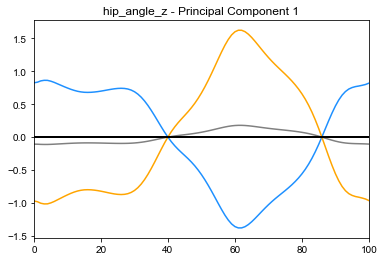

----------------------
Healthy Average: 0.04120764542364392
Injured Average: 1.1795146591147705
5th Percentile: -5.895700341072843
95th Percentile: 8.694527744426273


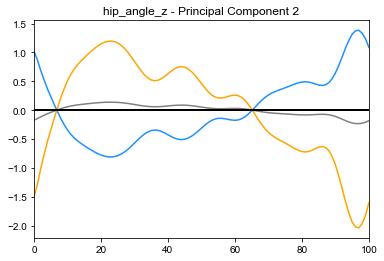

----------------------
Healthy Average: -1.19997348204768
Injured Average: -0.49261565771587357
5th Percentile: -5.742379592837506
95th Percentile: 6.92641871593596


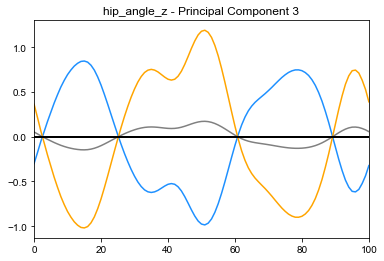

----------------------
Healthy Average: 0.06575764210550125
Injured Average: -0.22556610519931858
5th Percentile: -3.2625912242517012
95th Percentile: 4.440232493402888


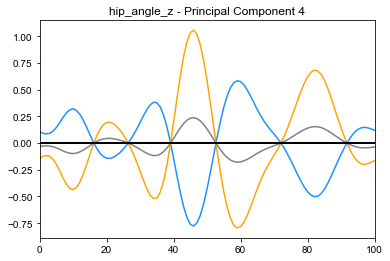

----------------------
Healthy Average: 0.5647547349255364
Injured Average: -0.6210848159864348
5th Percentile: -3.1774557969783235
95th Percentile: 4.849314153890579


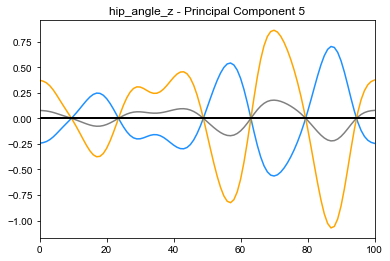

----------------------
Healthy Average: 0.31987171823943106
Injured Average: -0.11608713173967031
5th Percentile: -3.3593223052571477
95th Percentile: 3.5567389082967957


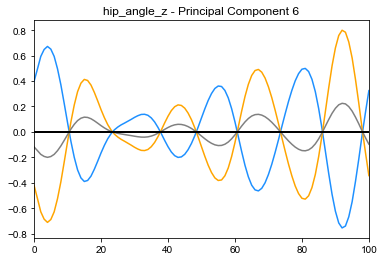

----------------------
Healthy Average: -0.11364086518544307
Injured Average: 0.5620231034464906
5th Percentile: -3.0801189391886914
95th Percentile: 2.745560107153213


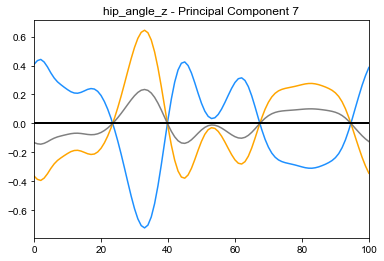

----------------------
Healthy Average: -0.7458411616684599
Injured Average: -0.1534016611633577
5th Percentile: -3.165852225225061
95th Percentile: 2.9125876668904733


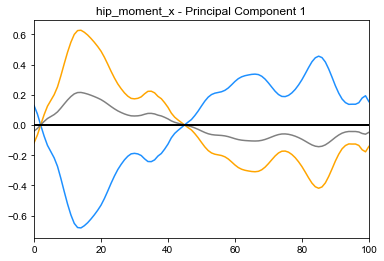

----------------------
Healthy Average: 0.09661013579050008
Injured Average: 0.6074010815069001
5th Percentile: -1.6926987233679822
95th Percentile: 1.7992072721551648


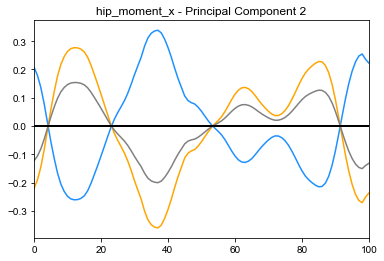

----------------------
Healthy Average: -0.14846757899324453
Injured Average: -0.17726004481329866
5th Percentile: -1.096418012960112
95th Percentile: 1.3360244925032456


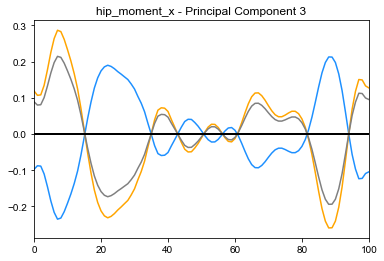

----------------------
Healthy Average: -0.15685100015705308
Injured Average: 0.029253285377142627
5th Percentile: -1.0820688096500772
95th Percentile: 1.365796831199298


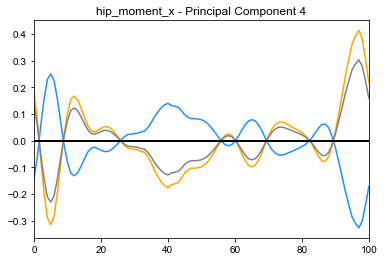

----------------------
Healthy Average: 0.03591847727801006
Injured Average: 0.2962167681905753
5th Percentile: -0.8223642674562377
95th Percentile: 1.144602943182869


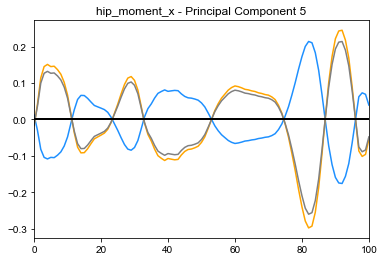

----------------------
Healthy Average: 0.00318255927904303
Injured Average: 0.3104276819521
5th Percentile: -0.9786590045649644
95th Percentile: 0.8025300830208313


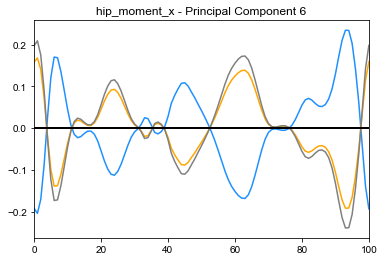

----------------------
Healthy Average: -0.017602836836382554
Injured Average: 0.1476812947017178
5th Percentile: -0.6719111428263771
95th Percentile: 0.7835628356198081


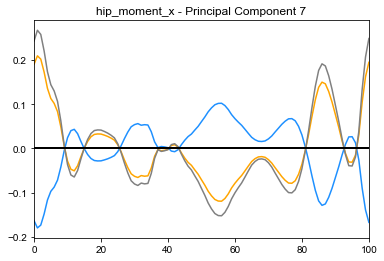

----------------------
Healthy Average: 0.4132046906150533
Injured Average: -0.4734100932401406
5th Percentile: -6.999628244667088
95th Percentile: 10.740923510595042


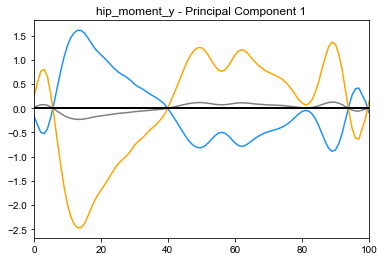

----------------------
Healthy Average: 0.381257251221359
Injured Average: 1.6289065019546731
5th Percentile: -5.854554783517775
95th Percentile: 6.116710623558461


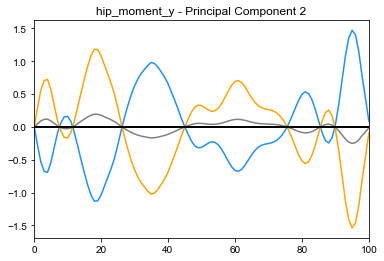

----------------------
Healthy Average: 0.5416883038241456
Injured Average: -0.8132582326971318
5th Percentile: -4.40974959702685
95th Percentile: 4.69668630424467


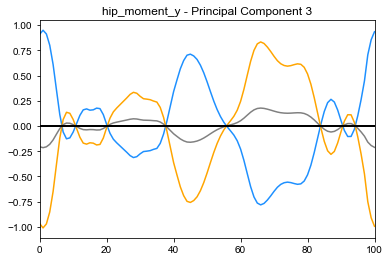

----------------------
Healthy Average: -0.028872949866598992
Injured Average: 0.382711548469796
5th Percentile: -4.6785629828163495
95th Percentile: 3.5886319265649442


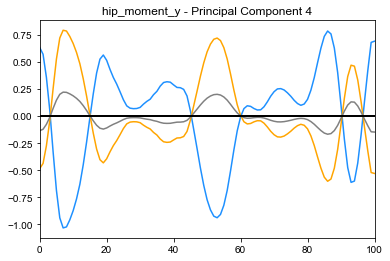

----------------------
Healthy Average: 0.0970119208409605
Injured Average: 0.29891879518660425
5th Percentile: -3.535074292417509
95th Percentile: 2.846019368923143


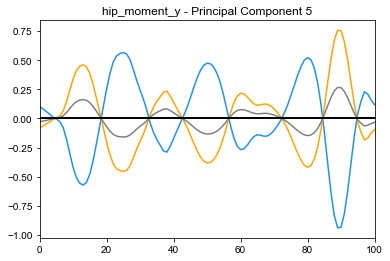

----------------------
Healthy Average: -0.3217092048600091
Injured Average: 0.4931249085163234
5th Percentile: -3.138146991392484
95th Percentile: 3.6003134796790683


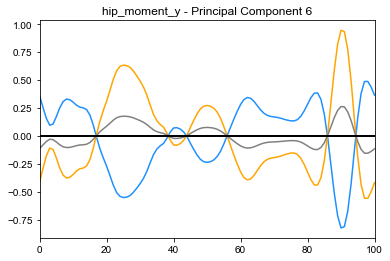

----------------------
Healthy Average: 0.7542240394156959
Injured Average: 0.3487730850040531
5th Percentile: -2.6549399766082695
95th Percentile: 2.942705077920527


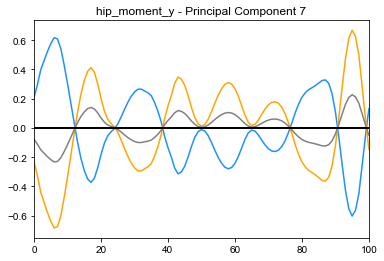

----------------------
Healthy Average: -0.7809389509170297
Injured Average: 1.616427295463476
5th Percentile: -4.5713438785221765
95th Percentile: 10.236196431583139


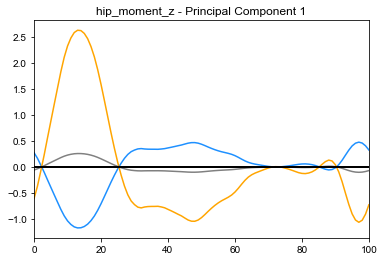

----------------------
Healthy Average: -0.3270538876675225
Injured Average: 0.14407045453638162
5th Percentile: -2.605561869297941
95th Percentile: 3.2576759176603436


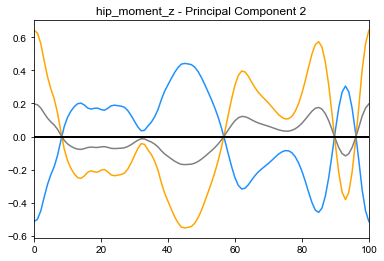

----------------------
Healthy Average: -0.5027246154672291
Injured Average: -0.43480435975848936
5th Percentile: -2.8442390185407227
95th Percentile: 3.139851796585125


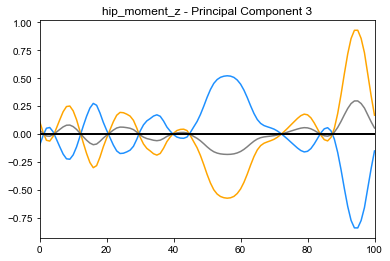

----------------------
Healthy Average: -0.13778314927154928
Injured Average: 0.24537079557031014
5th Percentile: -2.526805159270194
95th Percentile: 2.612534109355076


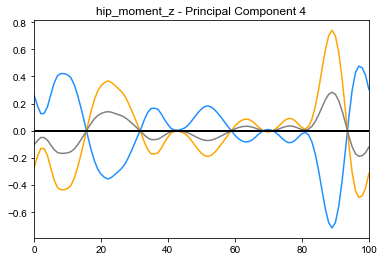

----------------------
Healthy Average: -0.1531848502546166
Injured Average: 0.09316748941240985
5th Percentile: -1.9661683987193548
95th Percentile: 2.570711781042641


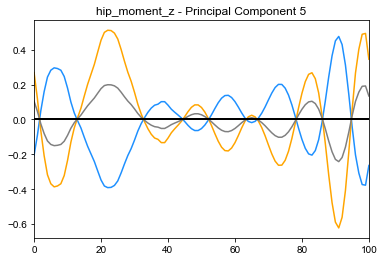

----------------------
Healthy Average: 0.003141410903160714
Injured Average: -0.7013188583852155
5th Percentile: -1.835088317706105
95th Percentile: 2.05801408392249


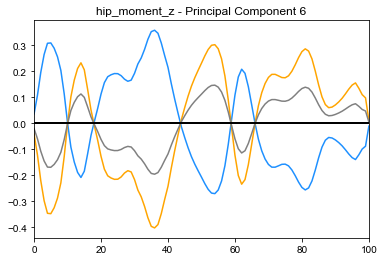

----------------------
Healthy Average: -0.08939755140086258
Injured Average: -0.25988385891448185
5th Percentile: -1.6968063636164183
95th Percentile: 1.833171854851795


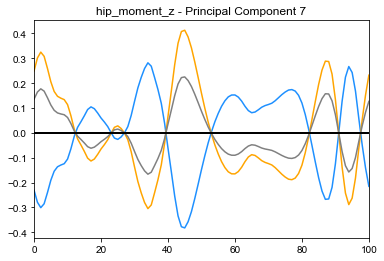

----------------------
Healthy Average: 0.22440142708000507
Injured Average: 0.8769412369214548
5th Percentile: -2.457537821351639
95th Percentile: 3.3655116724973135


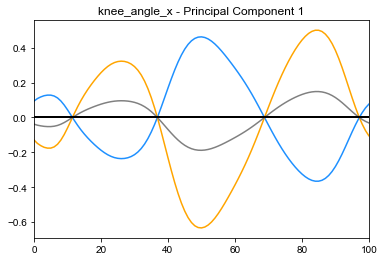

----------------------
Healthy Average: 0.16559452409444037
Injured Average: 0.128365735294166
5th Percentile: -1.4218752203756169
95th Percentile: 1.387813470828564


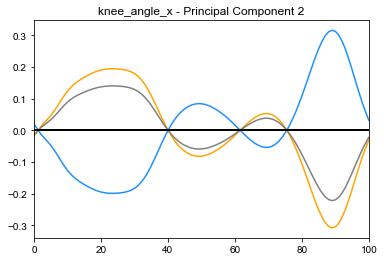

----------------------
Healthy Average: 0.19674970433649946
Injured Average: 0.02753966468233708
5th Percentile: -0.9630627769103722
95th Percentile: 1.0845305635970155


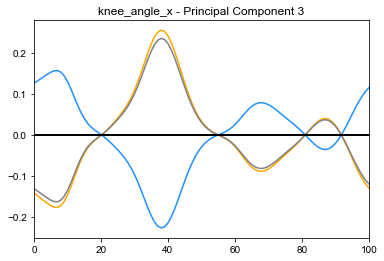

----------------------
Healthy Average: -0.1662797827836052
Injured Average: 0.2735754172984234
5th Percentile: -0.38754483416221
95th Percentile: 0.4726604076277108


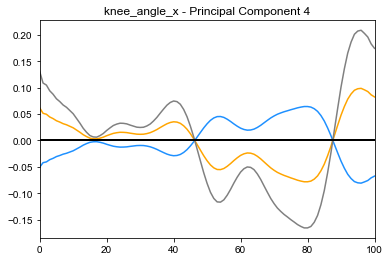

----------------------
Healthy Average: -0.06413907195852439
Injured Average: -0.07626356430940394
5th Percentile: -0.40514245923245823
95th Percentile: 0.4980562071128075


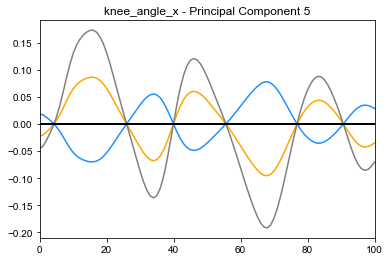

----------------------
Healthy Average: -0.019494091381231794
Injured Average: -0.027868743425548518
5th Percentile: -0.4343943388243767
95th Percentile: 0.3575671276938264


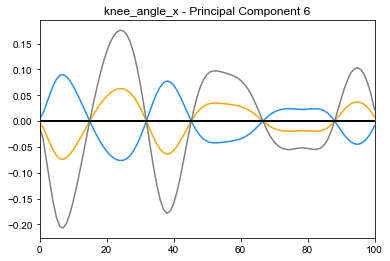

----------------------
Healthy Average: 0.044170329298316886
Injured Average: -0.03244650733287927
5th Percentile: -0.2496808952193193
95th Percentile: 0.287712872044194


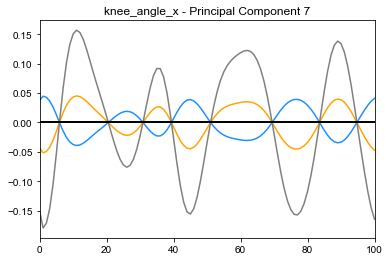

----------------------
Healthy Average: -1.1450877067759246
Injured Average: -0.0519132956761403
5th Percentile: -5.256895204069287
95th Percentile: 7.500509263916585


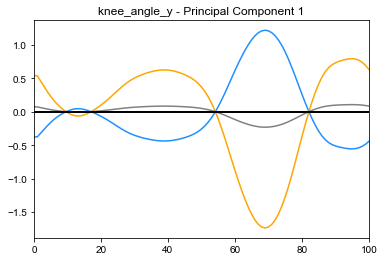

----------------------
Healthy Average: 1.6714830928005782
Injured Average: 0.6039030940599488
5th Percentile: -3.7365719532539874
95th Percentile: 4.871582589966479


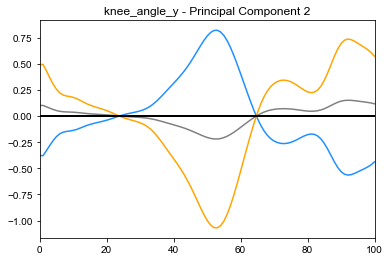

----------------------
Healthy Average: -0.6811311345065023
Injured Average: -0.345095005887158
5th Percentile: -3.694712478568352
95th Percentile: 4.046056058007231


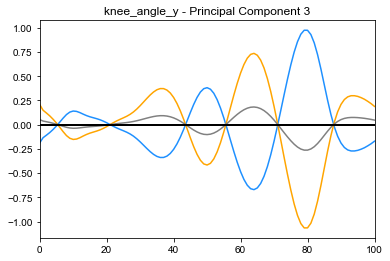

----------------------
Healthy Average: 0.4322896562982585
Injured Average: -0.25614258465800077
5th Percentile: -2.9356782788340805
95th Percentile: 3.1891199070073037


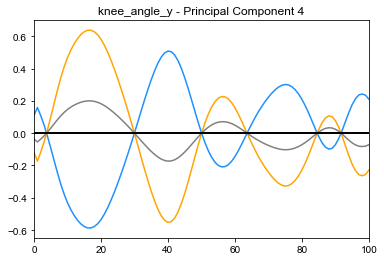

----------------------
Healthy Average: 0.11990352064264928
Injured Average: 0.38628323175219165
5th Percentile: -2.399629557924282
95th Percentile: 2.2529068150167406


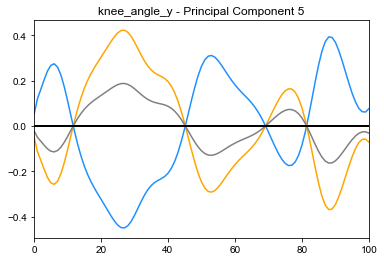

----------------------
Healthy Average: -0.21355377513665927
Injured Average: 0.2884818999340283
5th Percentile: -1.8064384077331375
95th Percentile: 1.8946602144003344


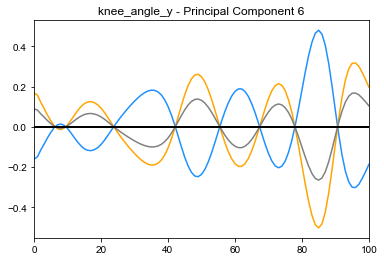

----------------------
Healthy Average: -0.07748413314155206
Injured Average: -0.5329101013746305
5th Percentile: -1.4865861339860855
95th Percentile: 1.49414077925568


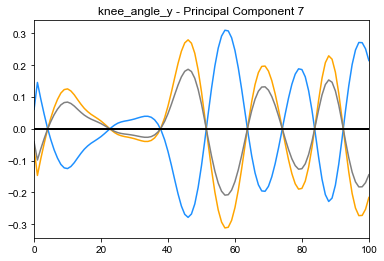

----------------------
Healthy Average: -0.07100950861940702
Injured Average: -0.884823690193412
5th Percentile: -6.102865643039236
95th Percentile: 6.985135632946529


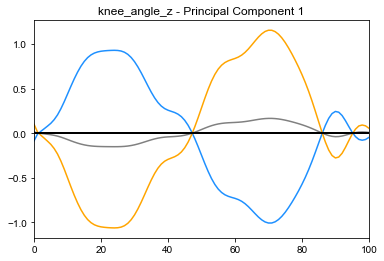

----------------------
Healthy Average: 0.2980019606528838
Injured Average: 0.08412135208976863
5th Percentile: -4.412887399093838
95th Percentile: 7.165218605710871


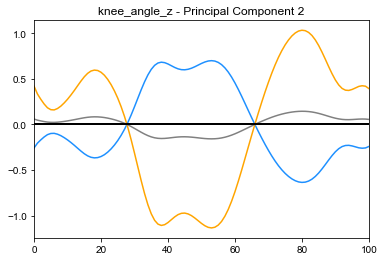

----------------------
Healthy Average: 0.05591717839765753
Injured Average: 0.03199480592964054
5th Percentile: -3.9330748787160283
95th Percentile: 5.551723348247748


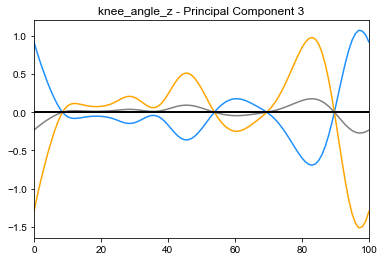

----------------------
Healthy Average: 0.20926169092925662
Injured Average: 0.6001246875157618
5th Percentile: -3.647909878726762
95th Percentile: 3.5551154780210696


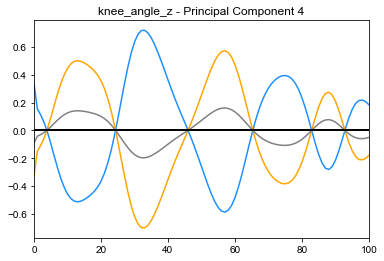

----------------------
Healthy Average: -0.9398584534810271
Injured Average: 0.08555408041067449
5th Percentile: -2.6088691807188176
95th Percentile: 3.484171843313181


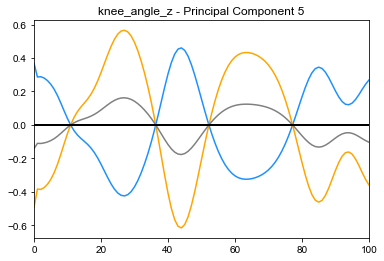

----------------------
Healthy Average: -0.5363603355354903
Injured Average: -0.35874028968372856
5th Percentile: -2.1710021769949486
95th Percentile: 2.450047758785369


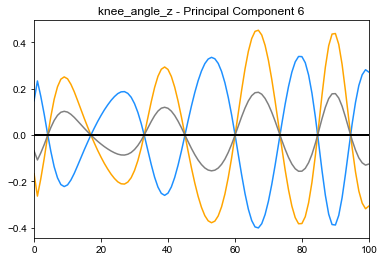

----------------------
Healthy Average: 0.2627126436947892
Injured Average: -0.47431565422063104
5th Percentile: -2.2891070421875357
95th Percentile: 2.1359768522405025


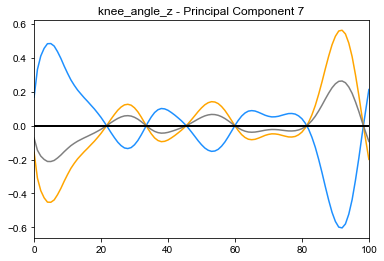

----------------------
Healthy Average: -0.5714131990309987
Injured Average: -0.252809035398427
5th Percentile: -4.389284529320857
95th Percentile: 4.353984912339691


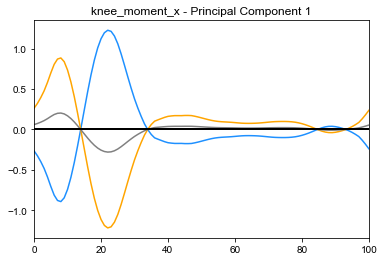

----------------------
Healthy Average: 0.16789884719510723
Injured Average: 0.5495727776907194
5th Percentile: -1.2028575474994523
95th Percentile: 1.2161046687001353


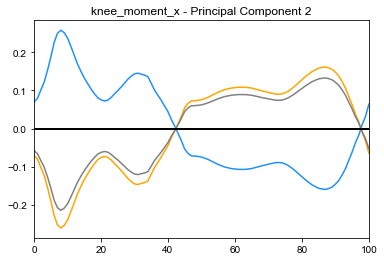

----------------------
Healthy Average: -0.09558181772181644
Injured Average: 0.06961502792559211
5th Percentile: -0.9492854360664955
95th Percentile: 1.1508207247724105


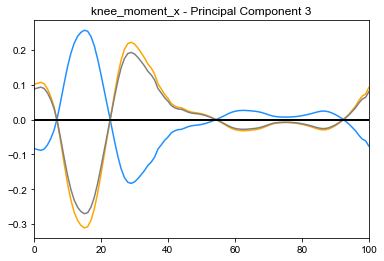

----------------------
Healthy Average: 0.3384394823467881
Injured Average: -0.3977553847288917
5th Percentile: -0.8793692561503142
95th Percentile: 0.9983029388360309


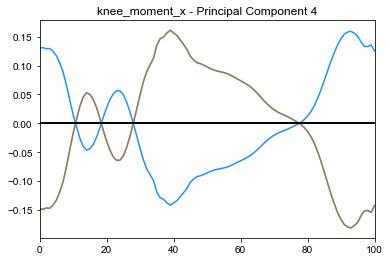

----------------------
Healthy Average: -0.03838862162209431
Injured Average: 0.17197674900440857
5th Percentile: -0.7172992114225699
95th Percentile: 0.49982350414670434


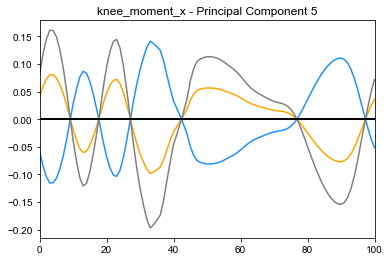

----------------------
Healthy Average: 0.031738161636230916
Injured Average: 0.06512714895775697
5th Percentile: -0.6644640851228084
95th Percentile: 0.7687958757672269


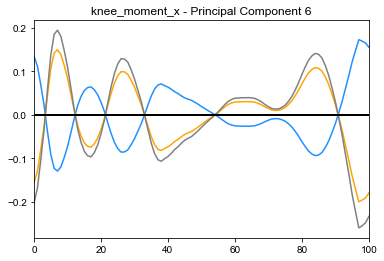

----------------------
Healthy Average: -0.031984906309405016
Injured Average: 0.016896482686125324
5th Percentile: -0.2856719947543779
95th Percentile: 0.3615698746512642


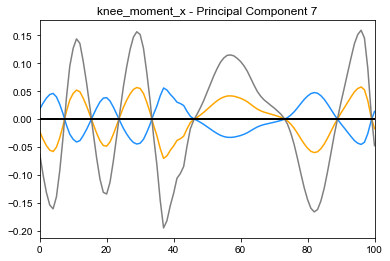

----------------------
Healthy Average: -0.6495254340963437
Injured Average: 1.9675670841961572
5th Percentile: -2.4618002439292956
95th Percentile: 7.368924578161348


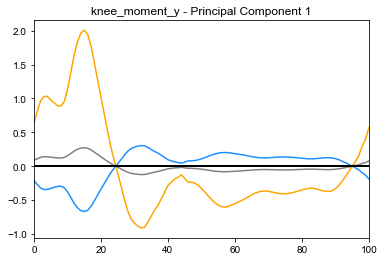

----------------------
Healthy Average: -1.0756969133063674
Injured Average: -0.3686871019736258
5th Percentile: -3.5479313645901214
95th Percentile: 5.278179779534274


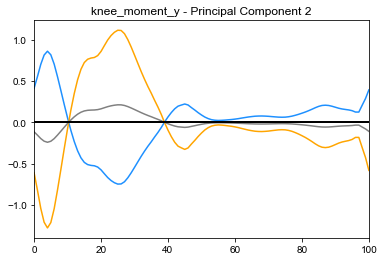

----------------------
Healthy Average: -0.06198925613371857
Injured Average: -0.14225585775532618
5th Percentile: -3.702972026085006
95th Percentile: 4.08195260508825


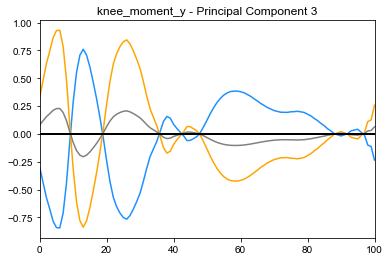

----------------------
Healthy Average: -0.06821319863669395
Injured Average: -0.29939296707094976
5th Percentile: -2.3841733677925814
95th Percentile: 1.8562482253145756


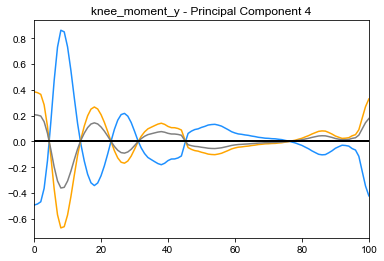

----------------------
Healthy Average: 0.36429947158135806
Injured Average: -0.63262252765785
5th Percentile: -2.0279685251905137
95th Percentile: 1.8327797867681468


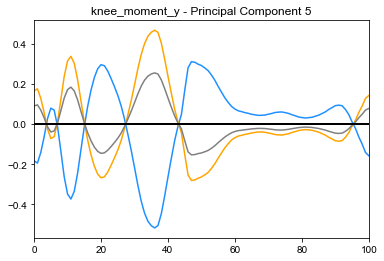

----------------------
Healthy Average: 0.026638243728547846
Injured Average: -0.1696069629125844
5th Percentile: -1.45856290766415
95th Percentile: 1.2784642208441923


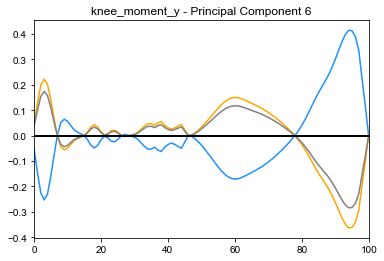

----------------------
Healthy Average: -0.10500865174888147
Injured Average: -0.0668431608250343
5th Percentile: -1.4250541739509857
95th Percentile: 1.0568650819653218


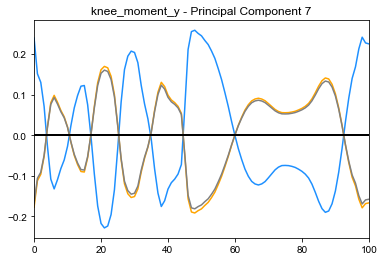

----------------------
Healthy Average: -0.7234684406476641
Injured Average: 1.4501301506207702
5th Percentile: -4.244802764167627
95th Percentile: 14.849463379228728


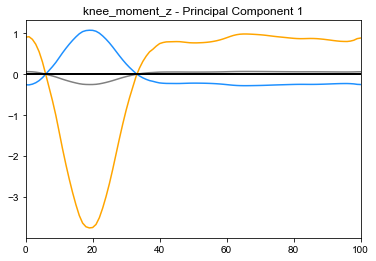

----------------------
Healthy Average: 0.023594713937204255
Injured Average: 0.28269483748781715
5th Percentile: -3.454485044833115
95th Percentile: 4.664790086613979


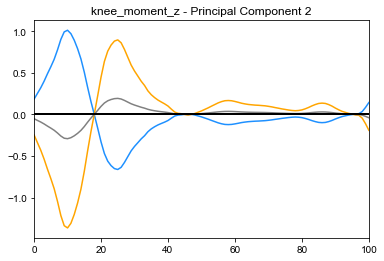

----------------------
Healthy Average: 0.21137122318348733
Injured Average: 0.043783413383873496
5th Percentile: -2.226550455658331
95th Percentile: 2.370872949033501


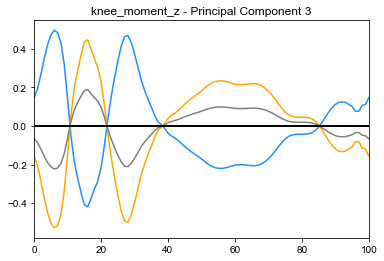

----------------------
Healthy Average: -0.06429986731796805
Injured Average: -0.5703431976066418
5th Percentile: -1.2837190268733196
95th Percentile: 1.4775256793333877


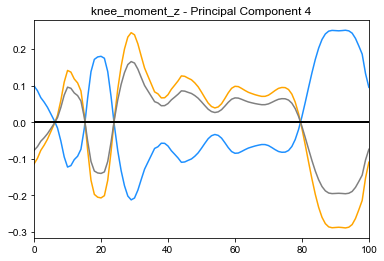

----------------------
Healthy Average: 0.12748937273142272
Injured Average: 0.016813905967975214
5th Percentile: -1.371240998358473
95th Percentile: 1.0551704265500261


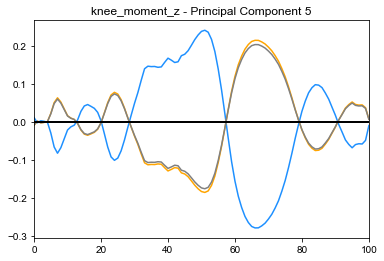

----------------------
Healthy Average: 0.15622243890832757
Injured Average: 0.22602341968111944
5th Percentile: -0.8128776694524051
95th Percentile: 1.0311311017394098


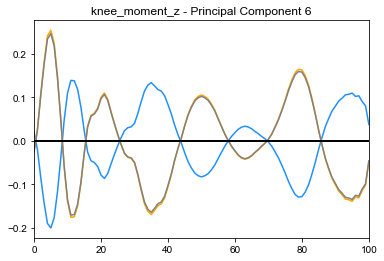

----------------------
Healthy Average: -0.026909649339858222
Injured Average: 0.035327779273582625
5th Percentile: -0.8811625988459587
95th Percentile: 1.0820139490054017


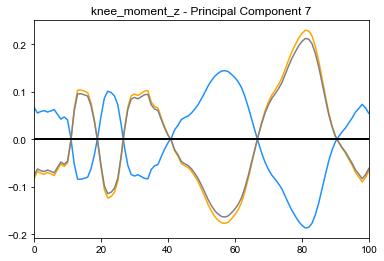

<Figure size 432x288 with 0 Axes>

In [210]:
#create a directory of the PC scores matrices
os.chdir('/Users/rossbrancati/Desktop/PFP_Project/kinetic_kinematic/Data/PCA_matrices/individual_means_both_minutes/')
PC_scores_dir = sorted(os.listdir(os.path.join(os.getcwd(), 'PCA_scores')))
PC_scores_dir_path = os.path.join(os.getcwd(), 'PCA_scores')

#create a directory for the loadings of the PC_score matrices
os.chdir('/Users/rossbrancati/Desktop/PFP_Project/kinetic_kinematic/Data/PCA_matrices/individual_means_both_minutes/')
loadings_dir = os.path.join(os.getcwd(), 'loadings')

for file_idx, file_name in enumerate(PC_scores_dir):
    
    #get the current PC_scores_file
    current_score_path = os.path.join(PC_scores_dir_path,file_name)
    current_score_matrix = pd.read_csv(current_score_path,sep='\t')
    #load the loadings matrix 
    current_loadings_mat_path = loadings_dir+'/loadings_'+file_name
    current_loadings_matrix = pd.read_csv(current_loadings_mat_path,sep='\t')
    
    
    #set range to 7 because the highest relevant PC is PC 7. 
    for PC_num in range(7):
        
        #extract the row of the loadings matrix for the current PC
        current_loading_PC = np.array(current_loadings_matrix.loc[PC_num,:])
        current_loading_PC = current_loading_PC[1:]
        
        #extract first column of the PC_scores matrix
        current_PC_scores = np.array(current_score_matrix)
        current_PC_scores_vector = current_PC_scores[:,PC_num+1]
        #5th percentile:
        fifth_percentile = np.percentile(current_PC_scores_vector, 5)
        mean_healthy = np.average(current_PC_scores_vector[51:68])
        #95th percentile:
        mean_injured = np.average(current_PC_scores_vector[68:81])
        nintyfifth_percentile = np.percentile(current_PC_scores_vector, 95)
        
        #Create a string for the current principal component
        PC_number = str(PC_num+1)
        
        #Plot the loading vector multiplied by the 5th and 95th percentile of PC_score
        #plt.figure(PC_num)
        print("----------------------")
        print('Healthy Average:', mean_healthy)
        print('Injured Average:', mean_injured)
        print('5th Percentile:', fifth_percentile)
        print('95th Percentile:', nintyfifth_percentile)
        plt.ion()
        plt.plot(current_loading_PC*fifth_percentile, color = "dodgerblue")
        plt.plot(current_loading_PC*nintyfifth_percentile, color = "orange")
        plt.plot(current_loading_PC, color='gray')
        plt.plot([0, 100], [0, 0], color='k', linewidth=2)
        plt.xlim(0,100)
        plt.title(file_name[0:-4]+' - Principal Component '+PC_number)
        plt.show()
        #plt.savefig('/Users/rossbrancati/Desktop/PFP_Project/kinetic_kinematic/plots/5_and_95_plots/'+file_name[0:-4]+'/'+file_name[0:-4]+'_PC_'+PC_number)
        plt.clf()

To help with interpretation, create a waveform plot of the healthy and injured groups at minute 1

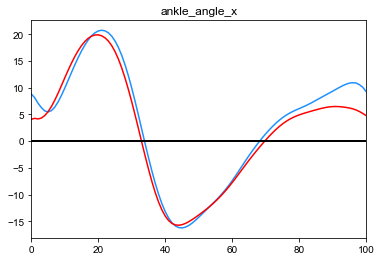

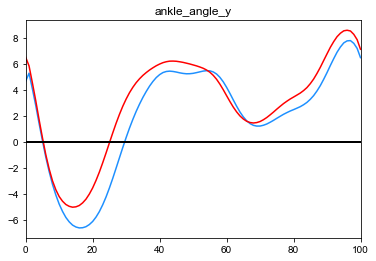

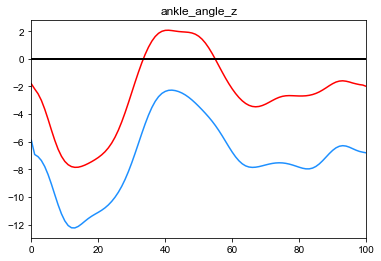

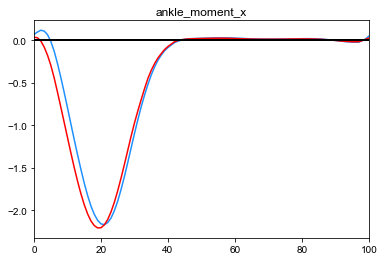

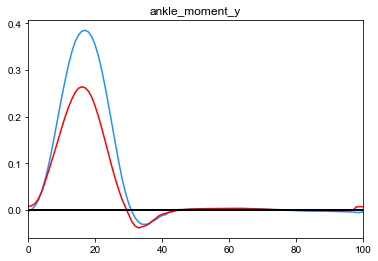

...

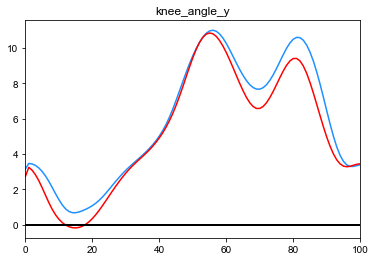

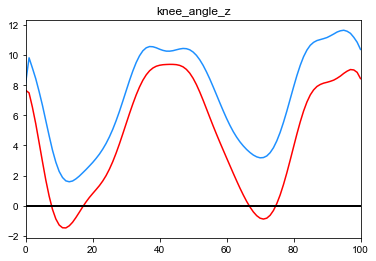

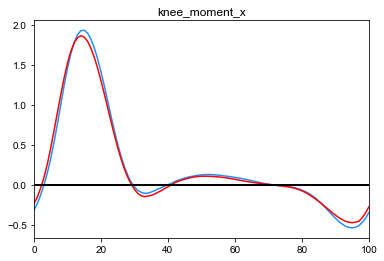

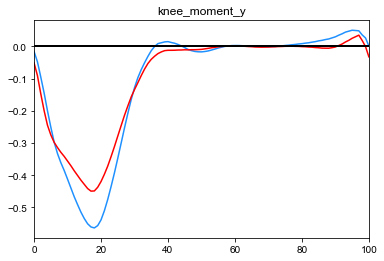

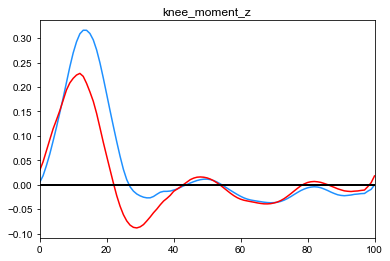

<Figure size 432x288 with 0 Axes>

In [208]:
#create an empty numpy array to store the mean of every variable in
all_kin_variable_means_M21 = np.empty((101,18))
kin_headers_M21 = []

#create a directory of the metric matrices
os.chdir('/Users/rossbrancati/Desktop/PFP_Project/kinetic_kinematic/Data/metric_matrices/individual_means/all_groups')
PC_scores_dir = sorted(os.listdir(os.getcwd()))
PC_scores_dir.remove(".DS_Store")

#loop over files in directory
for file_idx, file_name in enumerate(PC_scores_dir):
    
    #load the file
    current_file = pd.read_csv('/Users/rossbrancati/Desktop/PFP_Project/kinetic_kinematic/Data/metric_matrices/individual_means/all_groups/'+file_name, header=None, sep='\t')
    #convert first 35 rows to array
    healthy_mean_21 = np.array(current_file.loc[51:68,:])
    injured_mean_21 = np.array(current_file.loc[68:81,:])
    all_mean_21 = np.array(current_file.iloc[51:68])
    
    #append mean of all observations to array
    all_kin_variable_means_M21[:,file_idx] = (np.mean(all_mean_21, axis=0))
    #append file name to list of headers
    kin_headers_M21.append(file_name[0:-4])
    
    #plot the mean waveform of the healthy and injured runners
    plt.ion()
    plt.plot((np.mean(healthy_mean_21, axis=0)), color = 'dodgerblue')
    plt.plot((np.mean(injured_mean_21, axis=0)), color = 'red')
    plt.plot([0, 100], [0, 0], color='k', linewidth=2)
    plt.xlim(0,100)
    plt.title(file_name[0:-4])
    plt.show()
    plt.clf()
    
kin_M21_means_df = pd.DataFrame(all_kin_variable_means_M21, columns=kin_headers_M21)
kin_M21_means_df.to_csv("/Users/rossbrancati/Desktop/PFP_Project/machine_learning/machine_learning_data/results_feb_2022/mean_waveforms/kin_variable_means_M21.csv")

**Repeat for EMG data**

----------------------
Healthy Average: -0.23723371125305204
Injured Average: 0.11798973399745295
5th Percentile: -1.5986379313056205
95th Percentile: 1.681789509936545


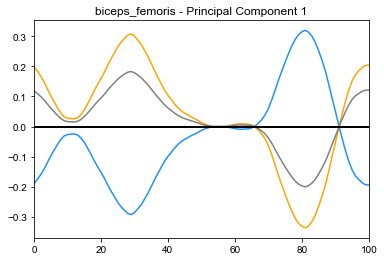

----------------------
Healthy Average: 0.14251509338100674
Injured Average: 0.24604297954098647
5th Percentile: -1.3165951868862746
95th Percentile: 1.4159130651878242


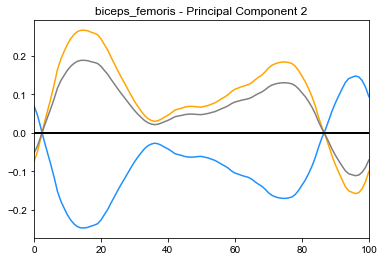

----------------------
Healthy Average: -0.028631905179316543
Injured Average: 0.1639671094472273
5th Percentile: -0.9316688324793225
95th Percentile: 1.4530060239815175


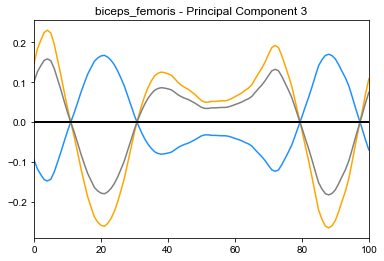

----------------------
Healthy Average: -0.19241380221113957
Injured Average: 0.15682795648520534
5th Percentile: -0.9319063326973622
95th Percentile: 0.9746411479163419


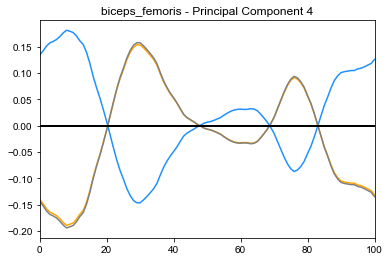

----------------------
Healthy Average: 0.0755057225225698
Injured Average: -0.07230663003546955
5th Percentile: -1.724565994655777
95th Percentile: 1.7021906494366696


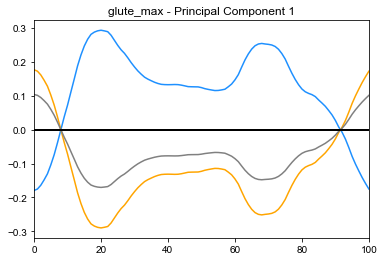

----------------------
Healthy Average: -0.12695943188353492
Injured Average: -0.3550148710977347
5th Percentile: -1.239610102183534
95th Percentile: 1.911761753173384


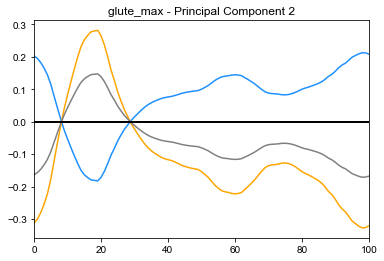

----------------------
Healthy Average: 0.16160184088509225
Injured Average: -0.32323462138314313
5th Percentile: -0.8075298851296041
95th Percentile: 0.9685675513985452


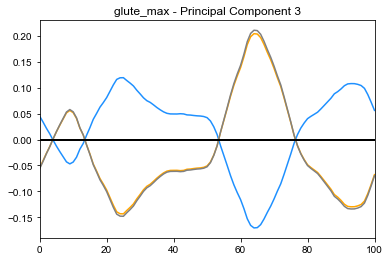

----------------------
Healthy Average: -0.1636090984709124
Injured Average: 0.11604806859859465
5th Percentile: -0.524140366491944
95th Percentile: 0.9146264384244267


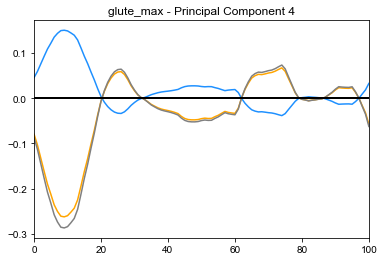

----------------------
Healthy Average: -0.3211168389893834
Injured Average: -0.06961580951418198
5th Percentile: -1.7521009652748474
95th Percentile: 1.9733276693138346


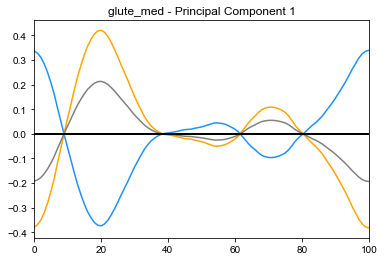

----------------------
Healthy Average: 0.22989413303094758
Injured Average: 0.05143124597755448
5th Percentile: -0.9920908530637336
95th Percentile: 1.8361943732038275


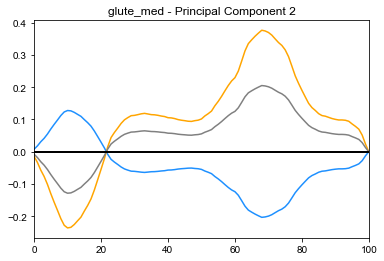

----------------------
Healthy Average: -0.12740577797914254
Injured Average: 0.474273634343764
5th Percentile: -0.9965482061607845
95th Percentile: 1.0178544853396914


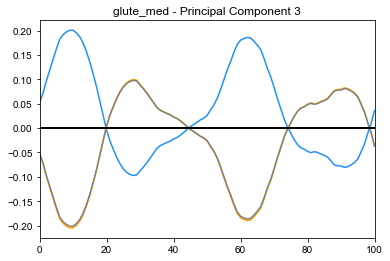

----------------------
Healthy Average: -0.19994396172541462
Injured Average: -0.020413477602385856
5th Percentile: -0.6849402566819448
95th Percentile: 0.5068210397623862


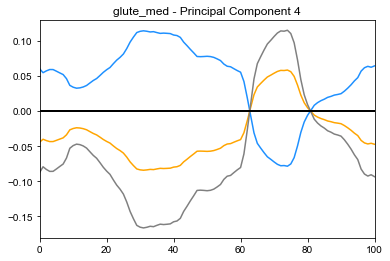

----------------------
Healthy Average: -0.07153636085854406
Injured Average: -0.14964797795286164
5th Percentile: -1.834409924548988
95th Percentile: 2.103137793267805


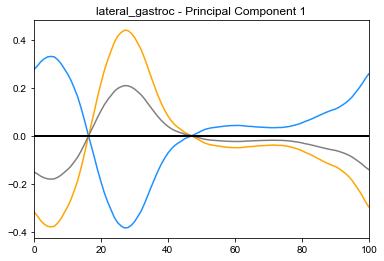

----------------------
Healthy Average: -0.25294944198884206
Injured Average: 0.22946481163601676
5th Percentile: -0.780014410155776
95th Percentile: 1.1932566649562237


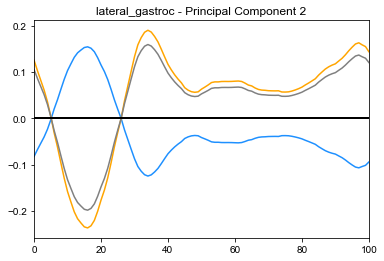

----------------------
Healthy Average: 0.26366802567703734
Injured Average: 0.21119657482573875
5th Percentile: -0.6762386897252799
95th Percentile: 0.7498682666305527


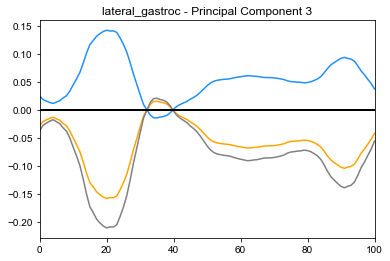

----------------------
Healthy Average: -0.007417534563233953
Injured Average: -0.23382989206743526
5th Percentile: -0.5357215973169448
95th Percentile: 0.2715046806918536


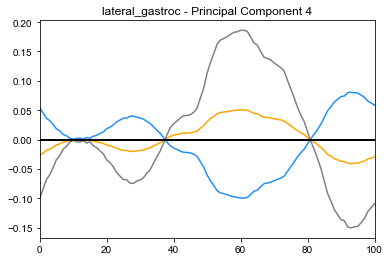

----------------------
Healthy Average: -0.027348095468661113
Injured Average: -0.369057435270372
5th Percentile: -1.846032080394542
95th Percentile: 2.2013652394292076


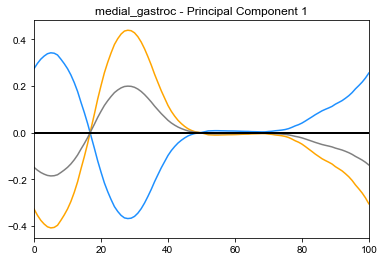

----------------------
Healthy Average: -0.07766899044147037
Injured Average: 0.45919060016622376
5th Percentile: -0.7253959656448745
95th Percentile: 1.25123343626033


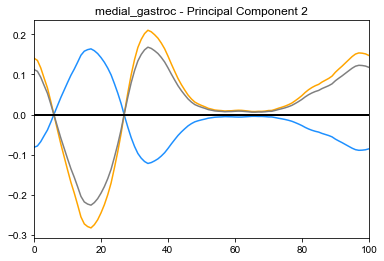

----------------------
Healthy Average: -0.31430371243407285
Injured Average: 0.11113954791274355
5th Percentile: -0.6027561562291701
95th Percentile: 0.9043738772218386


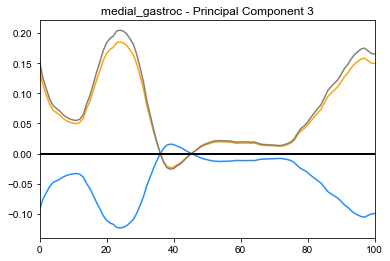

----------------------
Healthy Average: 0.09420931786003997
Injured Average: -0.039425718170087484
5th Percentile: -0.45851805475226826
95th Percentile: 0.5114186537020722


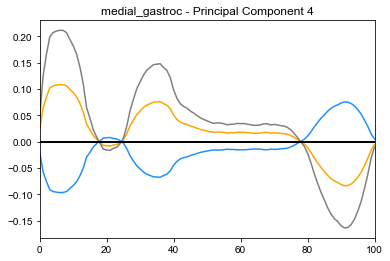

----------------------
Healthy Average: 0.05937811787902335
Injured Average: 0.7479845033745941
5th Percentile: -2.132784573134908
95th Percentile: 1.6845856253223401


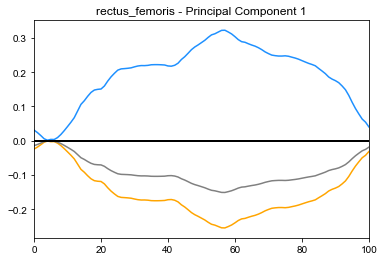

----------------------
Healthy Average: -0.09980921127281057
Injured Average: -0.1026023780438848
5th Percentile: -1.3140605952762403
95th Percentile: 1.6594442394472617


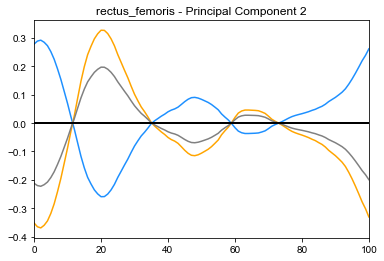

----------------------
Healthy Average: -0.11960307475694698
Injured Average: 0.16818789265454434
5th Percentile: -0.6828192447315544
95th Percentile: 1.2455426500586726


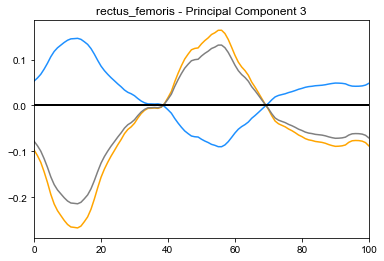

----------------------
Healthy Average: -0.08513564672239234
Injured Average: 0.09677523422852533
5th Percentile: -0.7921507453216863
95th Percentile: 0.7460866603697098


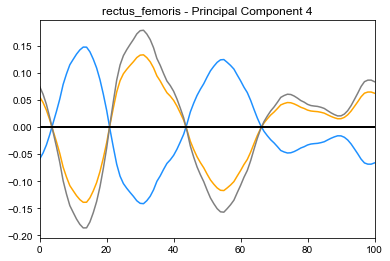

----------------------
Healthy Average: -0.056764530657436814
Injured Average: -0.13828579672705335
5th Percentile: -1.6417820056035661
95th Percentile: 1.7116084654795927


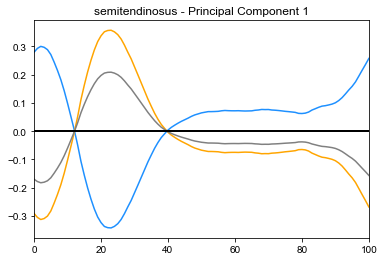

----------------------
Healthy Average: -0.3360978988512815
Injured Average: -0.03596477693998174
5th Percentile: -0.8959421820273802
95th Percentile: 1.6553938076978385


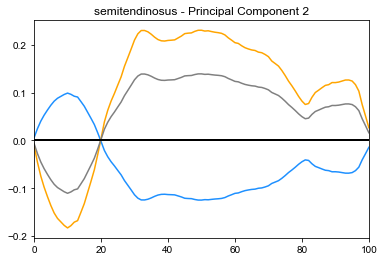

----------------------
Healthy Average: -0.11908966424651007
Injured Average: 0.19635348896834665
5th Percentile: -0.637634384372366
95th Percentile: 0.791600238382189


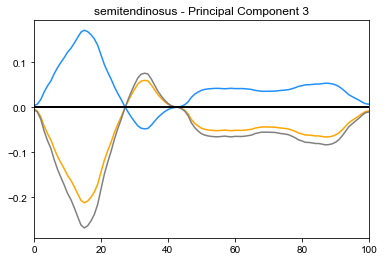

----------------------
Healthy Average: -0.01758958705948687
Injured Average: -0.11869224772484088
5th Percentile: -0.2350965321144949
95th Percentile: 0.374034039737902


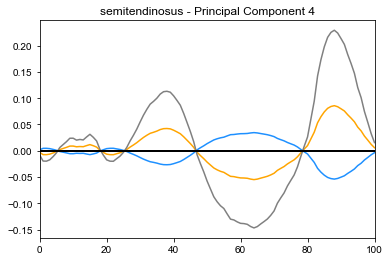

----------------------
Healthy Average: 0.0339925395957493
Injured Average: 0.16317581850026647
5th Percentile: -1.3503343173449855
95th Percentile: 2.194833627307267


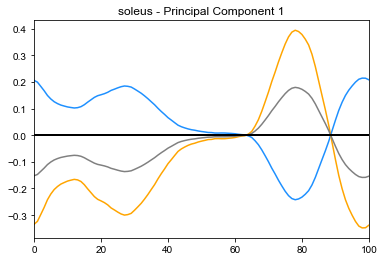

----------------------
Healthy Average: 0.2574987267442751
Injured Average: 0.23078023503609243
5th Percentile: -1.0270811216226758
95th Percentile: 1.6207969285179924


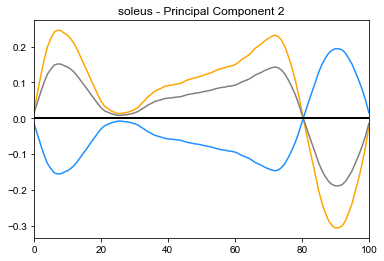

----------------------
Healthy Average: -0.03024637644438008
Injured Average: 0.016657886844854444
5th Percentile: -1.2289050285683534
95th Percentile: 1.3983074714845547


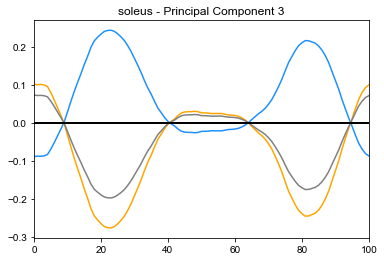

----------------------
Healthy Average: -0.27083671814208043
Injured Average: 0.286086014134748
5th Percentile: -0.7869884712271441
95th Percentile: 1.053409325569511


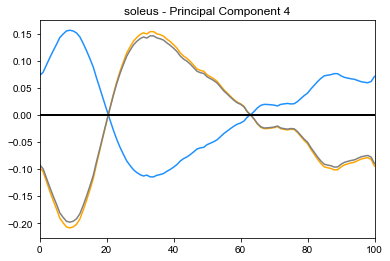

----------------------
Healthy Average: -0.17667528129671786
Injured Average: 0.07455664470510645
5th Percentile: -1.360640647574514
95th Percentile: 2.2511370432708557


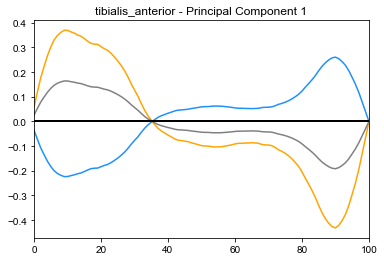

----------------------
Healthy Average: 0.18643522381206754
Injured Average: 0.13261826880780636
5th Percentile: -1.3083757458884406
95th Percentile: 1.7580830281421647


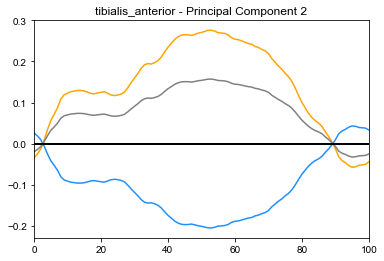

----------------------
Healthy Average: -0.15119580589856438
Injured Average: 0.36185497309771925
5th Percentile: -0.8717166970189713
95th Percentile: 1.6602045721116836


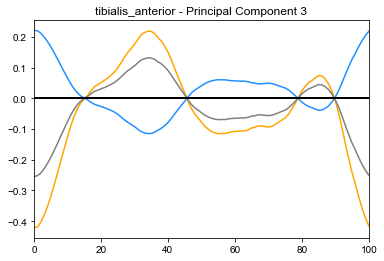

----------------------
Healthy Average: -0.0213665708347394
Injured Average: 0.0755927523758125
5th Percentile: -0.7338517668982283
95th Percentile: 0.7229874410532996


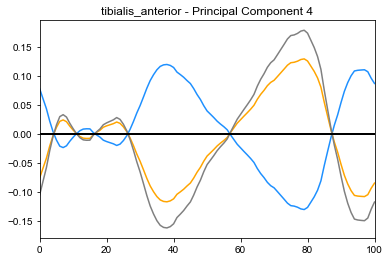

----------------------
Healthy Average: -0.16064492234451044
Injured Average: -0.09984993355944966
5th Percentile: -1.869877277616089
95th Percentile: 1.9421898405498252


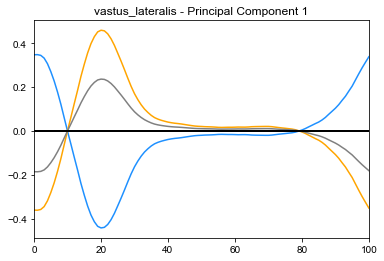

----------------------
Healthy Average: -0.014108619075728085
Injured Average: 0.19582271828205725
5th Percentile: -0.7480208202797831
95th Percentile: 1.4120281718328438


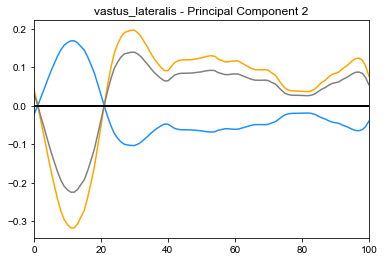

----------------------
Healthy Average: -0.019306155177506435
Injured Average: -0.2511677242639833
5th Percentile: -0.5330822773737935
95th Percentile: 0.3839286177353984


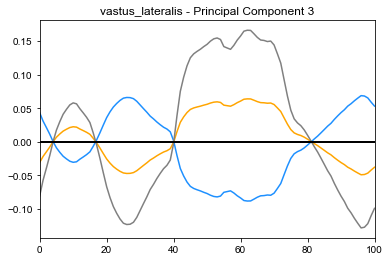

----------------------
Healthy Average: 0.13620731058663757
Injured Average: -0.2826205924413249
5th Percentile: -0.46789789465813103
95th Percentile: 0.7281694570631325


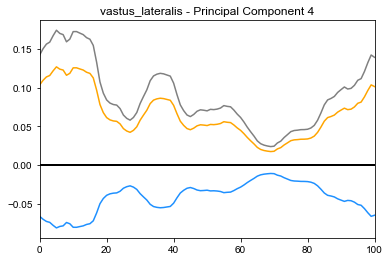

----------------------
Healthy Average: -0.3394789609942318
Injured Average: -0.11238732499568455
5th Percentile: -1.7852796729584586
95th Percentile: 2.106006884363552


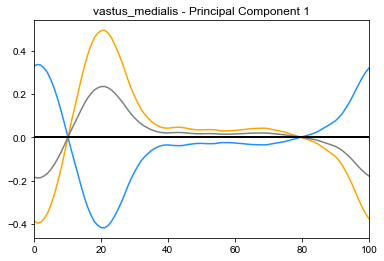

----------------------
Healthy Average: -0.20475666428841857
Injured Average: 0.20279060261708937
5th Percentile: -0.7719873770281533
95th Percentile: 1.4402651866126723


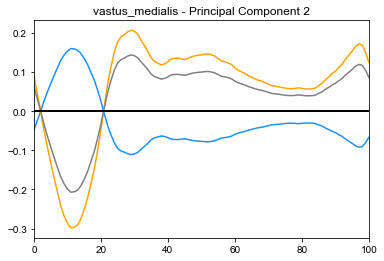

----------------------
Healthy Average: -0.025755853896018387
Injured Average: -0.41197715047436756
5th Percentile: -0.640462505329721
95th Percentile: 0.5578835139193914


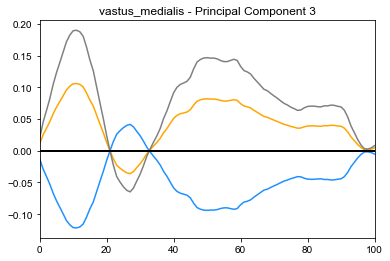

----------------------
Healthy Average: 0.019283083717740943
Injured Average: -0.11878786694451336
5th Percentile: -0.37321206217784814
95th Percentile: 0.4330017670661761


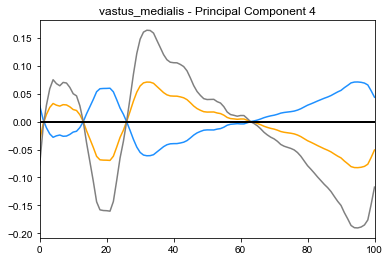

<Figure size 432x288 with 0 Axes>

In [212]:
# create a directory of the PC scores matrices
os.chdir('/Users/rossbrancati/Desktop/PFP_Project/EMG/Data/PCA_matrices/individual_means/')
PC_scores_dir = sorted(os.listdir(os.path.join(os.getcwd(), 'PCA_scores')))
PC_scores_dir_path = os.path.join(os.getcwd(), 'PCA_scores')

#create a directory for the loadings of the PC_score matrices
os.chdir('/Users/rossbrancati/Desktop/PFP_Project/EMG/Data/PCA_matrices/individual_means/')
loadings_dir = os.path.join(os.getcwd(), 'loadings')

for file_idx, file_name in enumerate(PC_scores_dir):
    
    #get the current PC_scores_file
    current_score_path = os.path.join(PC_scores_dir_path,file_name)
    current_score_matrix = pd.read_csv(current_score_path,sep='\t')
    #load the loadings matrix 
    current_loadings_mat_path = loadings_dir+'/loadings_'+file_name
    current_loadings_matrix = pd.read_csv(current_loadings_mat_path,sep='\t')
    
    
    #set range to 4 because the highest EMG feature was the 4th PC
    for PC_num in range(4):
        
        #extract the row of the loadings matrix for the current PC
        current_loading_PC = np.array(current_loadings_matrix.loc[PC_num,:])
        current_loading_PC = current_loading_PC[1:]
        
        #extract first column of the PC_scores matrix
        current_PC_scores = np.array(current_score_matrix)
        current_PC_scores_vector = current_PC_scores[:,PC_num+1]
        #5th percentile:
        fifth_percentile = np.percentile(current_PC_scores_vector, 5)
        mean_healthy = np.average(current_PC_scores_vector[51:68])
        #95th percentile:
        mean_injured = np.average(current_PC_scores_vector[68:81])
        nintyfifth_percentile = np.percentile(current_PC_scores_vector, 95)
        
        #Create a string for the current principal component
        PC_number = str(PC_num+1)
        
        #Plot the loading vector multiplied by the 5th and 95th percentile of PC_score
        #plt.figure(PC_num)
        print("----------------------")
        print('Healthy Average:', mean_healthy)
        print('Injured Average:', mean_injured)
        print('5th Percentile:', fifth_percentile)
        print('95th Percentile:', nintyfifth_percentile)
        plt.ion()
        plt.plot(current_loading_PC*fifth_percentile, color = "dodgerblue")
        plt.plot(current_loading_PC*nintyfifth_percentile, color = "orange")
        plt.plot(current_loading_PC, color='gray')
        plt.plot([0, 100], [0, 0], color='k', linewidth=2)
        plt.xlim(0,100)
        plt.title(file_name[0:-4]+' - Principal Component '+PC_number)
        plt.show()
        #plt.savefig('/Users/rossbrancati/Desktop/PFP_Project/kinetic_kinematic/plots/5_and_95_plots/'+file_name[0:-4]+'/'+file_name[0:-4]+'_PC_'+PC_number)
        plt.clf()

To help with interpretation, create a waveform plot of the healthy and injured groups at minute 21

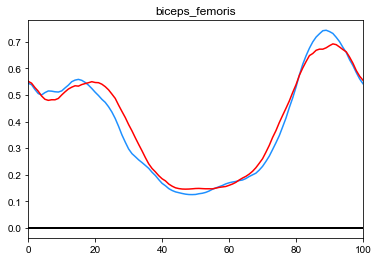

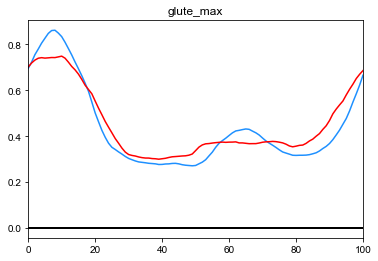

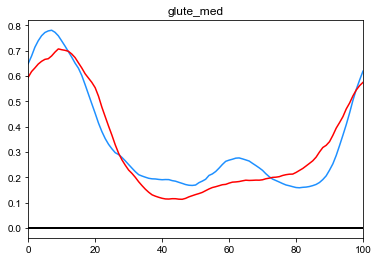

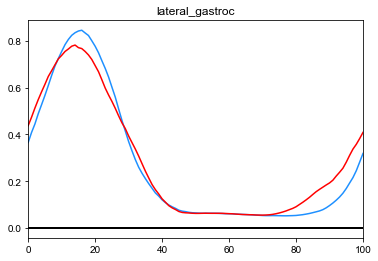

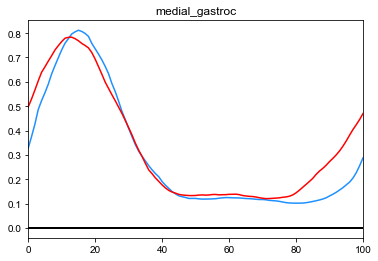

...

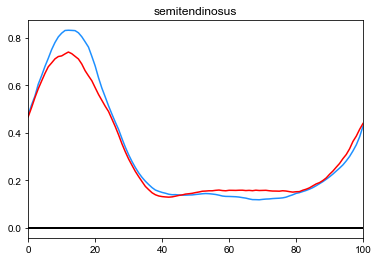

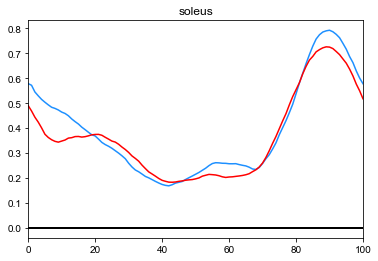

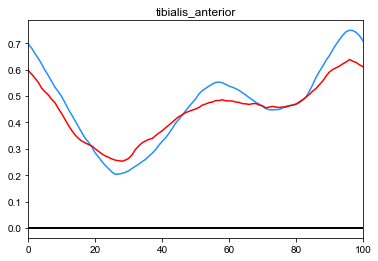

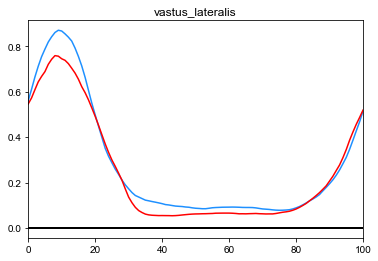

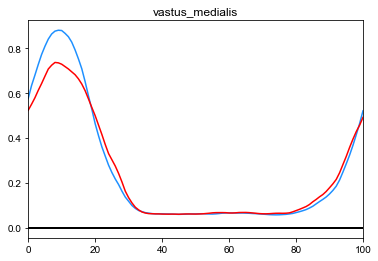

<Figure size 432x288 with 0 Axes>

In [214]:
#create an empty numpy array to store the mean of every variable in
all_emg_variable_means_M21 = np.empty((101,11))
emg_headers_M21 = []

#create a directory of the metric matrices
os.chdir('/Users/rossbrancati/Desktop/PFP_Project/EMG/Data/metric_matrices/individual_means/all_groups')
PC_scores_dir = sorted(os.listdir(os.getcwd()))

#loop over files in directory
for file_idx, file_name in enumerate(PC_scores_dir):
    
    #load the file
    current_file = pd.read_csv('/Users/rossbrancati/Desktop/PFP_Project/EMG/Data/metric_matrices/individual_means/all_groups/'+file_name, header=None, sep='\t')
    #convert first 35 rows to array
    healthy_mean_21 = np.array(current_file.loc[51:68,:])
    injured_mean_21 = np.array(current_file.loc[68:81,:])
    all_mean_21 = np.array(current_file.iloc[51:81])
    
    #append mean of all observations to array
    all_emg_variable_means_M21[:,file_idx] = (np.mean(all_mean_21, axis=0))
    #append file name to list of headers
    emg_headers_M21.append(file_name[0:-4])
    
    #plot the mean waveform of the healthy and injured runners
    plt.ion()
    plt.plot((np.mean(healthy_mean_21, axis=0)), color = 'dodgerblue')
    plt.plot((np.mean(injured_mean_21, axis=0)), color = 'red')
    #plt.plot((np.mean(all_mean_21, axis=0)), color = 'red')

    plt.plot([0, 100], [0, 0], color='k', linewidth=2)
    plt.xlim(0,100)
    plt.title(file_name[0:-4])
    plt.show()
    plt.clf()
    
emg_M21_means_df = pd.DataFrame(all_emg_variable_means_M21, columns=emg_headers_M21)
emg_M21_means_df.to_csv("/Users/rossbrancati/Desktop/PFP_Project/machine_learning/machine_learning_data/results_feb_2022/mean_waveforms/emg_variable_means_M21.csv")

**That wraps it up. This runs in parallel with the paper I am writing on this analysis and I plan to include a link in the paper to this notebook on GitHub for anyone who is interested.**

**------------------------------------------------------------------------------------------------------------------------------------**

**Determining how the recovered individuals are separated using important features**

1. Train SVM on healthy and injured - classify the recovered group
2. Save predicted labels for recovered group
3. Create matrix of PC scores for only recovered group
4. Scatter plot the PC scores using recovered labels as groups
5. Determine which features (out of the important ones) show good separation between the recovered-healthy and recovered-injured
6. Interpret these features, may tell us something that is not actually recovering in all runners.

Training on healthy and injured, testing on recovered at minute 1

In [94]:
#build the classifier
clf_recovered = SVC(C=1, kernel='linear')

#split training and testing data
X_train = features_df_new[0:35]
X_test = features_df_new[35::]
y_train = labels_means[0:35]
y_test = labels_means[35::]

#fit the model with training data
clf_recovered.fit(X_train, y_train)

#generate prediction of the testing dataset
y_pred = clf_recovered.predict(X_test)


Healthy Count: 23
Injured Count: 0


([0, 1], [Text(0, 0, ''), Text(0, 0, '')])

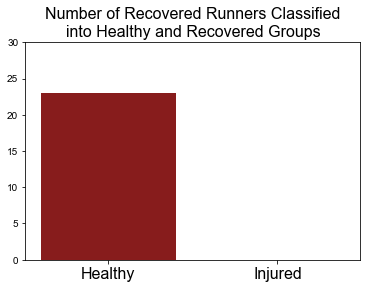

In [95]:
#counts of healthy and injured predictions
healthy_count = np.count_nonzero(y_pred == 1)
injured_count = np.count_nonzero(y_pred == 2)

print('Healthy Count:', healthy_count)
print('Injured Count:', injured_count)

plt.rcParams.update({'font.sans-serif':'Arial'})

fig = plt.figure()
classes = ['Healthy','Injured']
counts = [healthy_count, injured_count]
plt.bar(classes,counts, color=(0.53,.109,.109,1))
plt.title('Number of Recovered Runners Classified\ninto Healthy and Recovered Groups', size=16)
plt.ylim(0,30)
plt.xticks(size=16)

**Determining which recovered subjects classified as healthy and injured**

In [96]:
#generate an array with 
y_test_array = y_test.to_numpy()

recovered_subject_ids = np.array([14,15,28,30,31,33,35,37,42,43,46,48,49,50,58,59])
stacked = np.vstack((recovered_subject_ids, np.reshape(y_test_array, (16,)), y_pred))
stacked_transpose = np.transpose(stacked)
recovered_df = pd.DataFrame(stacked_transpose, columns = ['ID', 'Label', 'Prediction'])
recovered_df

ValueError: cannot reshape array of size 61 into shape (16,)

In [ ]:
#loop over each feature
for i in features_df_new.iteritems():
    plt.figure()
    fig.set_size_inches(4, 4)
    plt.scatter(y_pred, i[1][35::])
    plt.title(i[0])
    plt.show()
    plt.clf()

In [ ]:
recovered_data = features_df_new[35::]


In [ ]:
recovered_data.insert(2, 'ID', [14,15,28,30,31,33,35,37,42,43,46,48,49,50,58,59,14,15,28,30,31,33,35,37,42,43,46,48,49,50,59], True)

In [ ]:
recovered_data

In [ ]:
colors = {'14':'red', '15':'orange', '28':'yellow', '30':'green', '31':'blue', '33':'purple', '35':'dimgrey', '37':'lightcoral', '42':'lawngreen', '43':'cyan', '46':'deepskyblue', '48':'mediumpurple', '49':'magenta', '50':'hotpink', '58':'black', '59':'silver'}

In [ ]:
for i in recovered_data.iteritems():
    plt.figure()
    fig.set_size_inches(4, 4)
    plt.scatter(y_pred, i[1], c=recovered_data['ID'].map(colors))
    plt.title(i[0])
    plt.show()
    plt.clf()

**We also want to know what the important features are in the model that classifies the recoverd subjects**

In [ ]:
print(clf_recovered.coef_)
print(features_df_new.columns)
pd.Series(abs(clf_recovered.coef_[0]), index=features_df_new.columns).nlargest(8).plot(kind='barh')

In [ ]:
#One way ANOVA to look for significantly different features within the recovered groupings
#get labels of healthy and injured labeled recovered runners
healthy_labels = np.where(y_pred == 1)
injured_labels = np.where(y_pred == 3)

#import anova function
from scipy.stats import f_oneway

for i in features_df_new.iteritems():
    print(i[0]+':')
    current_col = i[1][35::].values
    healthy_scores = current_col[healthy_labels]
    injured_scores = current_col[injured_labels]
    print(f_oneway(healthy_scores, injured_scores))
    print('-----------------------')
